Using cpu device
train_x tensor([[ 1.3569, -0.8837],
        [-1.5907,  0.1370],
        [-1.4434,  1.0826],
        [-0.4948,  1.2709],
        [ 0.4135,  0.3247],
        [-1.7203, -1.1638],
        [ 1.1705,  1.7542],
        [-0.4591, -0.2105],
        [-0.1662,  1.3950],
        [ 1.3986, -1.0389],
        [ 0.4857,  0.1655],
        [ 1.5166, -0.3407],
        [ 0.8754, -0.7051],
        [-0.3029, -0.8829],
        [ 1.1095,  0.7375],
        [-0.0733, -0.2878],
        [ 0.3206, -0.6386],
        [ 1.0773,  1.4464],
        [ 0.6677, -1.1089],
        [-0.7305, -1.1166],
        [-0.9701,  0.8653],
        [-0.4169, -1.4936],
        [ 0.4094, -1.3493],
        [-1.3601, -0.5664],
        [ 0.9986,  0.3942],
        [-1.1514,  1.1340],
        [-0.9133,  0.9022],
        [-1.2087,  1.3631],
        [-0.2943, -1.2463],
        [-1.6026, -0.2980],
        [ 0.5952,  1.7363],
        [-0.4442, -1.2223],
        [ 1.0668, -0.1179],
        [-1.7134,  0.3365],
        [-0.9718, -0.39

d:\miniconda\Lib\site-packages\torch\nn\modules\loss.py:608: UserWarning: Using a target size (torch.Size([9216])) that is different to the input size (torch.Size([9216, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
d:\miniconda\Lib\site-packages\torch\nn\modules\loss.py:608: UserWarning: Using a target size (torch.Size([48])) that is different to the input size (torch.Size([48, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


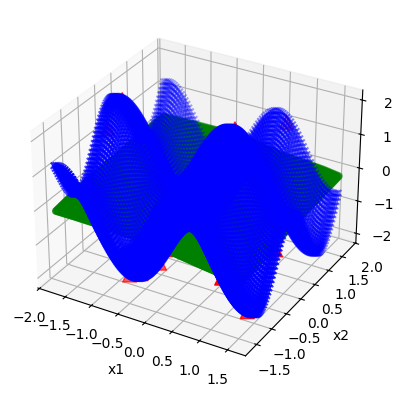

****************************************************************
Epoch 500/2000 Done, Total Loss: 0.13310641857484976
net_outputs_test[0] [ 0.15334342  0.194427    0.23551099 ... -1.578904   -1.5493637
 -1.5198244 ]
Prediction min: -2.5929549
Prediction max: 2.1634812


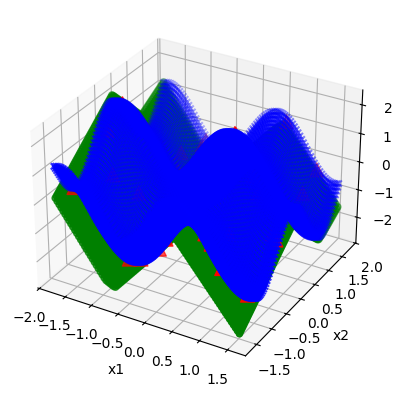

****************************************************************
Epoch 1000/2000 Done, Total Loss: 0.10339366799841325
net_outputs_test[0] [-0.15158996 -0.09992821 -0.04826609 ... -1.3085294  -1.2398419
 -1.1711549 ]
Prediction min: -2.5619094
Prediction max: 2.3636215


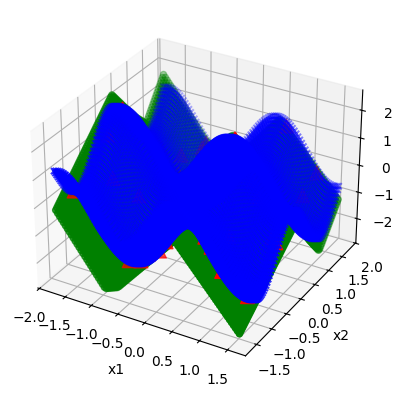

****************************************************************
Epoch 1500/2000 Done, Total Loss: 0.10178311510632436
net_outputs_test[0] [-0.10746883 -0.05695231 -0.00643508 ... -1.2847831  -1.202183
 -1.1195818 ]
Prediction min: -2.5446212
Prediction max: 2.3559132


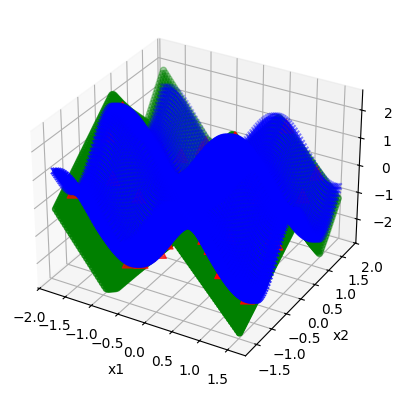

Final Train Accuracy: 39.58%
Final Test Accuracy: 5.55%
MLNet(
  (fcnn1): Sequential(
    (0): Linear(in_features=2, out_features=16, bias=True)
    (1): ReLU()
    (2): Linear(in_features=16, out_features=1, bias=True)
  )
)
net_outputs_test[0] [-0.16587345 -0.11480029 -0.0637271  ... -1.3523805  -1.2676781
 -1.1829771 ]
Prediction min: -2.6399045
Prediction max: 2.3271909


C:\Users\10516\AppData\Local\Temp\ipykernel_6788\2536022096.py:301: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_file)


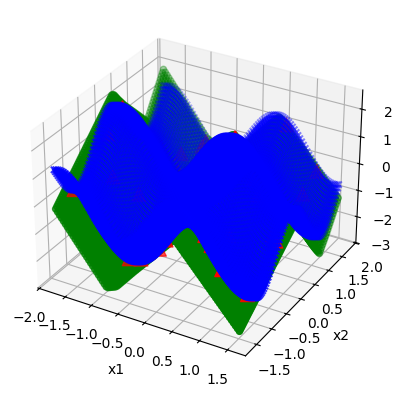

MLNet(
  (fcnn1): Sequential(
    (0): Linear(in_features=2, out_features=16, bias=True)
    (1): ReLU()
    (2): Linear(in_features=16, out_features=1, bias=True)
  )
)

Final Train Loss: 0.0982
Final Train Accuracy: 39.58%
Final Test Loss: 1.9087
Final Test Accuracy: 5.55%


In [31]:
###############################################Modified Code to 3D#########################################################
##########################################1. 3D no noise no Normalization#####################################################
# Import matplotlib for plotting purposes
import matplotlib
matplotlib.rcParams["text.usetex"] = False
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Sometimes, we need Numpy, but wherever possible, we prefer torch.
import numpy as np

# Import PyTorch
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader

# Float (32 bit) or Double (64 bit) precision? Choose!
torch.set_default_dtype(torch.float32)#64)
torch.set_num_threads(4) # Use _maximally_ 4 CPU cores

# This is a list to store the hyperparameters of the training
hyperparam_log = []

#device = torch.device("cpu")
# Choose a device for major calculations (if there is a special GPU card, you usually want that).
# My GPU is not very performant for double precision, so I stay on CPU
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")
device = torch.device(device)

# File path for saving the trained NN later.
# If only providing the file name (like here), the file will be generated in the same folder as the Python script
model_file = "mymodel.torch"

## The following script shows a data-driven training of a Neural Network.
## The data is generated in this script, too, by sampling from a function.
## The variables below are used to control this sampling
samples = 48
sample_min = -5
sample_max = 5
sample_span = sample_max - sample_min

## These parameters are usual hyperparameters of the NN and its training.
batch_size = 8 # How many samples shall be presented to the NN, before running another optimizer step?
hidden_dim = 16 # How many neurons shall there be in the hidden layer(s)?
input_dim = 2 # Input dimension of the NN (i.e. how many neurons are in the input layer?)
output_dim = 1 # Some for output

epochs = 2000 # Number of training iterations to be performed
lr = 0.002 # Which learning rate is passed to the training algorithm?

## Choose a criterion to evaluate the results. Here, we choose Mean Square error.
## The term "loss" means about the same as "remaining error" or "residual".
criterion = nn.MSELoss(reduction="mean")

## Here, we create the training data. In this example, we draw samples within the sampling interval and then pass it to
## e.g. the sin function (choose other functions to experiment with this script)
train_x = (sample_span * torch.rand(samples, 2) + sample_min * torch.ones(samples, 2))
train_y = torch.sin(train_x[:, 0]) + torch.cos(train_x[:, 1]) ##torch.pow(test_x, 2)

## Here, we create the test data. To show the effect of extrapolation and the detailed behavior of the NN,
## we choose points a bit outside the interval that we used for sampling training data. Also, we very dense points.
# test_x = torch.zeros(20*samples, 2)
# test_x[:, 0] = torch.linspace(sample_min - 0.5*sample_span, sample_max + 0.5*sample_span, test_x.size()[0])
# test_x[:, 1] = torch.linspace(sample_min - 0.5*sample_span, sample_max + 0.5*sample_span, test_x.size()[0])

# create test_x with meshgrid
grid_size = int(samples ** 0.5) * 2 
margin = 0  # only extend 1. from -5 to 5, extend to -6 to 6 
x1 = torch.linspace(sample_min - margin, sample_max + margin, 2*samples)
x2 = torch.linspace(sample_min - margin, sample_max + margin, 2*samples)
x1, x2 = torch.meshgrid(x1, x2) 
test_x = torch.zeros(2*samples*2*samples, 2)
test_x[:, 0] = x1.reshape(-1)
test_x[:, 1] = x2.reshape(-1)
test_y = torch.sin(test_x[:, 0]) + torch.cos(test_x[:, 1]) ##torch.pow(test_x, 2)

# standardize the data
scaler = StandardScaler()
train_x = torch.tensor(scaler.fit_transform(train_x), dtype=torch.float32)
test_x = torch.tensor(scaler.transform(test_x), dtype=torch.float32)

print ("train_x", train_x)
print ("train_y", train_y)

## We want a DataLoader to handle batching and shuffling of the training data for us.
## The DataLoader needs a TensorDataset, hence we create one from the Training data.
train_data = TensorDataset(train_x, train_y)
train_loader = DataLoader(train_data, shuffle=True, batch_size=batch_size, drop_last=False)


## This class creates the actual Neural Network.
class MLNet(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(MLNet, self).__init__()
        self.hidden_dim = hidden_dim

        ## In this case, I decided to pack the layers into a single container of type nn.Sequential
        ## This container is useful for Fully Connected NNs, where the output of each layer is just fed into the following layer.
        ## added dropout layer, which is a regularization technique to prevent overfitting
        self.fcnn1 = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            #nn.Tanh(),
            #nn.ReLU(),
            #nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            #nn.Linear(hidden_dim, hidden_dim),
            #nn.Dropout(p=0.05),  # Dropout layer with 30% of neurons being dropped，but it's not working well，the model underfitting, so change to 0.05
            #nn.ReLU(),
            nn.Linear(hidden_dim, output_dim),
        ) ## That network here has exactly 1 hidden layer (comment out some lines or write new ones to add more layers)
        ## nn.Linear is in the pictures represented by the arrows and has the weights (and biases) which are the
        ## parameters of the NN.
        ## nn.ReLU and Tanh are examples for activation functions - in the pictures, these are the bubbles / neurons.
        ## Usually, the pattern is interchanging between one linear layer, one activation function, one linear layer, one activation function and so on

    ## It is required to write a function that is executed when calling the NN model.
    ## Usually, it takes the input data and passes it through the layers.
    ## Here, it is sufficient to call the sequential container since this container does exactly this job.
    ## But this function "forward" could also be used to set up more complex NN architectures with more complex data flows
    def forward(self, x):
        out = self.fcnn1(x)
        return out

## This function performs a test run with the NN.
## It takes the NN model and the test data, passes the test inputs through the network and
## compares it with the target values = test outputs = targets
## and based on that calculates the loss value
def evaluate(model, test_x, test_y):
    ## For testing, we don't need the autograd feature/ protocol of all calculation steps
    ## So, save some time and disable grad tracking.
    with torch.no_grad():
        model.eval() ## Set the NN model into evaluation mode
        outputs = [] ## Create empty lists to store the results
        targets = []
        testlosses = []

        out = model(test_x.to(device)) ## Call the model, i.e. perform the actual inference

        ## Move the output quantities to the CPU, detach them from the tensor operation book-keeping and convert them to numpy arrays/ vectors.
        ## This is all necessary for plotting
        outputs.append(out.cpu().detach().numpy())
        targets.append(test_y.cpu().detach().numpy())
        testlosses.append(criterion(out, test_y.to(device)).item())

    ## Now return that in form of a triple of variables
    return outputs, targets, testlosses

## This calls the evaluate function and takes care of the plotting.
def eval_and_plot(model):
        ## matplotlib tries to be similar to the plot functions of matlab  (admittedly, the commands have to begin with "plt.", but the rest
        ## is quite similar.)
        # create a 3D plot
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        ## Call the network on the test data
        net_outputs_test, targets_test, testlosses = evaluate(model, test_x, test_y)   
        # Plot the targets first in blue (which means to plot the actual function over the whole test interval)
        #ax.plot(test_x[:, 0], test_x[:, 1], targets_test[0], color="-b", label="Target")
        ax.scatter(test_x[:, 0], test_x[:, 1], targets_test[0], c='b', marker='x', label='Target')
        ax.set_xlabel('x1')
        ax.set_ylabel('x2')
        ax.set_zlabel('y')

        ## Call the network on the training data
        net_outputs_train, targets_train, testlosses = evaluate(model, train_x, train_y)
        ## First, plot the targets in red, i.e. plot the training data set
        ax.scatter(train_x[:, 0], train_x[:, 1], targets_train[0], c='r', s=100, marker='^', label='Target')

        ## Now, plot the output of the NN on the whole test interval in green
        ## This allows us to see how the NN performs for interpolation as well as for extrapolation
        ax.scatter(test_x[:, 0], test_x[:, 1], net_outputs_test[0].reshape(-1), c='g', marker='o', label='Learned')
        print("net_outputs_test[0]", net_outputs_test[0].reshape(-1))

        print("Prediction min:", net_outputs_test[0].min())
        print("Prediction max:", net_outputs_test[0].max())


        ## All plotting is done, open the plot window
        plt.show()

## This function is the accuracy of the model
def calculate_accuracy(predictions, targets, threshold=0.1):
    """
    Calculate accuracy for regression by checking if predictions are within a certain range of targets.
    Args:
        predictions: Predicted values (torch.Tensor).
        targets: Actual values (torch.Tensor).
        threshold: Acceptable error range for considering a prediction as correct.
    Returns:
        Accuracy as a percentage (float).
    """
    correct = torch.abs(predictions - targets) <= threshold
    accuracy = correct.float().mean().item() * 100
    return accuracy

## That function takes care of the whole training
def train(train_loader, learn_rate, EPOCHS):  # 10):

    # Instantiate the NN
    model = MLNet(input_dim, hidden_dim, output_dim)
    model.to(device) # and move it to the "device" (in case we use a GPU)

    ## Choose an optimizer. Adam is quite robust and thus very popular. Technically, it's based on
    ## gradient descent, but mixes in the gradient of the last time step to improve robustness.
    ## It is given the model parameters, which are the weights and biases of the Linear layers
    ## and the learn_rate. 
    # add L2 regularization(weight_decay) to the optimizer
    #optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=0)
    print("Starting Training of the model")

    # StepLR scheduler: every 'step_size' epochs, lr = lr * gamma
    #scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=500, gamma=0.3)
    #print("Starting Training of the model with StepLR scheduler")

    # We want to keep track of the losses averaged over each epoch, to plot them in those famous
    # decreasing graphs
    avg_losses = torch.zeros(EPOCHS)

    ## In the end, epoch is just another word for "training iteration", so we have a simple for loop.
    for epoch in range(EPOCHS):
        model.train() # Set the model into train mode
        avg_loss = 0. # initializations

        ## DataLoader is iterable so that this for-loop loops over the batches of the training data set
        ## and the DataLoader gives us readily paired combinations of training inputs and targets (which are called x and label, here).
        ## The term "label" is more common in classification, but used for all supervised training tasks
        for x, label in train_loader:
            model.zero_grad() # Important: reset the gradients of the NN before passing the training inputs.
            # Otherwise, we would accumulate the gradient information which might ruin the results
            # or simply run into PyTorch exceptions

            ## Now, we can call the model on the training inputs.
            ## Therefor, we move that data to the device (just in case we use a GPU).
            out = model(x.to(device))
            out = out.squeeze(-1) ## The output is a tensor of shape (batch_size, 1), but we want to have a tensor of shape (batch_size)
            loss = criterion(out, label) # both are [batch_size,1]


            ## Here, the whole magic happens:
            ## PyTorch offers the autograd feature, i.e. calculations on tensors are tracked (there are exceptions, e.g.
            ## this is not possible for in-place operations). This allows to calculate the derivative of each output value
            ## w.r.t. all input values (its "gradient").
            ## In this case, we want to know the derivatives of the loss value w.r.t. all the NN parameters (weights and biases).
            ## Our optimizers are usually based on "Gradient Descent", so we need the gradients...
            loss.backward()
            ## Alright, now let the optimizer do the magic.
            ## We passed the optimizer the NN parameters by reference when we initialized the optimizer.
            ## And the gradient information is stored in the tensors of the parameters, too (not in the loss or so).
            ## That's why the step() function does not require any arguments.
            optimizer.step()

            ## For the plot at the end, save the loss values
            avg_loss += loss.item()

        ## It's an average loss, so divide by the number of samples/ size of the training data set
        avg_losses[epoch] = avg_loss / len(train_loader)

        ## StepLR scheduler step, update learning rate, every 500 epochs reduce lr by 0.3
    #    scheduler.step()

        ## To understand how the NN learns, all 500 epochs a plot is shown (Close the plot window and wait for the next plot)
        if epoch%500 == 0:
            print("****************************************************************")
            print("Epoch {}/{} Done, Total Loss: {}".format(epoch, EPOCHS, avg_loss / len(train_loader)))
            eval_and_plot(model)
    #       current_lr = scheduler.get_last_lr()[0]
    #       print(f"Current LR after scheduler step: {current_lr}")

    # Evaluate train accuracy
    with torch.no_grad():
        model.eval()
        train_out = model(train_x.to(device)).squeeze(-1)
        train_accuracy = calculate_accuracy(train_out, train_y.to(device))
        print(f"Final Train Accuracy: {train_accuracy:.2f}%")

    # Evaluate test accuracy
    test_outputs, test_targets, _ = evaluate(model, test_x, test_y)
    test_accuracy = calculate_accuracy(torch.tensor(test_outputs[0]), torch.tensor(test_targets[0]))
    print(f"Final Test Accuracy: {test_accuracy:.2f}%")


    ## Now save the trained model with all its properties to the model_file
    torch.save(model, model_file)

    ## And return the model in case we want to use it for other tasks
    return model


## As the functions written before are just function definitions,
## those functions still have to be called.
## This is done here.
## Train the model
model = train(train_loader, lr, epochs)

print(model)

## Test that saving the model worked: load it from file
model = torch.load(model_file)
## and evaluate and plot once
eval_and_plot(model)

print(model)

# Evaluate and print train loss and accuracy
with torch.no_grad():
    model.eval()
    # Calculate Train Loss
    train_out = model(train_x.to(device)).squeeze(-1)
    final_train_loss = criterion(train_out, train_y.to(device)).item()

    # Calculate Train Accuracy
    train_accuracy = calculate_accuracy(train_out, train_y.to(device))
    print(f"\nFinal Train Loss: {final_train_loss:.4f}")
    print(f"Final Train Accuracy: {train_accuracy:.2f}%")

# Evaluate and print test loss and accuracy
test_outputs, test_targets, test_loss = evaluate(model, test_x, test_y)
final_test_loss = test_loss[0]  # Since test_loss is a list, take the first value

# Convert outputs to tensors for accuracy calculation
test_predictions = torch.tensor(test_outputs[0])
test_targets = torch.tensor(test_targets[0])

# Calculate Test Accuracy
test_accuracy = calculate_accuracy(test_predictions, test_targets)

print(f"Final Test Loss: {final_test_loss:.4f}")
print(f"Final Test Accuracy: {test_accuracy:.2f}%")


Using cpu device

**Running training with lr=0.001, hidden_dim=16, batch_size=8, epochs=1600
MLNet(
  (fcnn1): Sequential(
    (0): Linear(in_features=2, out_features=16, bias=True)
    (1): ReLU()
    (2): Linear(in_features=16, out_features=1, bias=True)
  )
)
lr=0.001, hidden_dim=16, batch_size=8, epochs=1600

Final Train loss: 0.0534, Test loss: 1.2380 **

net_outputs_test[0] [ 0.1832521   0.24393094  0.30461007 ... -1.7356713  -1.7815647
 -1.8274581 ]
Prediction min: -2.815563
Prediction max: 2.317622


d:\miniconda\Lib\site-packages\torch\nn\modules\loss.py:608: UserWarning: Using a target size (torch.Size([1024])) that is different to the input size (torch.Size([1024, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
d:\miniconda\Lib\site-packages\torch\nn\modules\loss.py:608: UserWarning: Using a target size (torch.Size([16])) that is different to the input size (torch.Size([16, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


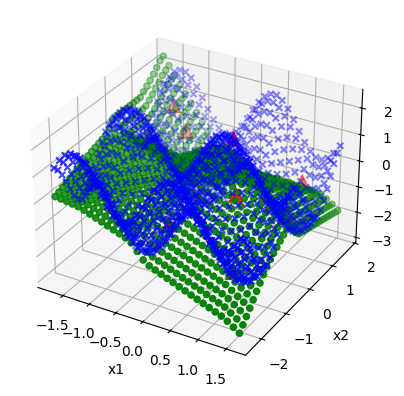

************************************************************************

**Running training with lr=0.002, hidden_dim=16, batch_size=8, epochs=1600
MLNet(
  (fcnn1): Sequential(
    (0): Linear(in_features=2, out_features=16, bias=True)
    (1): ReLU()
    (2): Linear(in_features=16, out_features=1, bias=True)
  )
)
lr=0.002, hidden_dim=16, batch_size=8, epochs=1600

Final Train loss: 0.0115, Test loss: 1.1476 **

net_outputs_test[0] [ 0.19877948  0.2669052   0.3350309  ... -1.4560351  -1.4846452
 -1.5132552 ]
Prediction min: -2.6537008
Prediction max: 2.9793968


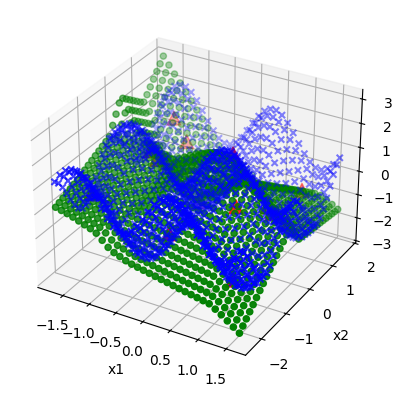

************************************************************************

**Running training with lr=0.002, hidden_dim=32, batch_size=8, epochs=1600
MLNet(
  (fcnn1): Sequential(
    (0): Linear(in_features=2, out_features=32, bias=True)
    (1): ReLU()
    (2): Linear(in_features=32, out_features=1, bias=True)
  )
)
lr=0.002, hidden_dim=32, batch_size=8, epochs=1600

Final Train loss: 0.0066, Test loss: 1.3059 **

net_outputs_test[0] [-0.13502432  0.06086133  0.25674653 ... -1.7394838  -1.7395962
 -1.7397089 ]
Prediction min: -3.097297
Prediction max: 3.1250508


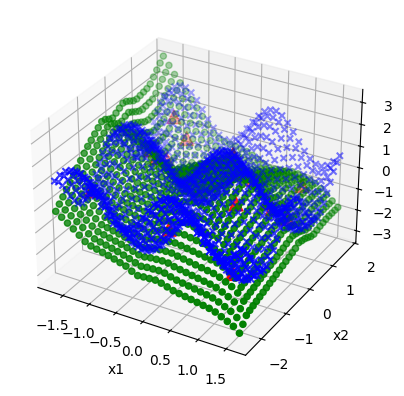

************************************************************************

**Running training with lr=0.002, hidden_dim=16, batch_size=8, epochs=2000
MLNet(
  (fcnn1): Sequential(
    (0): Linear(in_features=2, out_features=16, bias=True)
    (1): ReLU()
    (2): Linear(in_features=16, out_features=1, bias=True)
  )
)
lr=0.002, hidden_dim=16, batch_size=8, epochs=2000

Final Train loss: 0.0001, Test loss: 1.0141 **

net_outputs_test[0] [-0.08058488  0.1527443   0.38607347 ... -2.1092134  -1.7063586
 -1.3035051 ]
Prediction min: -2.8846793
Prediction max: 3.1981258


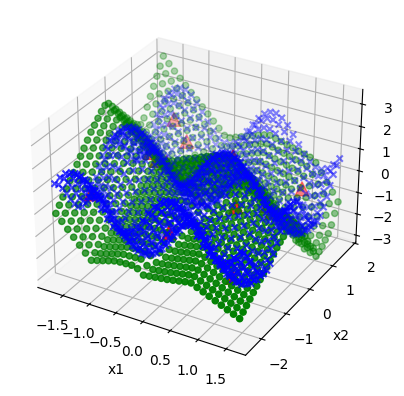

************************************************************************

**Running training with lr=0.003, hidden_dim=16, batch_size=8, epochs=1600
MLNet(
  (fcnn1): Sequential(
    (0): Linear(in_features=2, out_features=16, bias=True)
    (1): ReLU()
    (2): Linear(in_features=16, out_features=1, bias=True)
  )
)
lr=0.003, hidden_dim=16, batch_size=8, epochs=1600

Final Train loss: 0.0139, Test loss: 1.2800 **

net_outputs_test[0] [ 0.08457363  0.16754138  0.2505101  ... -1.4810449  -1.3521413
 -1.2232378 ]
Prediction min: -2.6565633
Prediction max: 2.9979477


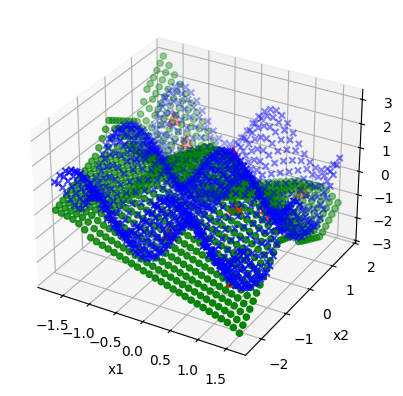

************************************************************************

**Running training with lr=0.003, hidden_dim=32, batch_size=8, epochs=1600
MLNet(
  (fcnn1): Sequential(
    (0): Linear(in_features=2, out_features=32, bias=True)
    (1): ReLU()
    (2): Linear(in_features=32, out_features=1, bias=True)
  )
)
lr=0.003, hidden_dim=32, batch_size=8, epochs=1600

Final Train loss: 0.0010, Test loss: 0.9564 **

net_outputs_test[0] [ 0.00543746  0.12618133  0.2823287  ... -1.3672551  -1.3403333
 -1.3169658 ]
Prediction min: -2.5074818
Prediction max: 3.1650932


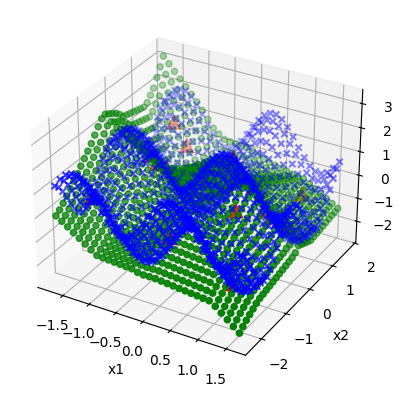

************************************************************************

**Running training with lr=0.003, hidden_dim=32, batch_size=8, epochs=2000
MLNet(
  (fcnn1): Sequential(
    (0): Linear(in_features=2, out_features=32, bias=True)
    (1): ReLU()
    (2): Linear(in_features=32, out_features=1, bias=True)
  )
)
lr=0.003, hidden_dim=32, batch_size=8, epochs=2000

Final Train loss: 0.0003, Test loss: 1.4141 **

net_outputs_test[0] [-0.23513207 -0.05715654  0.10764994 ... -1.3691437  -1.1011186
 -0.8315692 ]
Prediction min: -3.4209874
Prediction max: 2.9813466


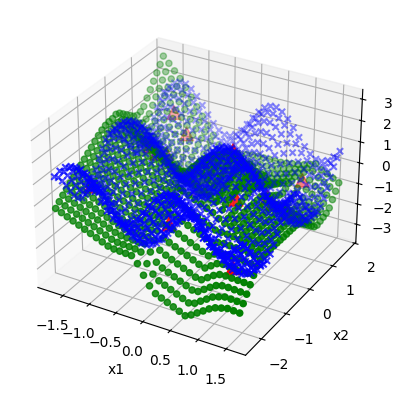

************************************************************************


C:\Users\10516\AppData\Local\Temp\ipykernel_6788\1568007687.py:312: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


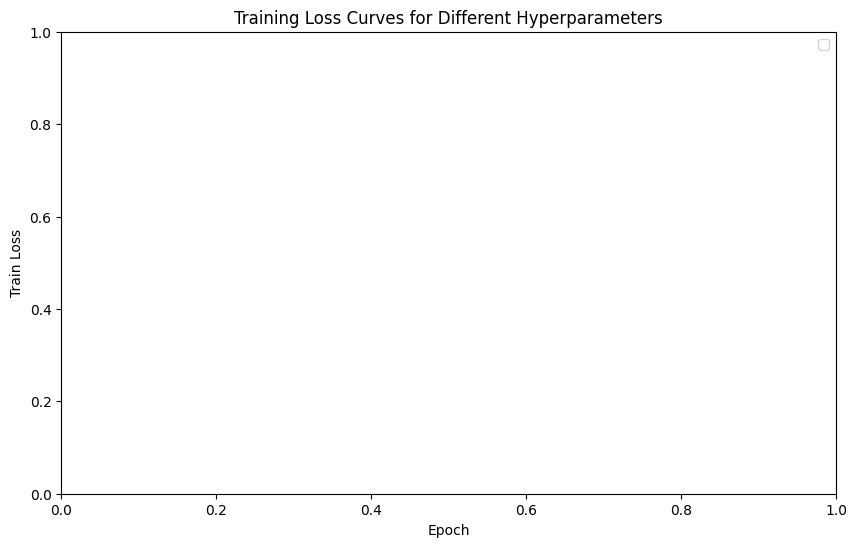


Comparison of final results:


In [32]:
###############################################Modified Code to 3D#########################################################
##########################################2. with difference Hyperparameters#####################################################
# Import matplotlib for plotting purposes
import matplotlib
matplotlib.rcParams["text.usetex"] = False
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Sometimes, we need Numpy, but wherever possible, we prefer torch.
import numpy as np

# Import PyTorch
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader

# Float (32 bit) or Double (64 bit) precision? Choose!
torch.set_default_dtype(torch.float32)#64)
torch.set_num_threads(4) # Use _maximally_ 4 CPU cores

# This is a list to store the losses of the different hyperparameter configurations
train_losses_all = []
test_losses_all = []
models = []

# This is a list to store the hyperparameters of the training
# hyperparam_log = []

#device = torch.device("cpu")
# Choose a device for major calculations (if there is a special GPU card, you usually want that).
# My GPU is not very performant for double precision, so I stay on CPU
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")
device = torch.device(device)

# File path for saving the trained NN later.
# If only providing the file name (like here), the file will be generated in the same folder as the Python script
model_file = "mymodel.torch"

## The following script shows a data-driven training of a Neural Network.
## The data is generated in this script, too, by sampling from a function.
## The variables below are used to control this sampling
samples = 16
sample_min = -5
sample_max = 5
sample_span = sample_max - sample_min

## These parameters are usual hyperparameters of the NN and its training.
# batch_size = 8 # How many samples shall be presented to the NN, before running another optimizer step?
# hidden_dim = 16 # How many neurons shall there be in the hidden layer(s)?
input_dim = 2 # Input dimension of the NN (i.e. how many neurons are in the input layer?)
output_dim = 1 # Some for output

epochs = 2000 # Number of training iterations to be performed
lr = 0.002 # Which learning rate is passed to the training algorithm?

## Choose a criterion to evaluate the results. Here, we choose Mean Square error.
## The term "loss" means about the same as "remaining error" or "residual".
criterion = nn.MSELoss(reduction="mean")

## Here, we create the training data. In this example, we draw samples within the sampling interval and then pass it to
## e.g. the sin function (choose other functions to experiment with this script)
train_x = (sample_span * torch.rand(samples, 2) + sample_min * torch.ones(samples, 2))
train_y = torch.sin(train_x[:, 0]) + torch.cos(train_x[:, 1]) ##torch.pow(test_x, 2)

## This function logs the hyperparameters of the training
def log_hyperparameters(config, train_loss, test_loss, train_losses, train_accuracies, test_accuracies):
    hyperparam_log.append({
        "learning_rate": config["lr"],
        "hidden_dim": config["hidden_dim"],
        "batch_size": config["batch_size"],
        "epochs": config["epochs"],
        "final_train_loss": train_loss,
        "final_test_loss": test_loss,
        "final_train_accuracy": train_accuracies[-1],
        "final_test_accuracy": test_accuracies[-1],
        "train_losses": train_losses,
        "train_accuracies": train_accuracies,
        "test_accuracies": test_accuracies
    })

# print ("train_x", train_x)
# print ("train_y", train_y)

## Here, we create the test data. To show the effect of extrapolation and the detailed behavior of the NN,
## we choose points a bit outside the interval that we used for sampling training data. Also, we very dense points.
# test_x = torch.zeros(20*samples, 2)
# test_x[:, 0] = torch.linspace(sample_min - 0.5*sample_span, sample_max + 0.5*sample_span, test_x.size()[0])
# test_x[:, 1] = torch.linspace(sample_min - 0.5*sample_span, sample_max + 0.5*sample_span, test_x.size()[0])

# create test_x with meshgrid
grid_size = int(samples ** 0.5) * 2 
margin = 1  # only extend 1. from -5 to 5, extend to -6 to 6 
x1 = torch.linspace(sample_min - margin, sample_max + margin, 2*samples)
x2 = torch.linspace(sample_min - margin, sample_max + margin, 2*samples)
x1, x2 = torch.meshgrid(x1, x2) 
test_x = torch.zeros(2*samples*2*samples, 2)
test_x[:, 0] = x1.reshape(-1)
test_x[:, 1] = x2.reshape(-1)
test_y = torch.sin(test_x[:, 0]) + torch.cos(test_x[:, 1]) ##torch.pow(test_x, 2)

# standardize the data
scaler = StandardScaler()
train_x = torch.tensor(scaler.fit_transform(train_x), dtype=torch.float32)
test_x = torch.tensor(scaler.transform(test_x), dtype=torch.float32)

## We want a DataLoader to handle batching and shuffling of the training data for us.
## The DataLoader needs a TensorDataset, hence we create one from the Training data.
train_data = TensorDataset(train_x, train_y)
train_loader = DataLoader(train_data, shuffle=True, batch_size=batch_size, drop_last=False)


## This class creates the actual Neural Network.
class MLNet(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(MLNet, self).__init__()
        self.hidden_dim = hidden_dim

        ## In this case, I decided to pack the layers into a single container of type nn.Sequential
        ## This container is useful for Fully Connected NNs, where the output of each layer is just fed into the following layer.
        ## added dropout layer, which is a regularization technique to prevent overfitting
        self.fcnn1 = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            #nn.Tanh(),
            nn.ReLU(),
            #nn.Linear(hidden_dim, hidden_dim),
            #nn.ReLU(),
            #nn.Linear(hidden_dim, hidden_dim),
            #nn.Dropout(p=0.05),  # Dropout layer with 30% of neurons being dropped，but it's not working well，the model underfitting, so change to 0.05
            #nn.ReLU(),
            nn.Linear(hidden_dim, output_dim),
        ) ## That network here has exactly 1 hidden layer (comment out some lines or write new ones to add more layers)
        ## nn.Linear is in the pictures represented by the arrows and has the weights (and biases) which are the
        ## parameters of the NN.
        ## nn.ReLU and Tanh are examples for activation functions - in the pictures, these are the bubbles / neurons.
        ## Usually, the pattern is interchanging between one linear layer, one activation function, one linear layer, one activation function and so on

    ## It is required to write a function that is executed when calling the NN model.
    ## Usually, it takes the input data and passes it through the layers.
    ## Here, it is sufficient to call the sequential container since this container does exactly this job.
    ## But this function "forward" could also be used to set up more complex NN architectures with more complex data flows
    def forward(self, x):
        out = self.fcnn1(x)
        return out

## This function performs a test run with the NN.
## It takes the NN model and the test data, passes the test inputs through the network and
## compares it with the target values = test outputs = targets
## and based on that calculates the loss value
def evaluate(model, test_x, test_y):
    ## For testing, we don't need the autograd feature/ protocol of all calculation steps
    ## So, save some time and disable grad tracking.
    with torch.no_grad():
        model.eval() ## Set the NN model into evaluation mode
        outputs = [] ## Create empty lists to store the results
        targets = []
        testlosses = []

        out = model(test_x.to(device)) ## Call the model, i.e. perform the actual inference

        ## Move the output quantities to the CPU, detach them from the tensor operation book-keeping and convert them to numpy arrays/ vectors.
        ## This is all necessary for plotting
        outputs.append(out.cpu().detach().numpy())
        targets.append(test_y.cpu().detach().numpy())
        testlosses.append(criterion(out, test_y.to(device)).item())

    ## Now return that in form of a triple of variables
    return outputs, targets, testlosses

## This calls the evaluate function and takes care of the plotting.
def eval_and_plot(model):
        ## matplotlib tries to be similar to the plot functions of matlab  (admittedly, the commands have to begin with "plt.", but the rest
        ## is quite similar.)

        # create a 3D plot
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        ## Call the network on the test data
        net_outputs_test, targets_test, testlosses = evaluate(model, test_x, test_y)   
        # Plot the targets first in blue (which means to plot the actual function over the whole test interval)
        #ax.plot(test_x[:, 0], test_x[:, 1], targets_test[0], color="-b", label="Target")
        ax.scatter(test_x[:, 0], test_x[:, 1], targets_test[0], c='b', marker='x', label='Target')
        ax.set_xlabel('x1')
        ax.set_ylabel('x2')
        ax.set_zlabel('y')

        ## Call the network on the training data
        net_outputs_train, targets_train, testlosses = evaluate(model, train_x, train_y)
        ## First, plot the targets in red, i.e. plot the training data set
        ax.scatter(train_x[:, 0], train_x[:, 1], targets_train[0], c='r', s=100, marker='^', label='Target')

        ## Now, plot the output of the NN on the whole test interval in green
        ## This allows us to see how the NN performs for interpolation as well as for extrapolation
        ax.scatter(test_x[:, 0], test_x[:, 1], net_outputs_test[0].reshape(-1), c='g', marker='o', label='Learned')
        print("net_outputs_test[0]", net_outputs_test[0].reshape(-1))

        print("Prediction min:", net_outputs_test[0].min())
        print("Prediction max:", net_outputs_test[0].max())


        ## All plotting is done, open the plot window
        plt.show()

## Accuracy calculation function
def calculate_accuracy(predictions, targets, threshold=0.1):
    """
    Calculate accuracy for regression by checking if predictions are within a certain range of targets.
    Args:
        predictions: Predicted values (torch.Tensor).
        targets: Actual values (torch.Tensor).
        threshold: Acceptable error range for considering a prediction as correct.
    Returns:
        Accuracy as a percentage (float).
    """
    correct = torch.abs(predictions - targets) <= threshold
    accuracy = correct.float().mean().item() * 100
    return accuracy

def train(train_loader, lr_run, hidden_dim_run, EPOCHS):
    model = MLNet(input_dim, hidden_dim_run, output_dim).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr_run, weight_decay=0)



    for epoch in range(EPOCHS):
        model.train()
        avg_loss = 0.
        for x, label in train_loader:
            model.zero_grad()
            out = model(x.to(device)).squeeze(-1)
            loss = criterion(out, label.to(device))
            loss.backward()
            optimizer.step()
            avg_loss += loss.item()

    # Final evaluation
    with torch.no_grad():
        model.eval()
        # Training loss
        out_train = model(train_x.to(device)).squeeze(-1)
        final_train_loss = criterion(out_train, train_y.to(device)).item()
        final_train_accuracy = calculate_accuracy(out_train, train_y.to(device))

        # Testing loss
        out_test = model(test_x.to(device)).squeeze(-1)
        final_test_loss = criterion(out_test, test_y.to(device)).item()
        final_test_accuracy = calculate_accuracy(out_test, test_y.to(device))

    return model, final_train_loss, final_test_loss, final_train_accuracy, final_test_accuracy


## As the functions written before are just function definitions,
## those functions still have to be called.
## This is done here.
## Train the model
# model = train(train_loader, lr, epochs)


## Test that saving the model worked: load it from file
# model = torch.load(model_file)
## and evaluate and plot once
# eval_and_plot(model)

###################### Hyperparameter Search Loop ######################
hyperparam_log = []  # reset hyperparam_log

hyperparam_configs = [
    {"lr":0.001, "hidden_dim":16, "batch_size":8, "epochs":1600},
    {"lr":0.002, "hidden_dim":16, "batch_size":8, "epochs":1600},
    {"lr":0.002, "hidden_dim":32, "batch_size":8, "epochs":1600},
    {"lr":0.002, "hidden_dim":16, "batch_size":8, "epochs":2000},
    {"lr":0.003, "hidden_dim":16, "batch_size":8, "epochs":1600},
    {"lr":0.003, "hidden_dim":32, "batch_size":8, "epochs":1600},
    {"lr":0.003, "hidden_dim":32, "batch_size":8, "epochs":2000},
]

for config in hyperparam_configs:
    lr_run          = config["lr"]
    hidden_dim_run  = config["hidden_dim"]
    batch_size_run  = config["batch_size"]
    epochs_run      = config["epochs"]

    # update hyperparameters to be global variables
    lr         = lr_run
    hidden_dim = hidden_dim_run
    batch_size = batch_size_run
    epochs     = epochs_run

    print(f"\n**Running training with lr={lr}, hidden_dim={hidden_dim}, batch_size={batch_size}, epochs={epochs}")

    # train the model to get the results
    model, final_train_loss, final_test_loss,final_train_accuracy, final_test_accuracy = train(train_loader, lr, hidden_dim, epochs)

    # show the model structure
    print(model)

    
    print(f"lr={lr}, hidden_dim={hidden_dim}, batch_size={batch_size}, epochs={epochs}\n")
    print(f"Final Train loss: {final_train_loss:.4f}, Test loss: {final_test_loss:.4f} **\n")
    eval_and_plot(model)  # plot the training results
    print("************************************************************************")

###################### Plot multiple curves ######################
plt.figure(figsize=(10,6))
for entry in hyperparam_log:
    plt.plot(entry["train_losses"],
             label=f"lr={entry['learning_rate']}, hidden={entry['hidden_dim']}, final_train_loss={entry['final_train_loss']:.4f}")
plt.xlabel("Epoch")
plt.ylabel("Train Loss")
plt.title("Training Loss Curves for Different Hyperparameters")
plt.legend()
plt.show()

###################### Compare final results ######################
print("\nComparison of final results:")
for entry in hyperparam_log:
    print(f"Config: lr={entry['learning_rate']}, hidden_dim={entry['hidden_dim']}, epoch={entry['epochs']} => Train Loss={entry['final_train_loss']:.4f}, Test Loss={entry['final_test_loss']:.4f}")


## This function is used to plot the hyperparameter logs
#plot_hyperparameter_logs()

Using cpu device

**Running training with lr=0.02, hidden_dim=16, batch_size=8, epochs=2000


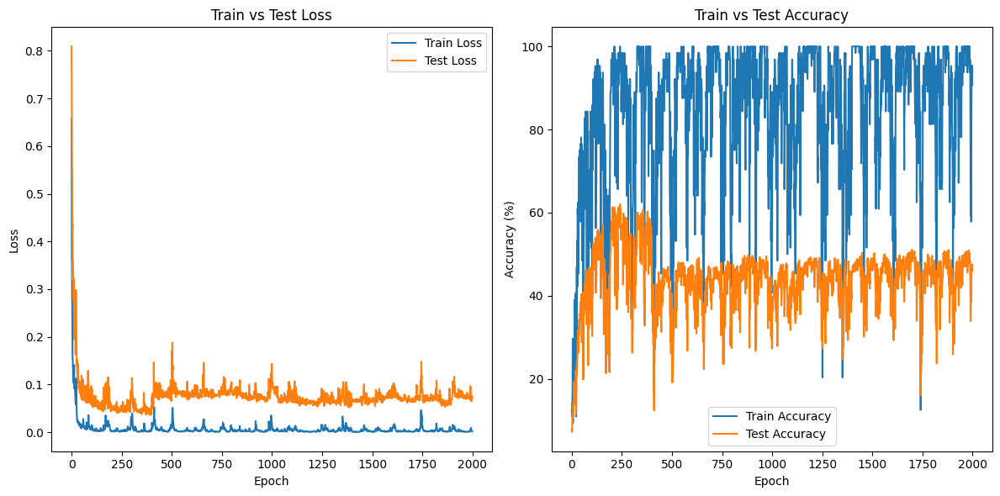

lr=0.02, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0015, Final Test Loss: 0.0715
Final Train Accuracy: 93.75%, Final Test Accuracy: 46.09%

Average Train Accuracy (last 100 epochs): 89.70%, Average Test Accuracy (last 100 epochs): 45.19%

net_outputs_test[0] [-1.6109067 -1.5589901 -1.507074  ... -1.3512479 -1.3771168 -1.4029857]


d:\miniconda\Lib\site-packages\torch\nn\modules\loss.py:608: UserWarning: Using a target size (torch.Size([16384])) that is different to the input size (torch.Size([16384, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
d:\miniconda\Lib\site-packages\torch\nn\modules\loss.py:608: UserWarning: Using a target size (torch.Size([64])) that is different to the input size (torch.Size([64, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


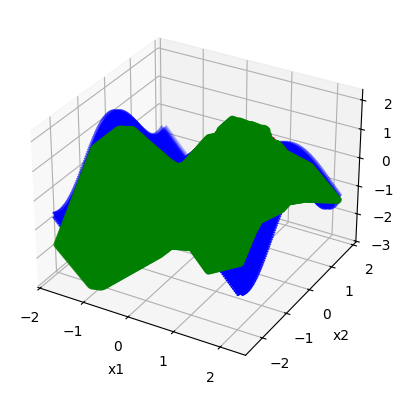

************************************************************************

**Running training with lr=0.01, hidden_dim=16, batch_size=8, epochs=2000


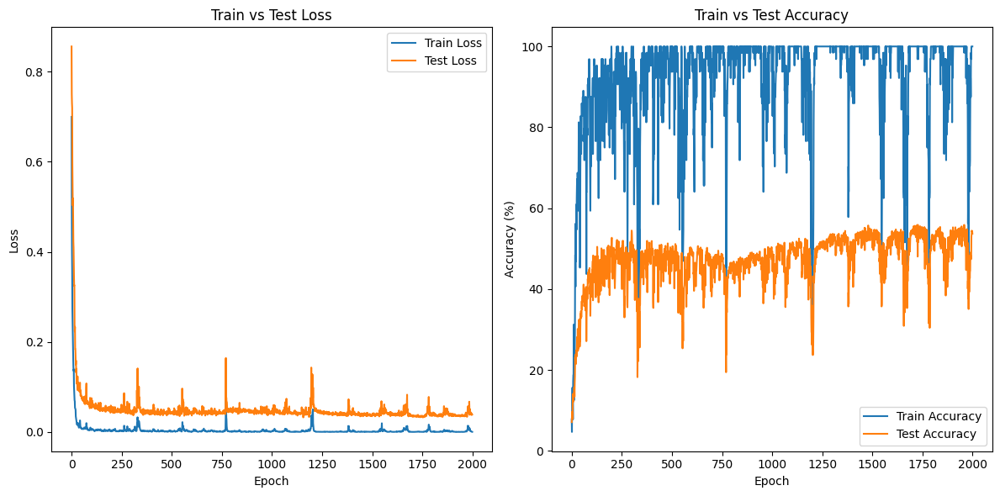

lr=0.01, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0003, Final Test Loss: 0.0387
Final Train Accuracy: 100.00%, Final Test Accuracy: 53.70%

Average Train Accuracy (last 100 epochs): 95.34%, Average Test Accuracy (last 100 epochs): 51.38%

net_outputs_test[0] [-1.0316129  -1.0101118  -0.98861104 ... -1.1220341  -1.135365
 -1.1486957 ]


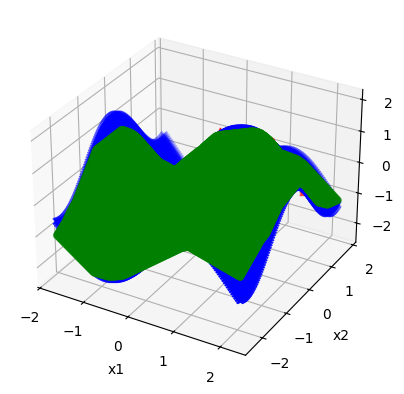

************************************************************************

**Running training with lr=0.005, hidden_dim=16, batch_size=8, epochs=2000


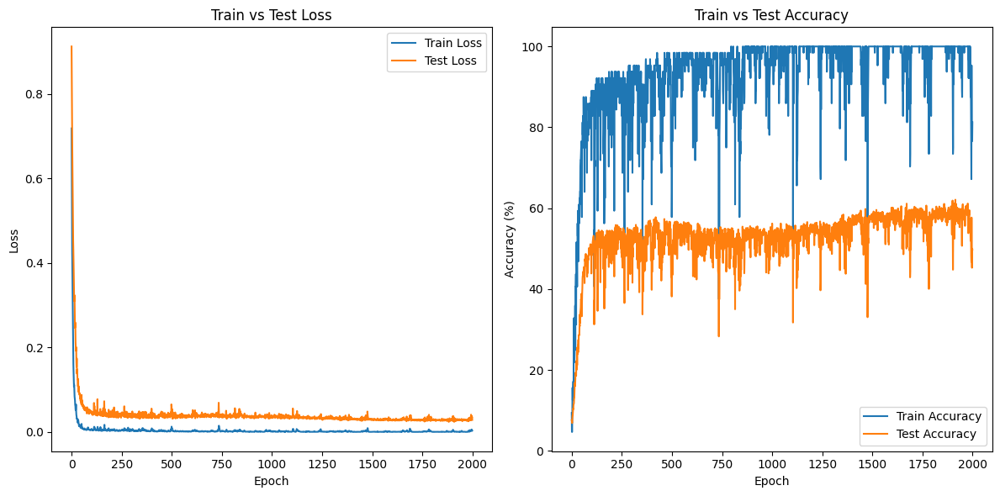

lr=0.005, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0032, Final Test Loss: 0.0286
Final Train Accuracy: 81.25%, Final Test Accuracy: 49.80%

Average Train Accuracy (last 100 epochs): 96.61%, Average Test Accuracy (last 100 epochs): 57.16%

net_outputs_test[0] [-1.401335  -1.3519126 -1.302491  ... -1.0313022 -1.0401143 -1.048927 ]


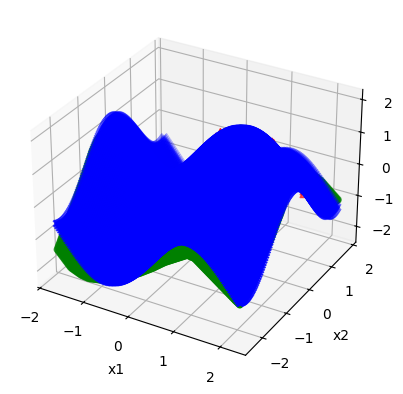

************************************************************************

**Running training with lr=0.002, hidden_dim=16, batch_size=8, epochs=2000


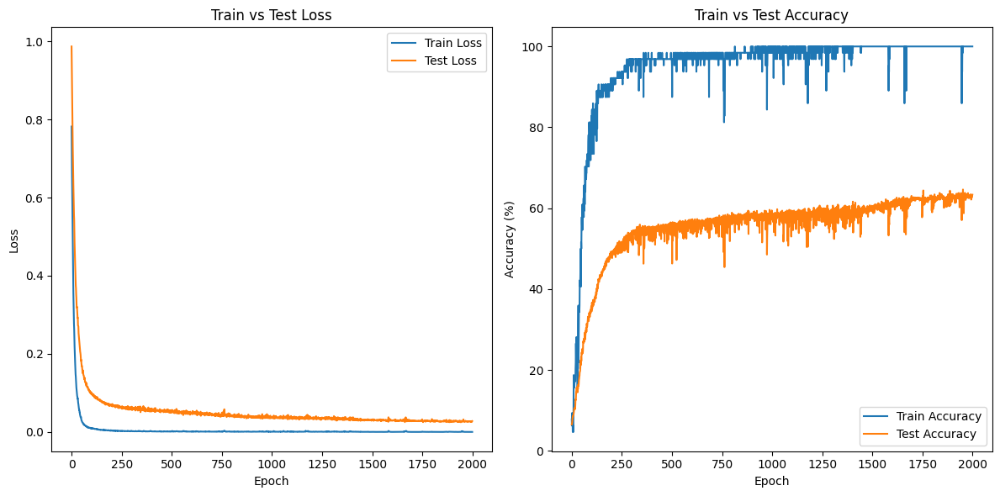

lr=0.002, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0001, Final Test Loss: 0.0277
Final Train Accuracy: 100.00%, Final Test Accuracy: 63.35%

Average Train Accuracy (last 100 epochs): 99.73%, Average Test Accuracy (last 100 epochs): 62.51%

net_outputs_test[0] [-1.2206357 -1.1809853 -1.1413351 ... -1.507208  -1.5396047 -1.5720009]


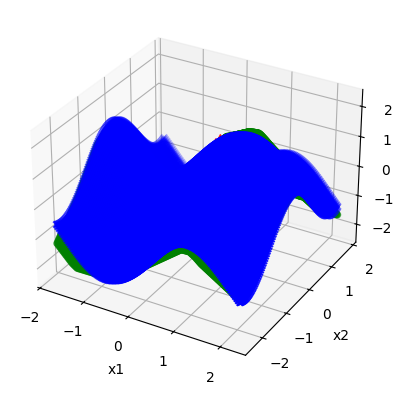

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=8, epochs=2000


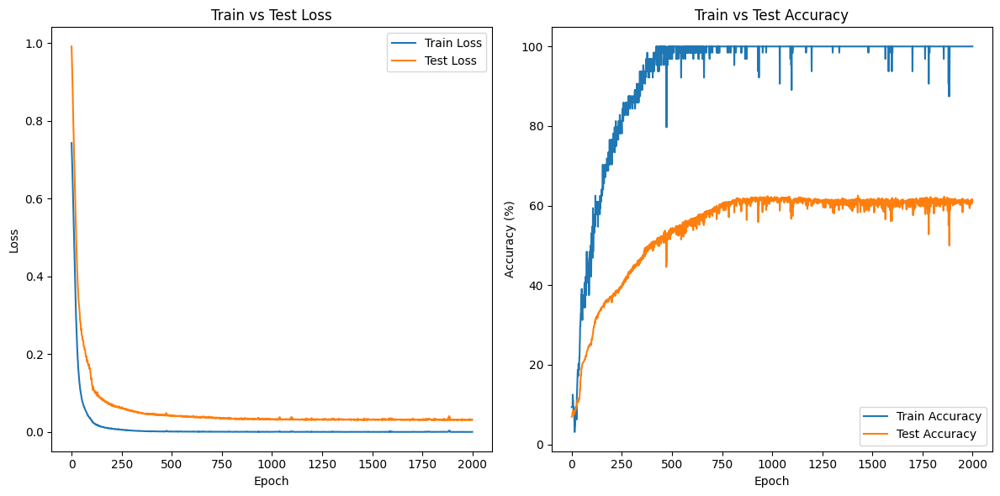

lr=0.001, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0001, Final Test Loss: 0.0314
Final Train Accuracy: 100.00%, Final Test Accuracy: 61.15%

Average Train Accuracy (last 100 epochs): 100.00%, Average Test Accuracy (last 100 epochs): 60.90%

net_outputs_test[0] [-1.477665  -1.4262619 -1.3748587 ... -1.1817989 -1.1961718 -1.210545 ]


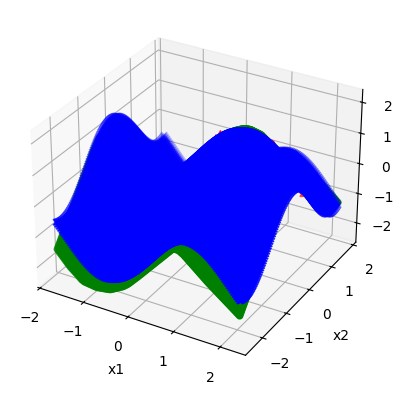

************************************************************************

**Running training with lr=0.0005, hidden_dim=16, batch_size=8, epochs=2000


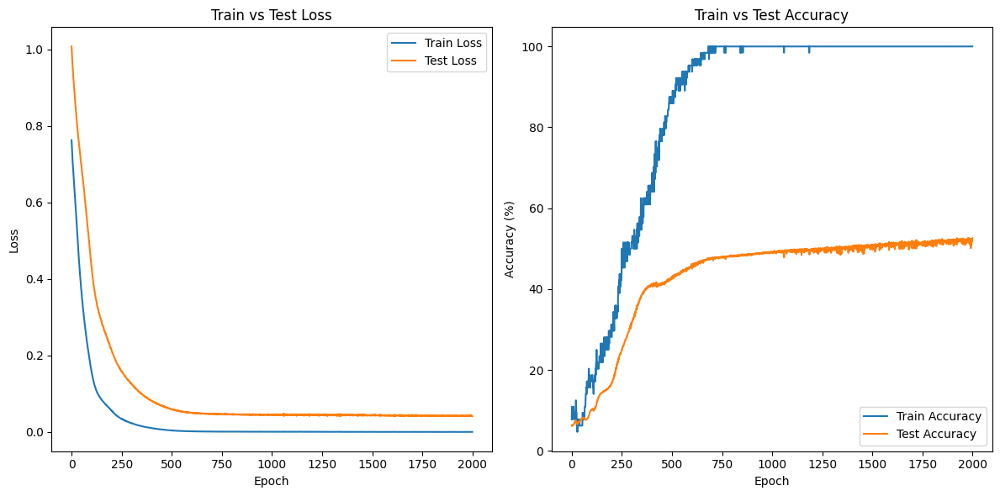

lr=0.0005, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0002, Final Test Loss: 0.0414
Final Train Accuracy: 100.00%, Final Test Accuracy: 52.58%

Average Train Accuracy (last 100 epochs): 100.00%, Average Test Accuracy (last 100 epochs): 51.92%

net_outputs_test[0] [-1.4456463 -1.407434  -1.366122  ... -1.5705137 -1.5978408 -1.6251681]


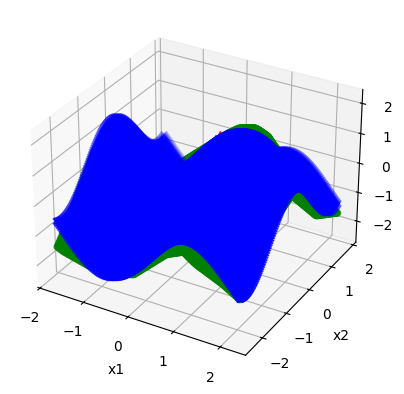

************************************************************************

**Running training with lr=0.0001, hidden_dim=16, batch_size=8, epochs=2000


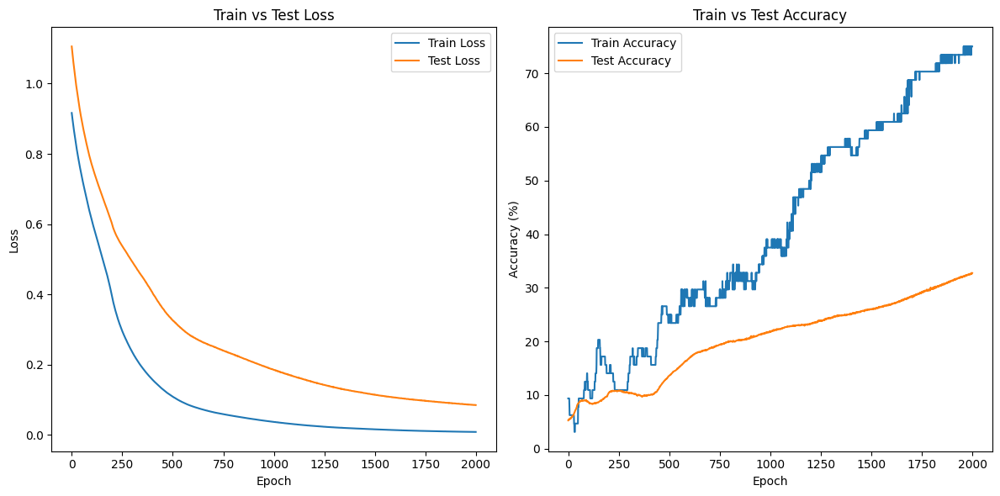

lr=0.0001, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0086, Final Test Loss: 0.0850
Final Train Accuracy: 75.00%, Final Test Accuracy: 32.76%

Average Train Accuracy (last 100 epochs): 73.88%, Average Test Accuracy (last 100 epochs): 32.04%

net_outputs_test[0] [-1.6702713 -1.6213632 -1.5724556 ... -1.1751184 -1.2129107 -1.2507029]


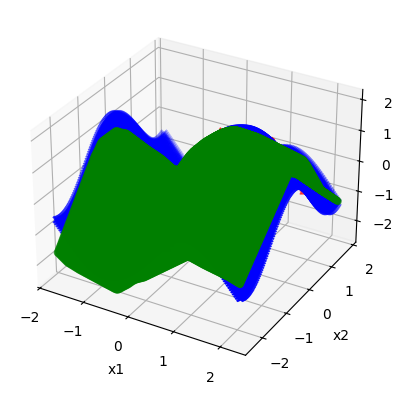

************************************************************************

**Running training with lr=0.001, hidden_dim=8, batch_size=8, epochs=2000


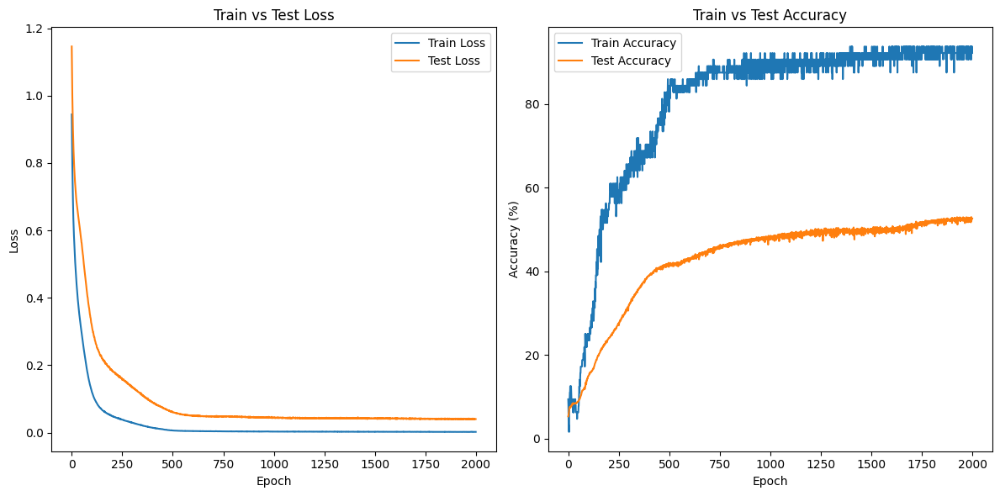

lr=0.001, hidden_dim=8, batch_size=8, epochs=2000
Final Train Loss: 0.0023, Final Test Loss: 0.0402
Final Train Accuracy: 92.19%, Final Test Accuracy: 52.59%

Average Train Accuracy (last 100 epochs): 92.25%, Average Test Accuracy (last 100 epochs): 52.40%

net_outputs_test[0] [-1.6046965 -1.5463507 -1.4880049 ... -0.9915165 -1.0127774 -1.0340384]


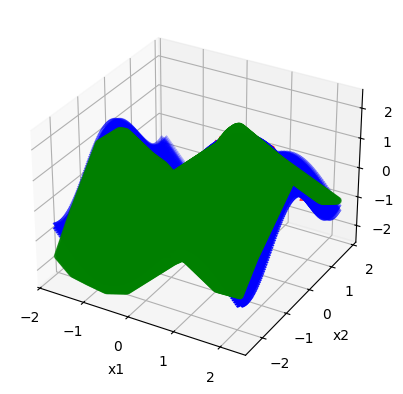

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=8, epochs=2000


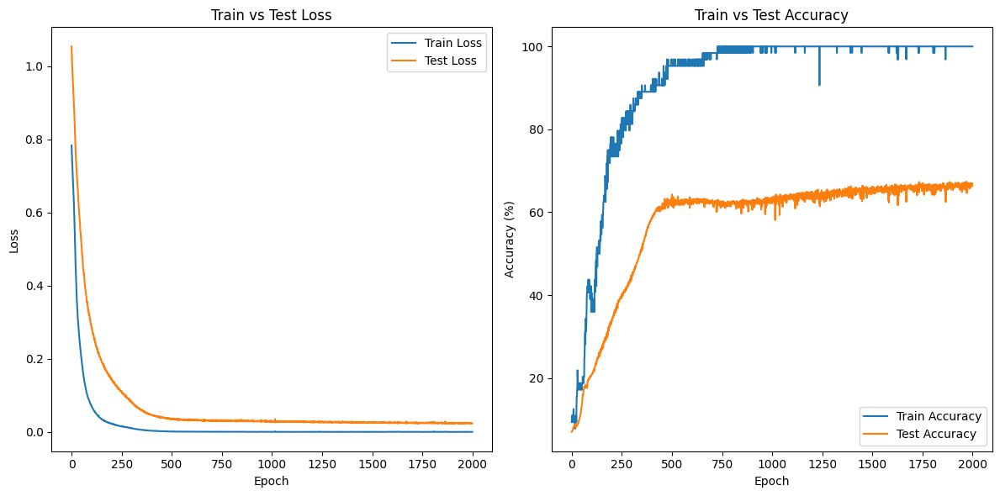

lr=0.001, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0002, Final Test Loss: 0.0232
Final Train Accuracy: 100.00%, Final Test Accuracy: 66.42%

Average Train Accuracy (last 100 epochs): 100.00%, Average Test Accuracy (last 100 epochs): 66.41%

net_outputs_test[0] [-1.4931567 -1.4423007 -1.3914453 ... -1.518921  -1.544856  -1.570791 ]


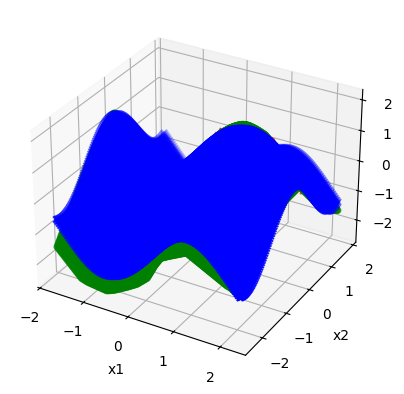

************************************************************************

**Running training with lr=0.001, hidden_dim=32, batch_size=8, epochs=2000


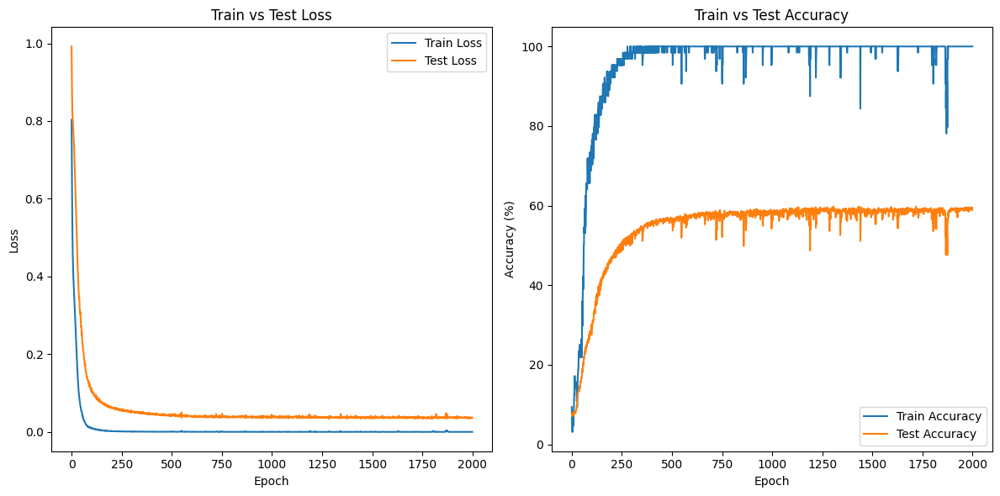

lr=0.001, hidden_dim=32, batch_size=8, epochs=2000
Final Train Loss: 0.0001, Final Test Loss: 0.0359
Final Train Accuracy: 100.00%, Final Test Accuracy: 58.95%

Average Train Accuracy (last 100 epochs): 100.00%, Average Test Accuracy (last 100 epochs): 59.03%

net_outputs_test[0] [-1.3665531 -1.3224084 -1.2782637 ... -1.5114442 -1.5355885 -1.5597324]


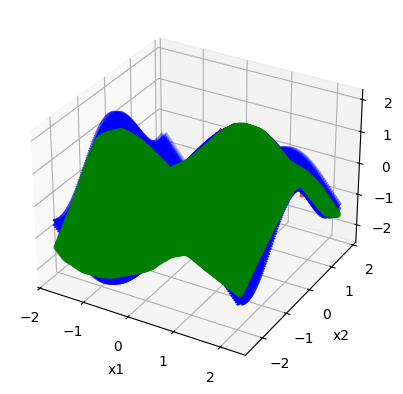

************************************************************************

**Running training with lr=0.001, hidden_dim=64, batch_size=8, epochs=2000


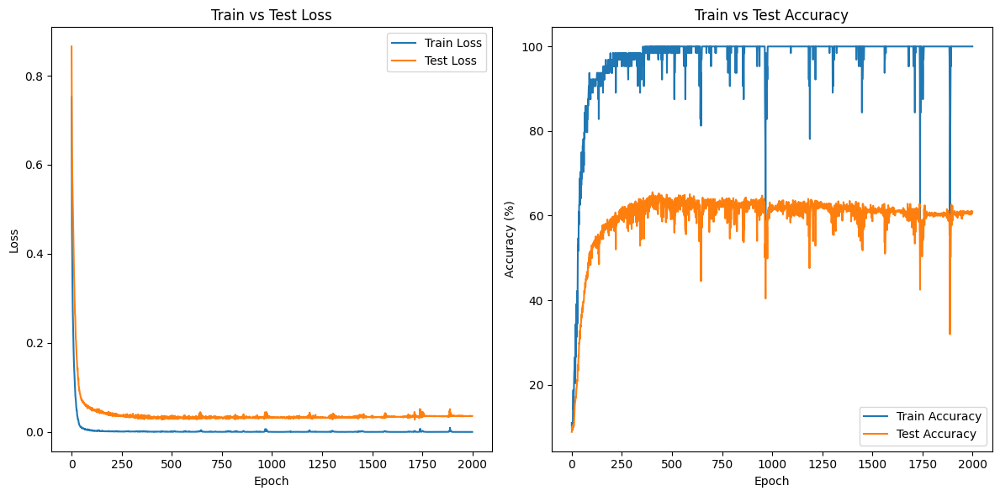

lr=0.001, hidden_dim=64, batch_size=8, epochs=2000
Final Train Loss: 0.0000, Final Test Loss: 0.0358
Final Train Accuracy: 100.00%, Final Test Accuracy: 60.97%

Average Train Accuracy (last 100 epochs): 100.00%, Average Test Accuracy (last 100 epochs): 60.56%

net_outputs_test[0] [-1.2575207 -1.2260121 -1.1945126 ... -1.3367649 -1.3553965 -1.3740281]


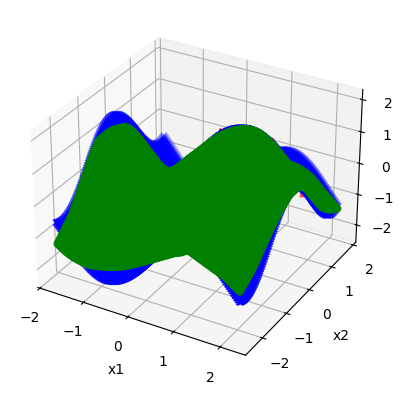

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=4, epochs=2000


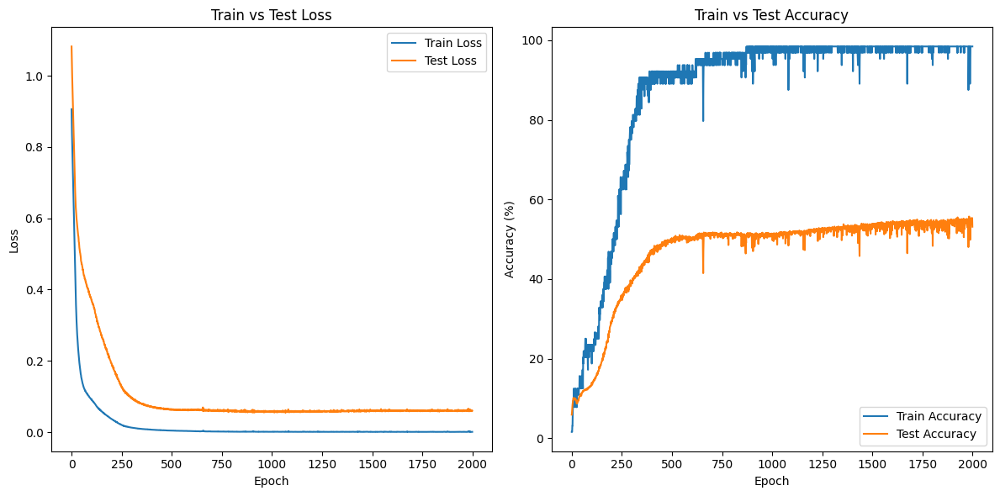

lr=0.001, hidden_dim=16, batch_size=4, epochs=2000
Final Train Loss: 0.0007, Final Test Loss: 0.0601
Final Train Accuracy: 98.44%, Final Test Accuracy: 53.13%

Average Train Accuracy (last 100 epochs): 97.92%, Average Test Accuracy (last 100 epochs): 53.95%

net_outputs_test[0] [-1.2101133 -1.1929004 -1.1756874 ... -1.5296009 -1.5417655 -1.5499425]


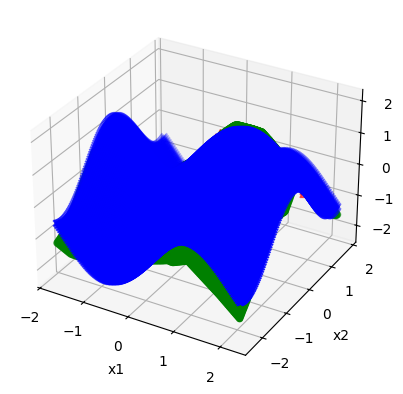

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=8, epochs=2000


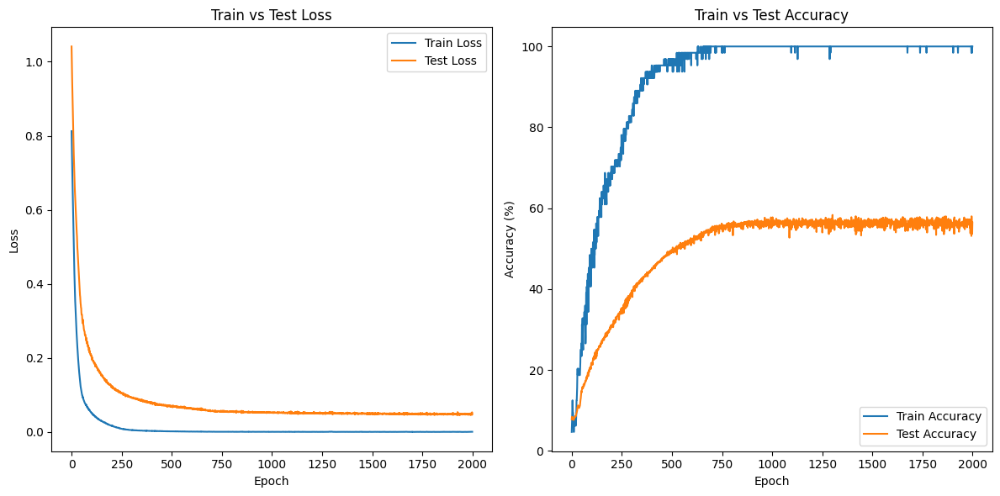

lr=0.001, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0006, Final Test Loss: 0.0479
Final Train Accuracy: 100.00%, Final Test Accuracy: 56.46%

Average Train Accuracy (last 100 epochs): 99.94%, Average Test Accuracy (last 100 epochs): 56.16%

net_outputs_test[0] [-1.5111951 -1.4618909 -1.4125869 ... -1.1764042 -1.1790135 -1.1816223]


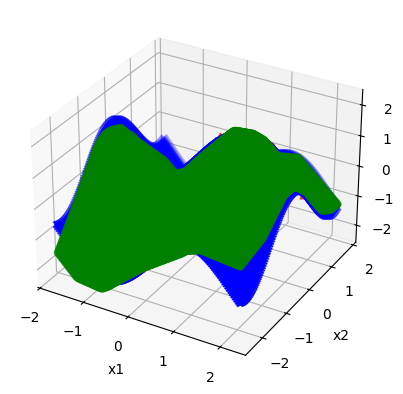

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=16, epochs=2000


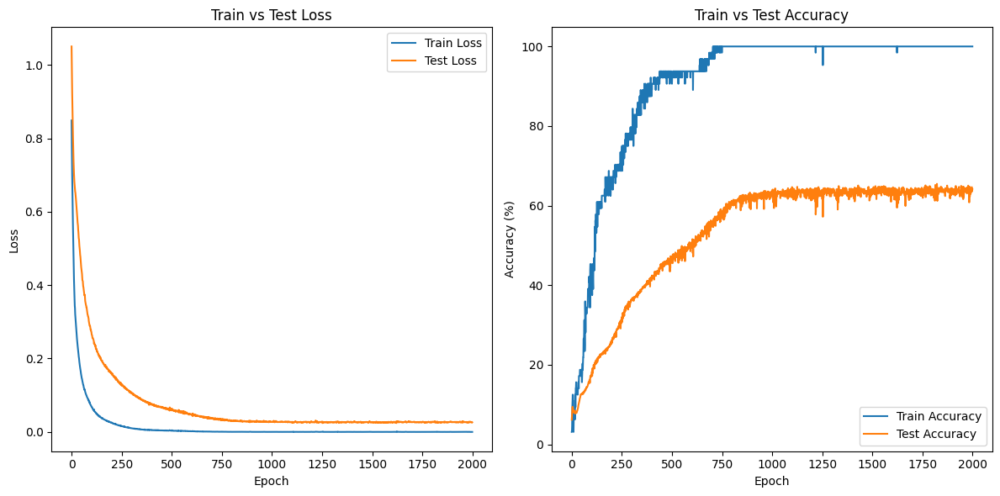

lr=0.001, hidden_dim=16, batch_size=16, epochs=2000
Final Train Loss: 0.0001, Final Test Loss: 0.0263
Final Train Accuracy: 100.00%, Final Test Accuracy: 64.10%

Average Train Accuracy (last 100 epochs): 100.00%, Average Test Accuracy (last 100 epochs): 63.72%

net_outputs_test[0] [-1.3003166 -1.2651467 -1.2299767 ... -1.421277  -1.4477774 -1.474277 ]


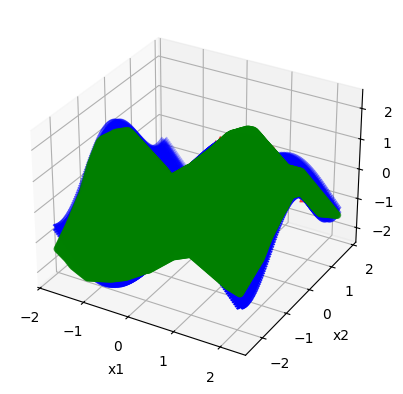

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=32, epochs=2000


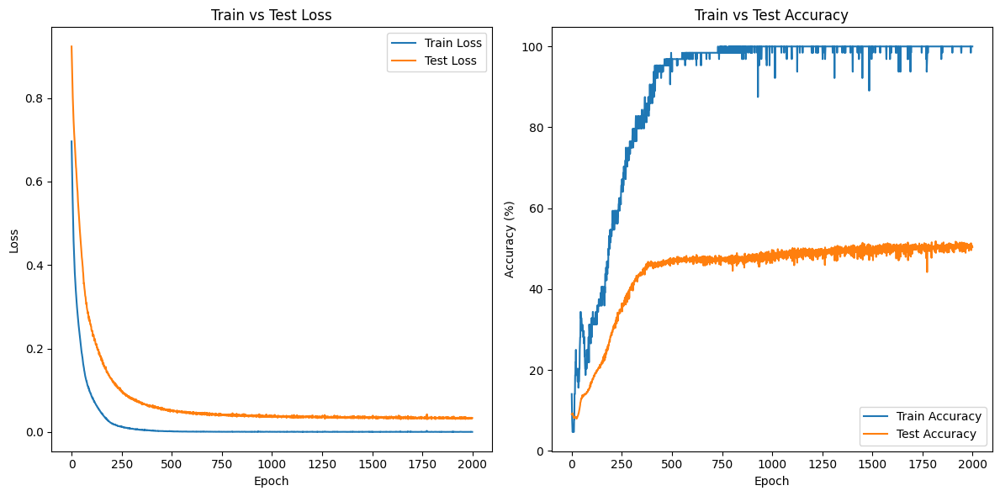

lr=0.001, hidden_dim=16, batch_size=32, epochs=2000
Final Train Loss: 0.0003, Final Test Loss: 0.0337
Final Train Accuracy: 100.00%, Final Test Accuracy: 50.41%

Average Train Accuracy (last 100 epochs): 99.95%, Average Test Accuracy (last 100 epochs): 50.50%

net_outputs_test[0] [-1.492714  -1.4487281 -1.4047425 ... -1.3983328 -1.4229164 -1.4474999]


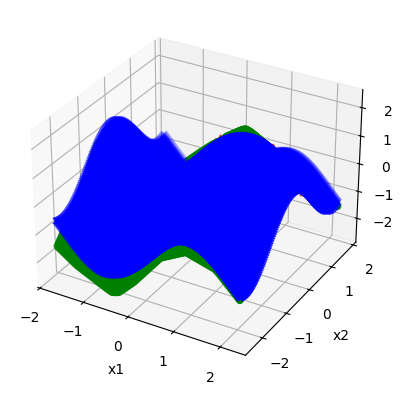

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=8, epochs=1000


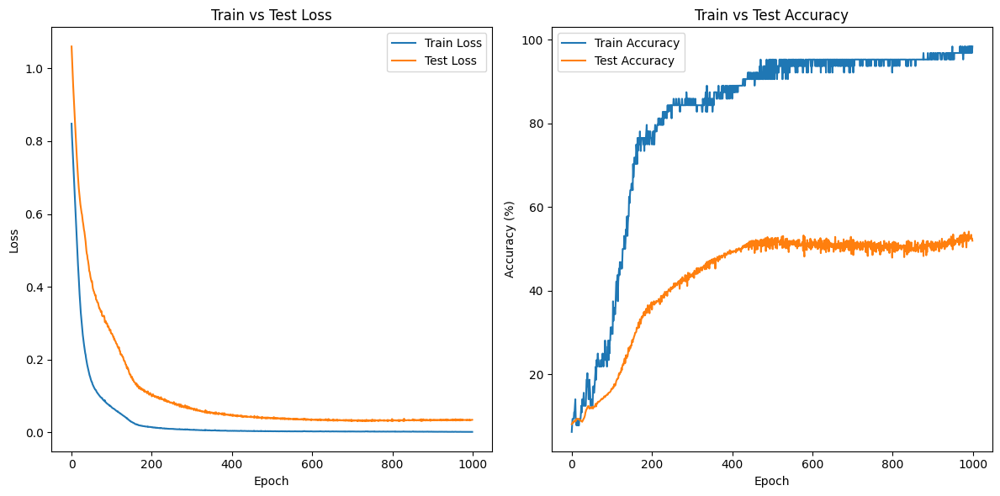

lr=0.001, hidden_dim=16, batch_size=8, epochs=1000
Final Train Loss: 0.0008, Final Test Loss: 0.0340
Final Train Accuracy: 98.44%, Final Test Accuracy: 51.98%

Average Train Accuracy (last 100 epochs): 96.69%, Average Test Accuracy (last 100 epochs): 51.69%

net_outputs_test[0] [-1.5056807 -1.4586889 -1.4116974 ... -1.2939851 -1.313318  -1.3196863]


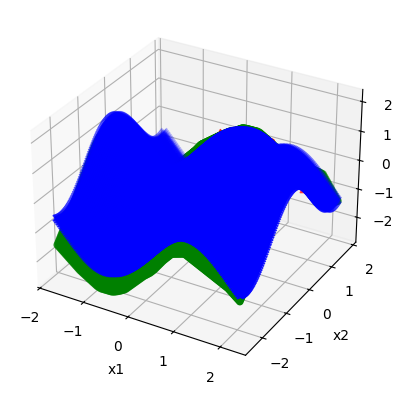

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=8, epochs=2000


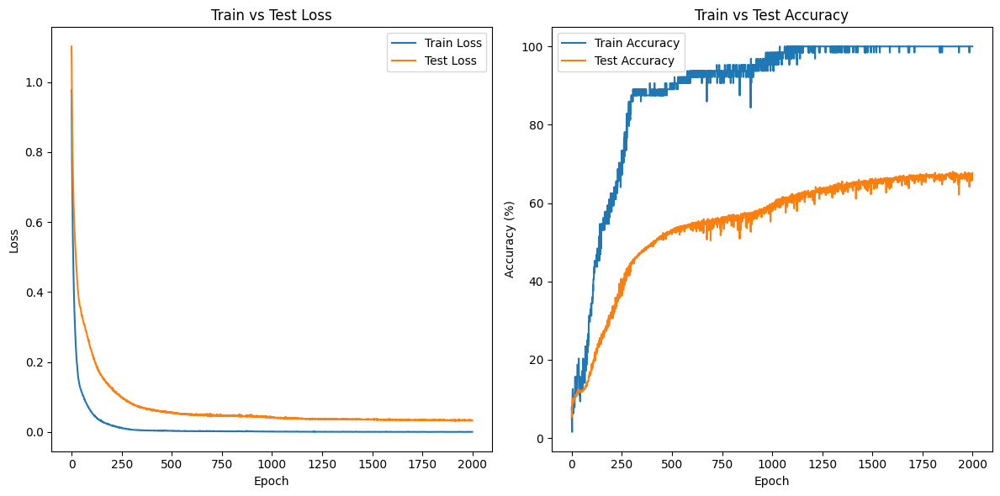

lr=0.001, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0004, Final Test Loss: 0.0329
Final Train Accuracy: 100.00%, Final Test Accuracy: 67.69%

Average Train Accuracy (last 100 epochs): 99.97%, Average Test Accuracy (last 100 epochs): 66.74%

net_outputs_test[0] [-1.4066578 -1.3561423 -1.3056271 ... -1.081505  -1.1036311 -1.1257573]


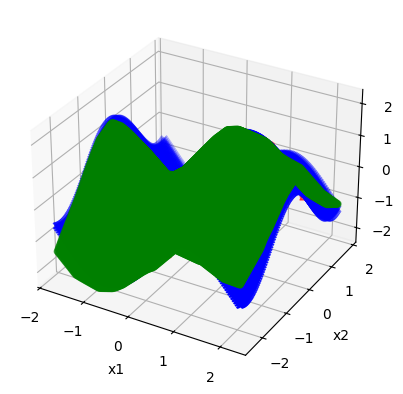

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=8, epochs=3000


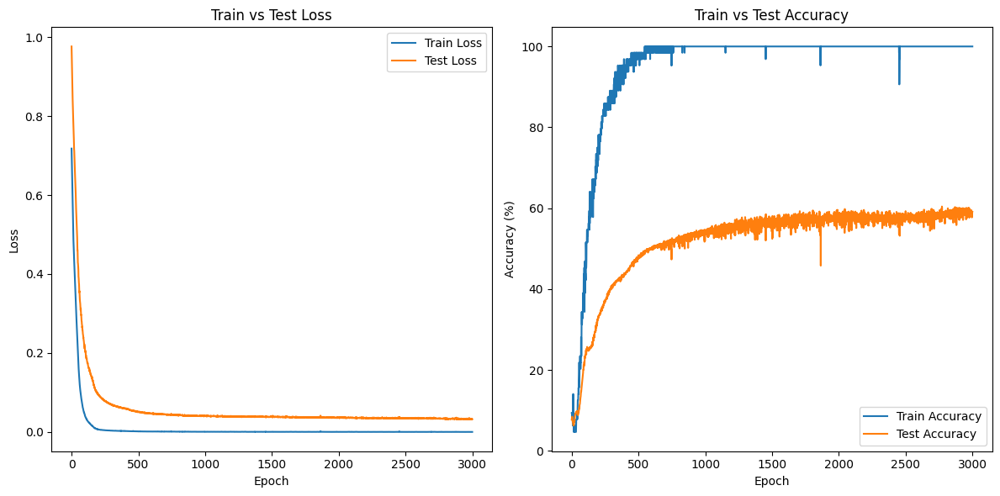

lr=0.001, hidden_dim=16, batch_size=8, epochs=3000
Final Train Loss: 0.0001, Final Test Loss: 0.0323
Final Train Accuracy: 100.00%, Final Test Accuracy: 59.13%

Average Train Accuracy (last 100 epochs): 100.00%, Average Test Accuracy (last 100 epochs): 58.99%

net_outputs_test[0] [-1.3410835 -1.2981471 -1.2552112 ... -1.39181   -1.4142301 -1.4366502]


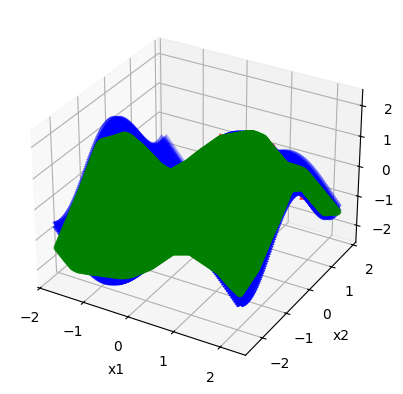

************************************************************************


In [33]:
###############################################Modified Code to 3D#########################################################
#############################4. different Hyperparameters new version with test loss  and add normalization and dropout#####################################################
##### 保留原始代码，只修改部分代码，不覆盖

# Import matplotlib for plotting purposes
import matplotlib
matplotlib.rcParams["text.usetex"] = False
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Sometimes, we need Numpy, but wherever possible, we prefer torch.
import numpy as np

# Import PyTorch
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader

# Float (32 bit) or Double (64 bit) precision? Choose!
torch.set_default_dtype(torch.float32)#64)
torch.set_num_threads(4) # Use _maximally_ 4 CPU cores

# This is a list to store the losses of the different hyperparameter configurations
train_losses_all = []
test_losses_all = []
models = []

# This is a list to store the hyperparameters of the training
# hyperparam_log = []

#device = torch.device("cpu")
# Choose a device for major calculations (if there is a special GPU card, you usually want that).

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")
device = torch.device(device)

# File path for saving the trained NN later.
# If only providing the file name (like here), the file will be generated in the same folder as the Python script
model_file = "mymodel.torch"

## The following script shows a data-driven training of a Neural Network.
## The data is generated in this script, too, by sampling from a function.
## The variables below are used to control this sampling
samples = 64
sample_min = -3
sample_max = 3
sample_span = sample_max - sample_min

## These parameters are usual hyperparameters of the NN and its training.
# batch_size = 8 # How many samples shall be presented to the NN, before running another optimizer step?
# hidden_dim = 16 # How many neurons shall there be in the hidden layer(s)?
input_dim = 2 # Input dimension of the NN (i.e. how many neurons are in the input layer?)
output_dim = 1 # Some for output

## Choose a criterion to evaluate the results. Here, we choose Mean Square error.
## The term "loss" means about the same as "remaining error" or "residual".
criterion = nn.MSELoss(reduction="mean")

## Here, we create the training data. In this example, we draw samples within the sampling interval and then pass it to
## e.g. the sin function (choose other functions to experiment with this script)
train_x = (sample_span * torch.rand(samples, 2) + sample_min * torch.ones(samples, 2))
train_y = torch.sin(train_x[:, 0]) + torch.cos(train_x[:, 1]) ##torch.pow(test_x, 2)

'''
# add noise to the training data
noise_level = 0.2  # noise level
train_y += noise_level * torch.randn_like(train_y)
'''

## This function logs the hyperparameters of the training
def log_hyperparameters(config, train_loss, test_loss, train_losses, train_accuracies, test_accuracies):
    hyperparam_log.append({
        "learning_rate": config["lr"],
        "hidden_dim": config["hidden_dim"],
        "batch_size": config["batch_size"],
        "epochs": config["epochs"],
        "final_train_loss": train_loss,
        "final_test_loss": test_loss,
        "final_train_accuracy": train_accuracies[-1],
        "final_test_accuracy": test_accuracies[-1],
        "train_losses": train_losses,
        "train_accuracies": train_accuracies,
        "test_accuracies": test_accuracies
    })


# print ("train_x", train_x)
# print ("train_y", train_y)

## Here, we create the test data. To show the effect of extrapolation and the detailed behavior of the NN,
## we choose points a bit outside the interval that we used for sampling training data. Also, we very dense points.
# test_x = torch.zeros(20*samples, 2)
# test_x[:, 0] = torch.linspace(sample_min - 0.5*sample_span, sample_max + 0.5*sample_span, test_x.size()[0])
# test_x[:, 1] = torch.linspace(sample_min - 0.5*sample_span, sample_max + 0.5*sample_span, test_x.size()[0])

# create test_x with meshgrid
grid_size = int(samples ** 0.5) * 2 
margin = 0.5  # only extend 1. from -5 to 5, extend to -5.5 to 5.5 
x1 = torch.linspace(sample_min - margin, sample_max + margin, 2*samples)
x2 = torch.linspace(sample_min - margin, sample_max + margin, 2*samples)
x1, x2 = torch.meshgrid(x1, x2) 
test_x = torch.zeros(2*samples*2*samples, 2)
test_x[:, 0] = x1.reshape(-1)
test_x[:, 1] = x2.reshape(-1)
test_y = torch.sin(test_x[:, 0]) + torch.cos(test_x[:, 1]) ##torch.pow(test_x, 2)

# standardize the data
scaler = StandardScaler()
train_x = torch.tensor(scaler.fit_transform(train_x), dtype=torch.float32)
test_x = torch.tensor(scaler.transform(test_x), dtype=torch.float32)

## We want a DataLoader to handle batching and shuffling of the training data for us.
## The DataLoader needs a TensorDataset, hence we create one from the Training data.
train_data = TensorDataset(train_x, train_y)
train_loader = DataLoader(train_data, shuffle=True, batch_size=batch_size, drop_last=False)


## This class creates the actual Neural Network.
class MLNet(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(MLNet, self).__init__()
        self.hidden_dim = hidden_dim

        ## In this case, I decided to pack the layers into a single container of type nn.Sequential
        ## This container is useful for Fully Connected NNs, where the output of each layer is just fed into the following layer.
        ## added dropout layer, which is a regularization technique to prevent overfitting
        self.fcnn1 = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            #nn.Tanh(),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            #nn.Linear(hidden_dim, hidden_dim),
            #nn.Dropout(p=0.1),  # Dropout layer with 30% of neurons being dropped，but it's not working well，the model underfitting, so change to 0.05
            #nn.ReLU(),
            nn.Linear(hidden_dim, output_dim),
        ) ## That network here has exactly 1 hidden layer (comment out some lines or write new ones to add more layers)
        ## nn.Linear is in the pictures represented by the arrows and has the weights (and biases) which are the
        ## parameters of the NN.
        ## nn.ReLU and Tanh are examples for activation functions - in the pictures, these are the bubbles / neurons.
        ## Usually, the pattern is interchanging between one linear layer, one activation function, one linear layer, one activation function and so on

    ## It is required to write a function that is executed when calling the NN model.
    ## Usually, it takes the input data and passes it through the layers.
    ## Here, it is sufficient to call the sequential container since this container does exactly this job.
    ## But this function "forward" could also be used to set up more complex NN architectures with more complex data flows
    def forward(self, x):
        out = self.fcnn1(x)
        return out

## This function performs a test run with the NN.
## It takes the NN model and the test data, passes the test inputs through the network and
## compares it with the target values = test outputs = targets
## and based on that calculates the loss value
def evaluate(model, test_x, test_y):
    ## For testing, we don't need the autograd feature/ protocol of all calculation steps
    ## So, save some time and disable grad tracking.
    with torch.no_grad():
        model.eval() ## Set the NN model into evaluation mode
        outputs = [] ## Create empty lists to store the results
        targets = []
        testlosses = []

        out = model(test_x.to(device)) ## Call the model, i.e. perform the actual inference

        ## Move the output quantities to the CPU, detach them from the tensor operation book-keeping and convert them to numpy arrays/ vectors.
        ## This is all necessary for plotting
        outputs.append(out.cpu().detach().numpy())
        targets.append(test_y.cpu().detach().numpy())
        testlosses.append(criterion(out, test_y.to(device)).item())

    ## Now return that in form of a triple of variables
    return outputs, targets, testlosses

## This calls the evaluate function and takes care of the plotting.
def eval_and_plot(model):
        ## matplotlib tries to be similar to the plot functions of matlab  (admittedly, the commands have to begin with "plt.", but the rest
        ## is quite similar.)

        # create a 3D plot
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        ## Call the network on the test data
        net_outputs_test, targets_test, testlosses = evaluate(model, test_x, test_y)   
        # Plot the targets first in blue (which means to plot the actual function over the whole test interval)
        #ax.plot(test_x[:, 0], test_x[:, 1], targets_test[0], color="-b", label="Target")
        ax.scatter(test_x[:, 0], test_x[:, 1], targets_test[0], c='b', marker='x', label='Target')
        ax.set_xlabel('x1')
        ax.set_ylabel('x2')
        ax.set_zlabel('y')

        ## Call the network on the training data
        net_outputs_train, targets_train, testlosses = evaluate(model, train_x, train_y)
        ## First, plot the targets in red, i.e. plot the training data set
        ax.scatter(train_x[:, 0], train_x[:, 1], targets_train[0], c='r', s=100, marker='^', label='Target')

        ## Now, plot the output of the NN on the whole test interval in green
        ## This allows us to see how the NN performs for interpolation as well as for extrapolation
        ax.scatter(test_x[:, 0], test_x[:, 1], net_outputs_test[0].reshape(-1), c='g', marker='o', label='Learned')
        print("net_outputs_test[0]", net_outputs_test[0].reshape(-1))

        ## All plotting is done, open the plot window
        plt.show()

def calculate_accuracy(predictions, targets, threshold = train_y.std().item() * 0.1):
    """
    Calculate accuracy for regression by checking if predictions are within a certain range of targets.
    Args:
        predictions: Predicted values (torch.Tensor).
        targets: Actual values (torch.Tensor).
        threshold: Acceptable error range for considering a prediction as correct.
    Returns:
        Accuracy as a percentage (float).
    """
    correct = torch.abs(predictions - targets) <= threshold
    return correct.float().mean().item() * 100  # Convert to percentage

def train_with_logging(train_loader, lr_run, hidden_dim_run, EPOCHS):
    model = MLNet(input_dim, hidden_dim_run, output_dim).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr_run, weight_decay=0)

    train_losses = []
    test_losses = []
    train_accuracies = []
    test_accuracies = []

    for epoch in range(EPOCHS):
        model.train()
        avg_loss = 0.
        for x, label in train_loader:
            model.zero_grad()
            out = model(x.to(device)).squeeze(-1)
            loss = criterion(out, label.to(device))
            loss.backward()
            optimizer.step()
            avg_loss += loss.item()
        
        # Store train loss for the epoch
        train_losses.append(avg_loss / len(train_loader))

        # Evaluate train and test accuracy
        with torch.no_grad():
            model.eval()
            train_out = model(train_x.to(device)).squeeze(-1)
            train_accuracy = calculate_accuracy(train_out, train_y.to(device))
            train_accuracies.append(train_accuracy)

            test_out = model(test_x.to(device)).squeeze(-1)
            test_loss = criterion(test_out, test_y.to(device)).item()
            test_losses.append(test_loss)

            test_accuracy = calculate_accuracy(test_out, test_y.to(device))
            test_accuracies.append(test_accuracy)

        avg_final_train_acc = np.mean(train_accuracies[-100:]) if len(train_accuracies) >= 100 else train_accuracies[-1]
        avg_final_test_acc = np.mean(test_accuracies[-100:]) if len(test_accuracies) >= 100 else test_accuracies[-1]


    return model, train_losses, test_losses, train_accuracies, test_accuracies, avg_final_train_acc, avg_final_test_acc



## As the functions written before are just function definitions,
## those functions still have to be called.
## This is done here.
## Train the model
# model = train(train_loader, lr, epochs)

## Test that saving the model worked: load it from file
# model = torch.load(model_file)
## and evaluate and plot once
# eval_and_plot(model)

###################### Hyperparameter Search Loop ######################
hyperparam_log = []  # reset hyperparam_log

hyperparam_configs = [
    # control variable: learning rate (lr) changes
    {"lr": 0.02,    "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.01,    "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.005,   "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.002,   "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.0005,  "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.0001,  "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},

    # control variable: hidden dimension (hidden_dim) changes
    {"lr": 0.001,   "hidden_dim": 8,  "batch_size": 8,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 32, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 64, "batch_size": 8,  "epochs": 2000},

    # control variable: batch size (batch_size) changes
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 4,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 16, "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 32, "epochs": 2000},

    # control variable: epochs changes
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 8,  "epochs": 1000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 8,  "epochs": 3000},

]

for config in hyperparam_configs:
    lr_run          = config["lr"]
    hidden_dim_run  = config["hidden_dim"]
    batch_size_run  = config["batch_size"]
    epochs_run      = config["epochs"]

    print(f"\n**Running training with lr={lr_run}, hidden_dim={hidden_dim_run}, batch_size={batch_size_run}, epochs={epochs_run}")

    # Train the model with logging
    model, train_losses, test_losses, train_accuracies, test_accuracies, avg_train_accracy, avg_test_accuracy = train_with_logging(train_loader, lr_run, hidden_dim_run, epochs_run)

    # Plot the losses and accuracies
    plt.figure(figsize=(12, 6))
    
    # Loss plot
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label="Train Loss")
    plt.plot(test_losses, label="Test Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Train vs Test Loss")
    plt.legend()

    # Accuracy plot
    plt.subplot(1, 2, 2)
    plt.plot(train_accuracies, label="Train Accuracy")
    plt.plot(test_accuracies, label="Test Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy (%)")
    plt.title("Train vs Test Accuracy")
    plt.legend()

    plt.tight_layout()
    plt.show()

    print(f"lr={lr_run}, hidden_dim={hidden_dim_run}, batch_size={batch_size_run}, epochs={epochs_run}")
    print(f"Final Train Loss: {train_losses[-1]:.4f}, Final Test Loss: {test_losses[-1]:.4f}")
    print(f"Final Train Accuracy: {train_accuracies[-1]:.2f}%, Final Test Accuracy: {test_accuracies[-1]:.2f}%\n")
    print(f"Average Train Accuracy (last 100 epochs): {avg_train_accracy:.2f}%, Average Test Accuracy (last 100 epochs): {avg_test_accuracy:.2f}%\n")

    eval_and_plot(model)  # plot the training results
    print("************************************************************************")

###################### Hyperparameter Search Loop ######################


Using cpu device

**Running training with lr=0.02, hidden_dim=16, batch_size=8, epochs=2000


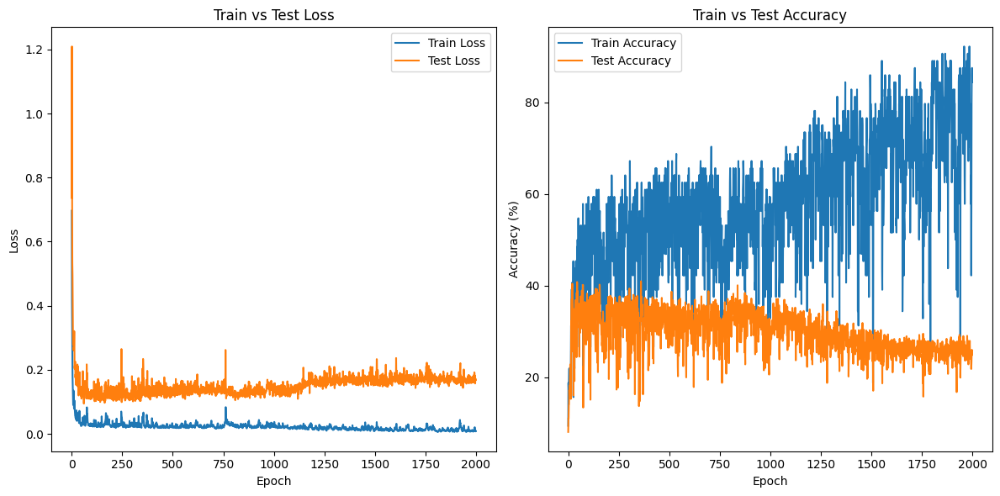

lr=0.02, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0080, Final Test Loss: 0.1681
Final Train Accuracy: 84.38%, Final Test Accuracy: 25.81%

Average Train Accuracy (last 100 epochs): 73.44%, Average Test Accuracy (last 100 epochs): 25.38%

net_outputs_test[0] [-1.6123782 -1.6058831 -1.5993878 ...  0.1963414  0.1963414  0.1963414]


d:\miniconda\Lib\site-packages\torch\nn\modules\loss.py:608: UserWarning: Using a target size (torch.Size([16384])) that is different to the input size (torch.Size([16384, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
d:\miniconda\Lib\site-packages\torch\nn\modules\loss.py:608: UserWarning: Using a target size (torch.Size([64])) that is different to the input size (torch.Size([64, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


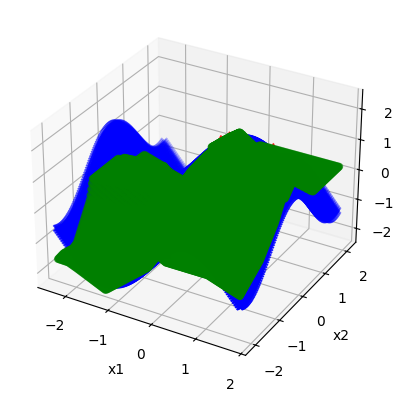

************************************************************************

**Running training with lr=0.01, hidden_dim=16, batch_size=8, epochs=2000


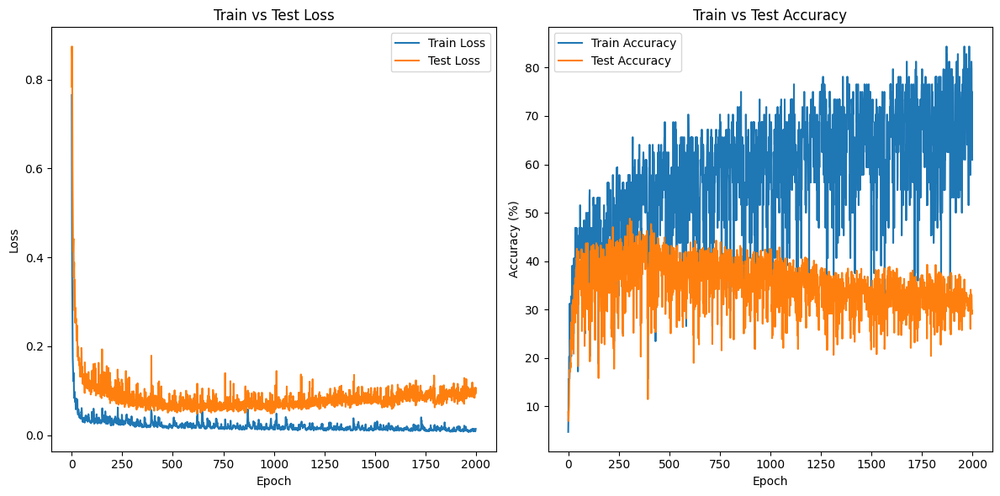

lr=0.01, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0142, Final Test Loss: 0.1060
Final Train Accuracy: 60.94%, Final Test Accuracy: 29.72%

Average Train Accuracy (last 100 epochs): 70.00%, Average Test Accuracy (last 100 epochs): 31.76%

net_outputs_test[0] [-1.0879843  -1.0254619  -0.9629388  ... -0.58552074 -0.5890336
 -0.5823864 ]


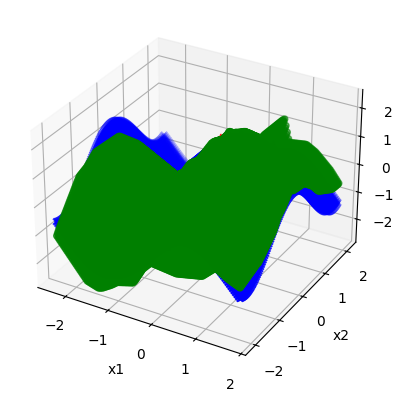

************************************************************************

**Running training with lr=0.005, hidden_dim=16, batch_size=8, epochs=2000


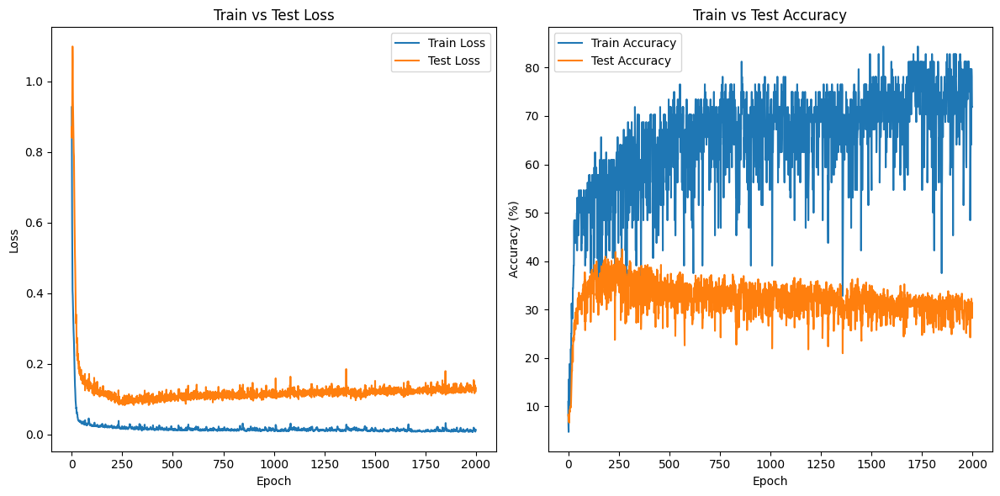

lr=0.005, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0126, Final Test Loss: 0.1223
Final Train Accuracy: 71.88%, Final Test Accuracy: 31.32%

Average Train Accuracy (last 100 epochs): 73.78%, Average Test Accuracy (last 100 epochs): 30.23%

net_outputs_test[0] [-1.5031908  -1.4524994  -1.4018078  ... -0.6065438  -0.63953173
 -0.63171124]


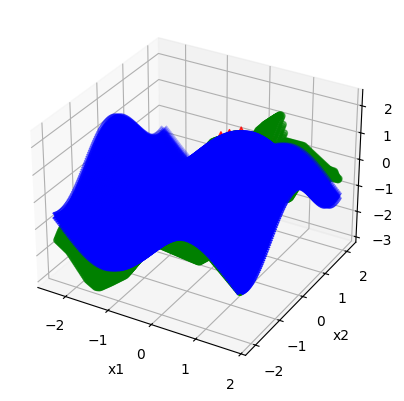

************************************************************************

**Running training with lr=0.002, hidden_dim=16, batch_size=8, epochs=2000


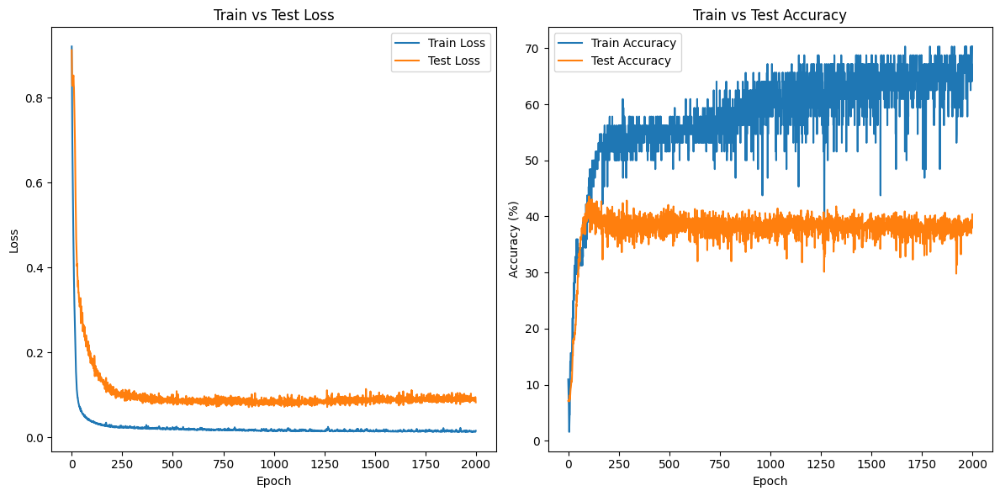

lr=0.002, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0159, Final Test Loss: 0.0827
Final Train Accuracy: 70.31%, Final Test Accuracy: 40.37%

Average Train Accuracy (last 100 epochs): 65.19%, Average Test Accuracy (last 100 epochs): 37.85%

net_outputs_test[0] [-1.5005268  -1.4460145  -1.3915023  ... -0.39216694 -0.39730653
 -0.40244588]


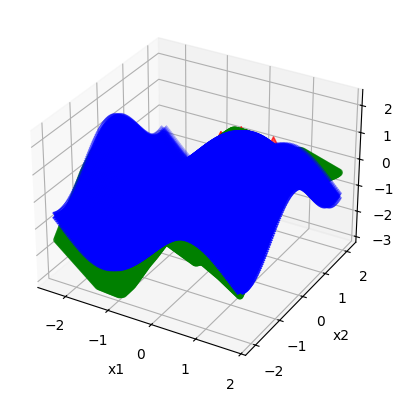

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=8, epochs=2000


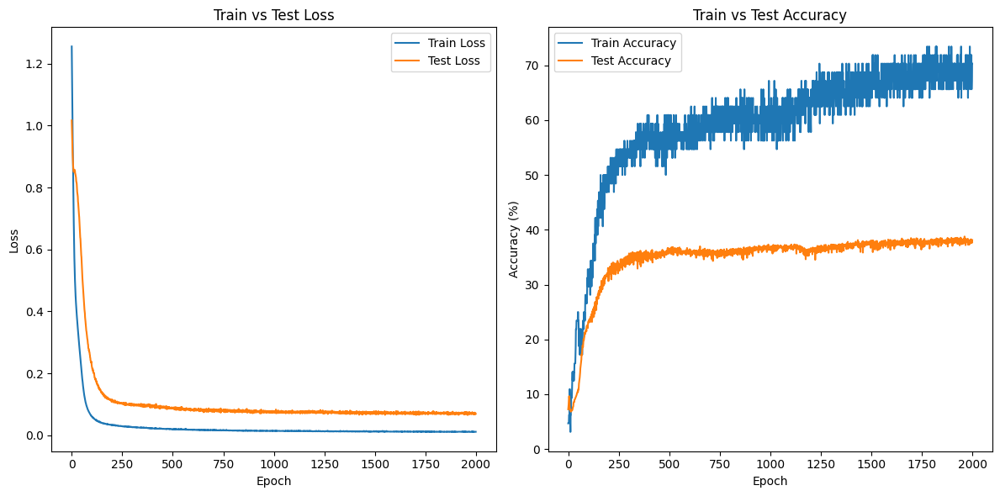

lr=0.001, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0110, Final Test Loss: 0.0689
Final Train Accuracy: 70.31%, Final Test Accuracy: 38.12%

Average Train Accuracy (last 100 epochs): 68.72%, Average Test Accuracy (last 100 epochs): 37.91%

net_outputs_test[0] [-1.5669014  -1.5202401  -1.4735792  ... -0.69516575 -0.7108087
 -0.72613037]


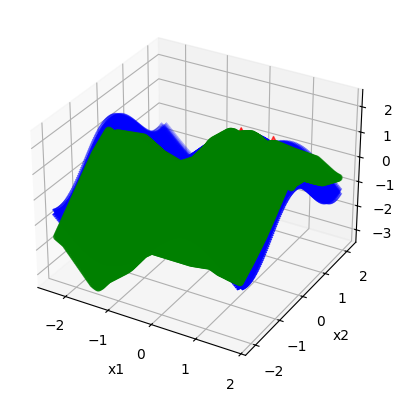

************************************************************************

**Running training with lr=0.0005, hidden_dim=16, batch_size=8, epochs=2000


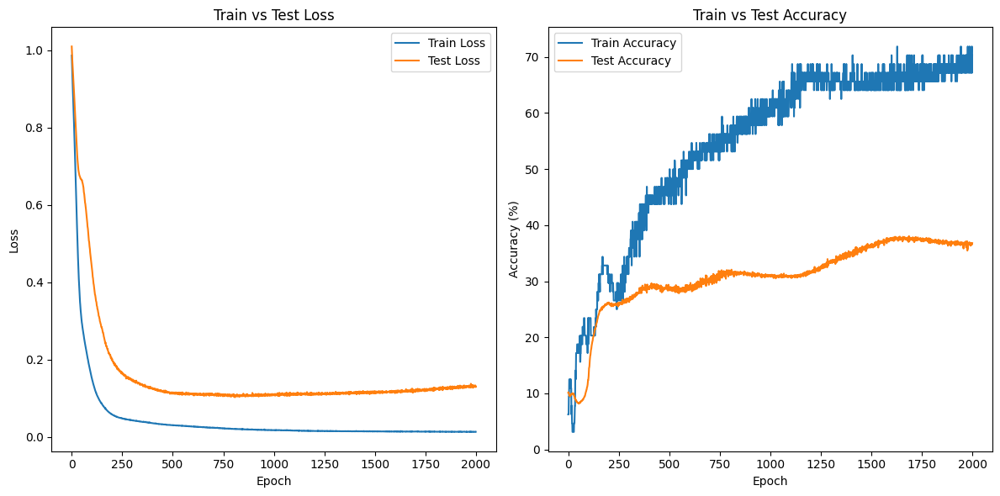

lr=0.0005, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0137, Final Test Loss: 0.1298
Final Train Accuracy: 70.31%, Final Test Accuracy: 36.80%

Average Train Accuracy (last 100 epochs): 68.61%, Average Test Accuracy (last 100 epochs): 36.68%

net_outputs_test[0] [-1.1867669  -1.1069008  -1.0455726  ...  0.19217873  0.21986234
  0.24754614]


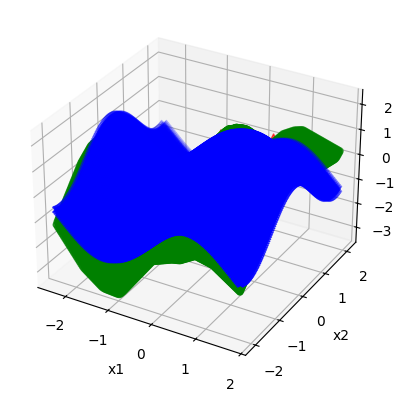

************************************************************************

**Running training with lr=0.0001, hidden_dim=16, batch_size=8, epochs=2000


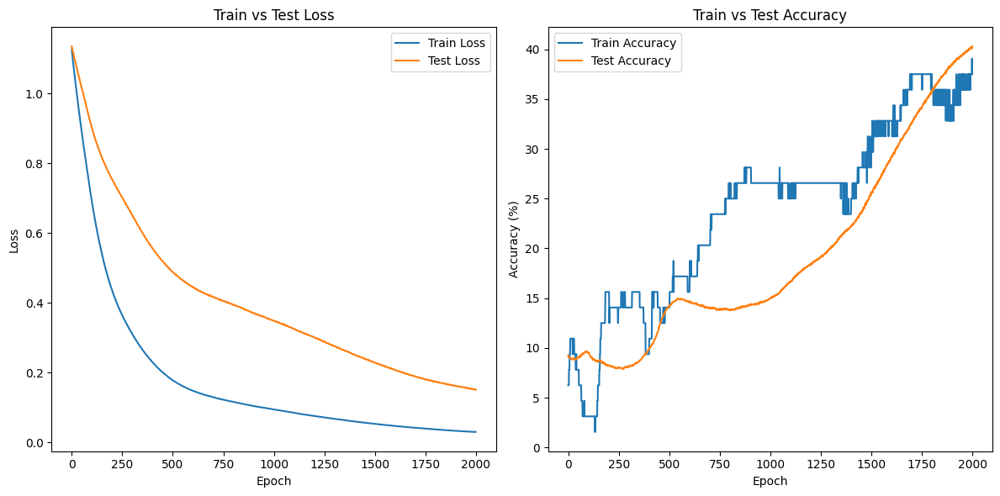

lr=0.0001, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0303, Final Test Loss: 0.1513
Final Train Accuracy: 37.50%, Final Test Accuracy: 40.28%

Average Train Accuracy (last 100 epochs): 36.17%, Average Test Accuracy (last 100 epochs): 39.42%

net_outputs_test[0] [-2.2274923 -2.1934702 -2.1594477 ... -0.849529  -0.889132  -0.9287356]


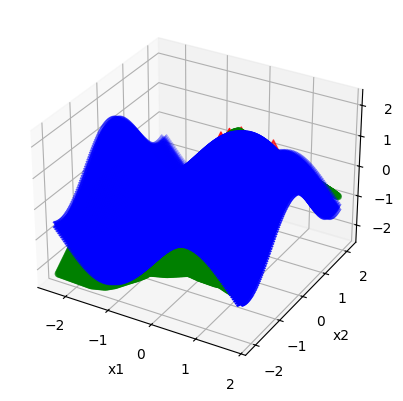

************************************************************************

**Running training with lr=0.001, hidden_dim=8, batch_size=8, epochs=2000


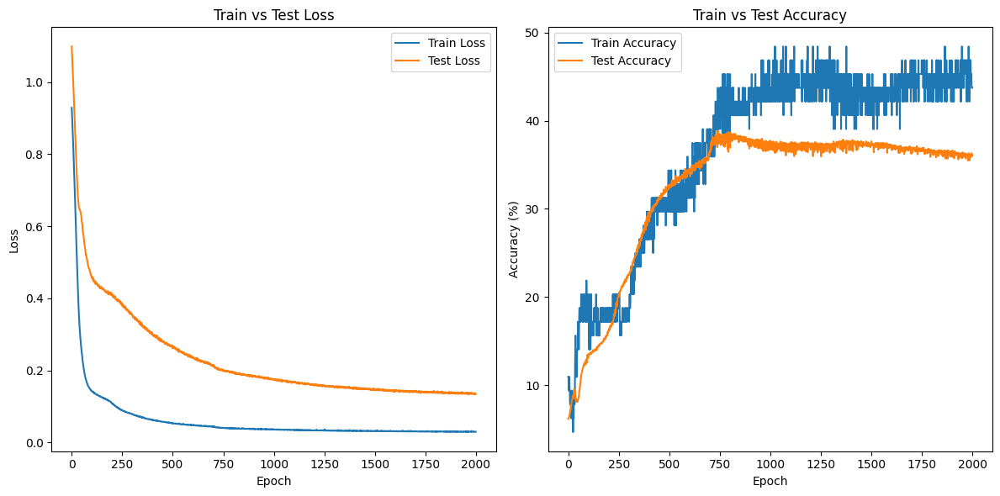

lr=0.001, hidden_dim=8, batch_size=8, epochs=2000
Final Train Loss: 0.0297, Final Test Loss: 0.1345
Final Train Accuracy: 43.75%, Final Test Accuracy: 36.07%

Average Train Accuracy (last 100 epochs): 45.08%, Average Test Accuracy (last 100 epochs): 36.13%

net_outputs_test[0] [-1.8073031 -1.7708787 -1.734454  ... -0.5670426 -0.5828202 -0.5985974]


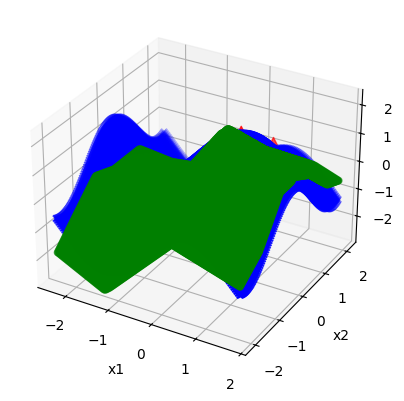

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=8, epochs=2000


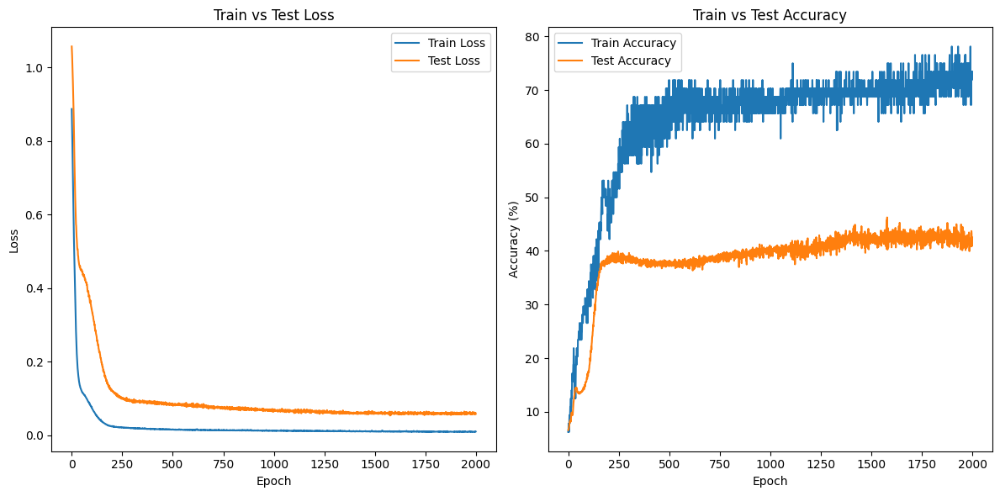

lr=0.001, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0103, Final Test Loss: 0.0582
Final Train Accuracy: 73.44%, Final Test Accuracy: 42.50%

Average Train Accuracy (last 100 epochs): 72.16%, Average Test Accuracy (last 100 epochs): 42.13%

net_outputs_test[0] [-1.2647328  -1.2301111  -1.1954894  ... -0.49414822 -0.5174769
 -0.54080534]


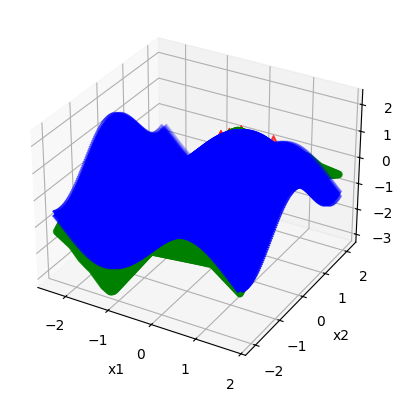

************************************************************************

**Running training with lr=0.001, hidden_dim=32, batch_size=8, epochs=2000


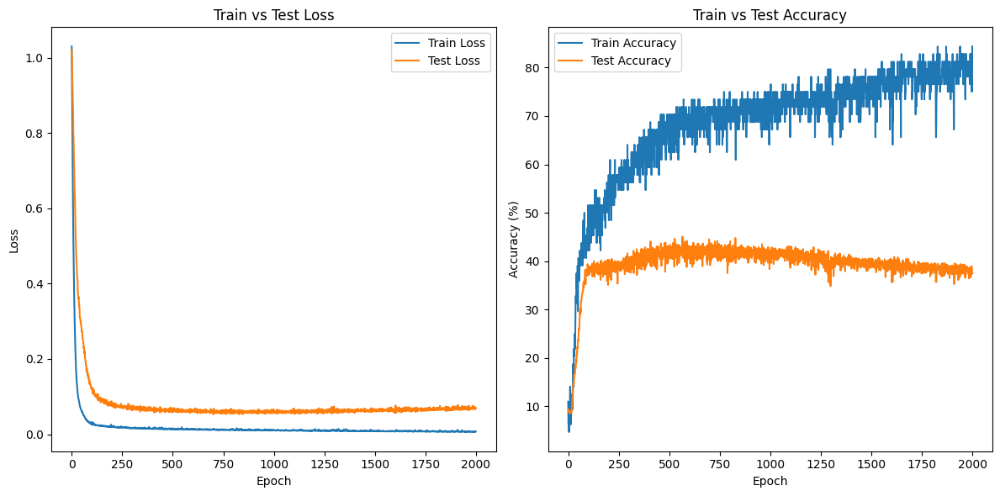

lr=0.001, hidden_dim=32, batch_size=8, epochs=2000
Final Train Loss: 0.0070, Final Test Loss: 0.0701
Final Train Accuracy: 84.38%, Final Test Accuracy: 37.42%

Average Train Accuracy (last 100 epochs): 79.78%, Average Test Accuracy (last 100 epochs): 38.11%

net_outputs_test[0] [-0.97582126 -0.939806   -0.9037906  ... -0.5601723  -0.5648767
 -0.56958085]


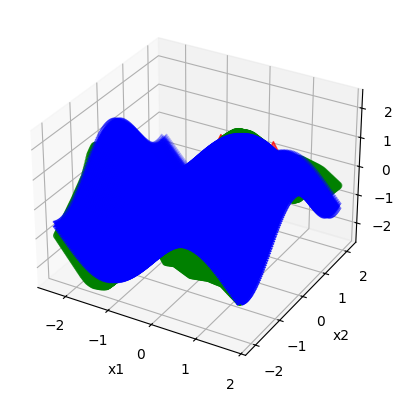

************************************************************************

**Running training with lr=0.001, hidden_dim=64, batch_size=8, epochs=2000


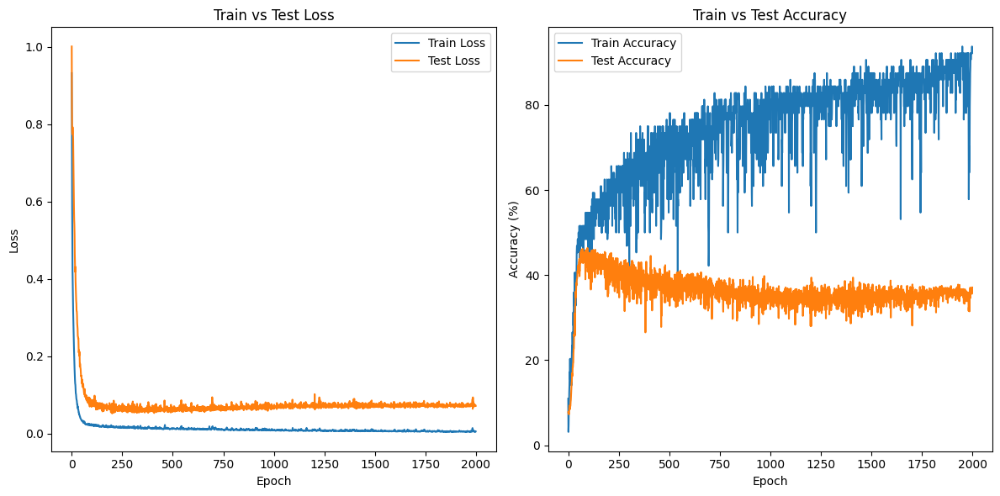

lr=0.001, hidden_dim=64, batch_size=8, epochs=2000
Final Train Loss: 0.0050, Final Test Loss: 0.0712
Final Train Accuracy: 92.19%, Final Test Accuracy: 37.09%

Average Train Accuracy (last 100 epochs): 87.14%, Average Test Accuracy (last 100 epochs): 35.54%

net_outputs_test[0] [-0.8276048  -0.7872858  -0.7469667  ... -0.40739396 -0.41517344
 -0.42295307]


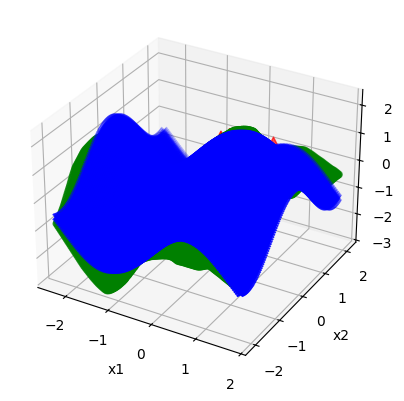

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=4, epochs=2000


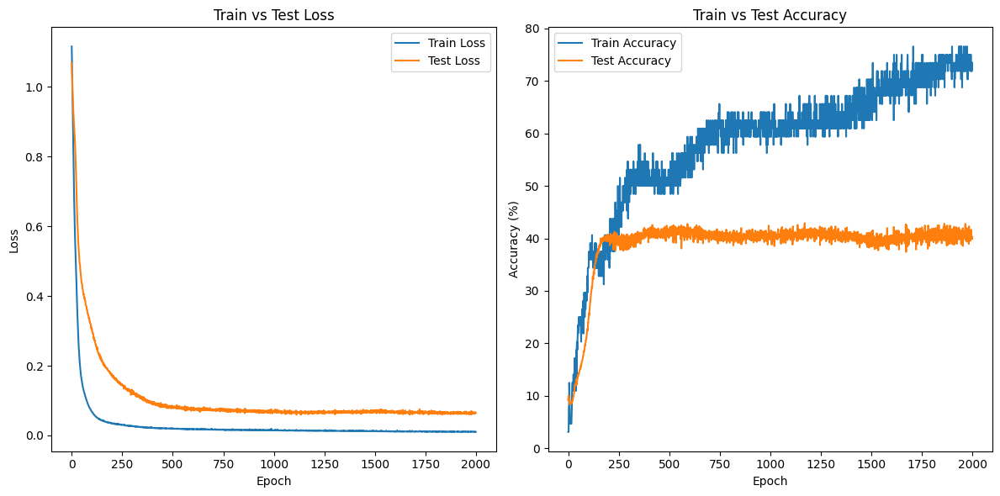

lr=0.001, hidden_dim=16, batch_size=4, epochs=2000
Final Train Loss: 0.0104, Final Test Loss: 0.0648
Final Train Accuracy: 73.44%, Final Test Accuracy: 39.91%

Average Train Accuracy (last 100 epochs): 73.33%, Average Test Accuracy (last 100 epochs): 40.58%

net_outputs_test[0] [-1.3146224  -1.2642522  -1.213881   ... -0.20561379 -0.20042956
 -0.19524485]


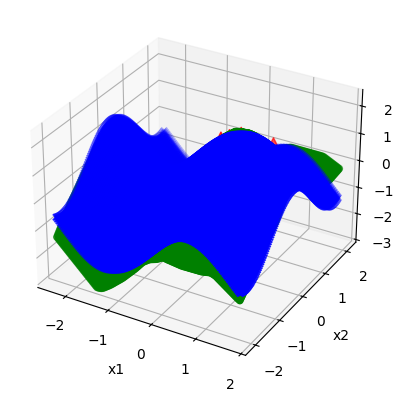

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=8, epochs=2000


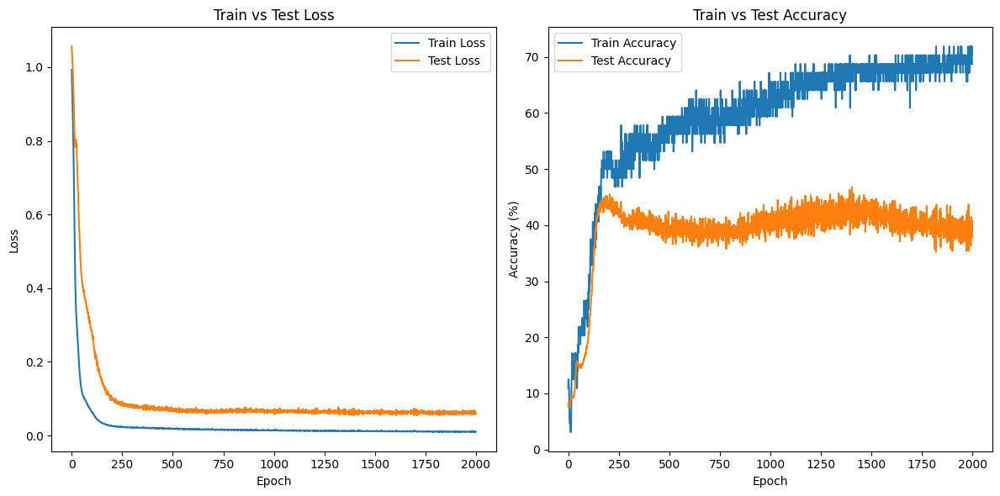

lr=0.001, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0100, Final Test Loss: 0.0606
Final Train Accuracy: 68.75%, Final Test Accuracy: 37.90%

Average Train Accuracy (last 100 epochs): 69.34%, Average Test Accuracy (last 100 epochs): 39.27%

net_outputs_test[0] [-1.3188096  -1.3025861  -1.2863623  ... -0.85340136 -0.8680457
 -0.8826899 ]


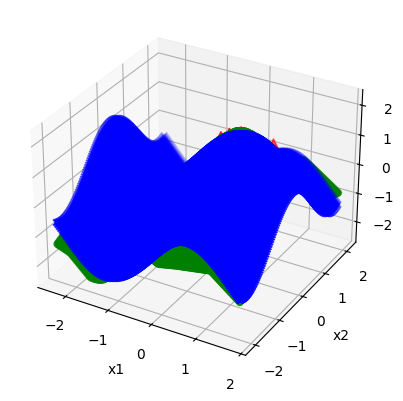

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=16, epochs=2000


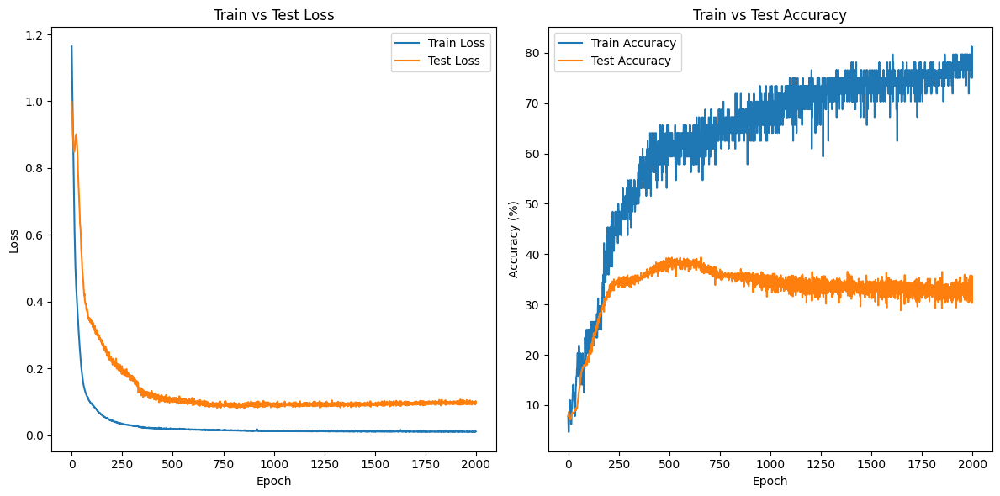

lr=0.001, hidden_dim=16, batch_size=16, epochs=2000
Final Train Loss: 0.0116, Final Test Loss: 0.0985
Final Train Accuracy: 79.69%, Final Test Accuracy: 32.60%

Average Train Accuracy (last 100 epochs): 77.42%, Average Test Accuracy (last 100 epochs): 32.76%

net_outputs_test[0] [-1.0711228  -1.0136187  -0.95611465 ...  0.08860055  0.08417186
  0.07974312]


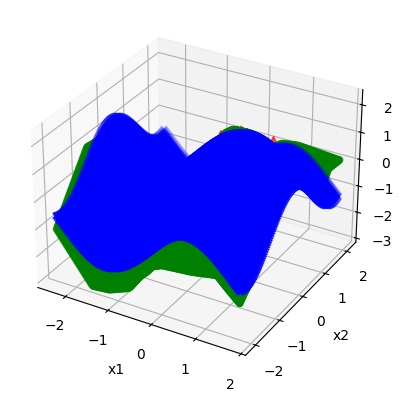

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=32, epochs=2000


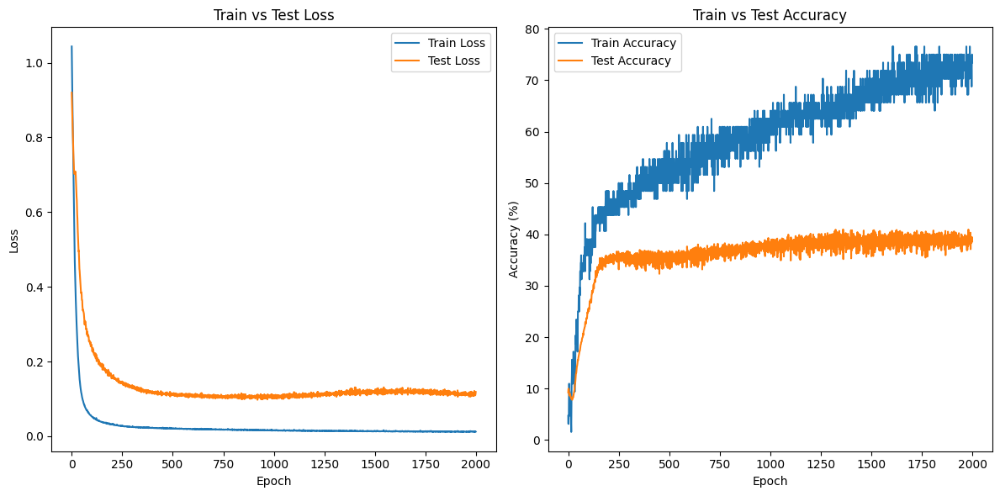

lr=0.001, hidden_dim=16, batch_size=32, epochs=2000
Final Train Loss: 0.0123, Final Test Loss: 0.1187
Final Train Accuracy: 73.44%, Final Test Accuracy: 38.71%

Average Train Accuracy (last 100 epochs): 72.39%, Average Test Accuracy (last 100 epochs): 38.78%

net_outputs_test[0] [-1.3699913 -1.3253901 -1.2807887 ... -1.4609797 -1.5054975 -1.5500152]


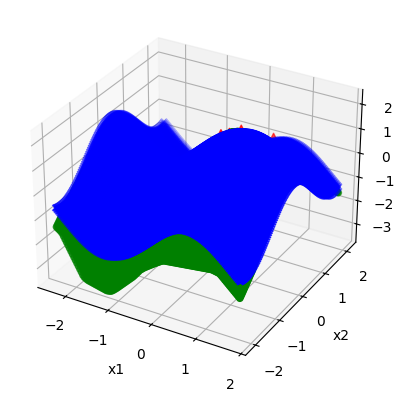

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=8, epochs=1000


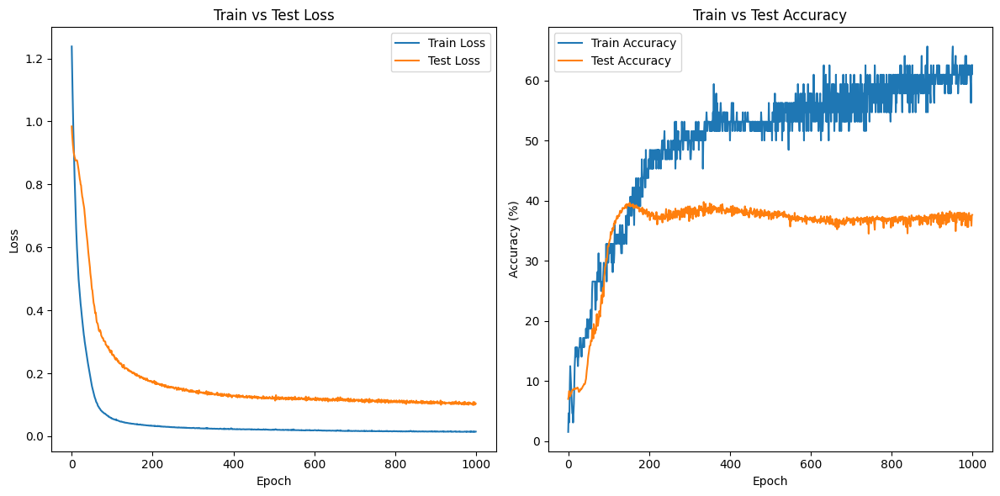

lr=0.001, hidden_dim=16, batch_size=8, epochs=1000
Final Train Loss: 0.0149, Final Test Loss: 0.1038
Final Train Accuracy: 62.50%, Final Test Accuracy: 37.64%

Average Train Accuracy (last 100 epochs): 60.80%, Average Test Accuracy (last 100 epochs): 37.16%

net_outputs_test[0] [-1.906345   -1.8664985  -1.8266516  ... -0.617996   -0.63395846
 -0.6499202 ]


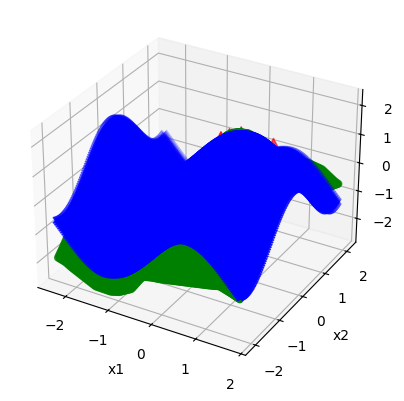

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=8, epochs=2000


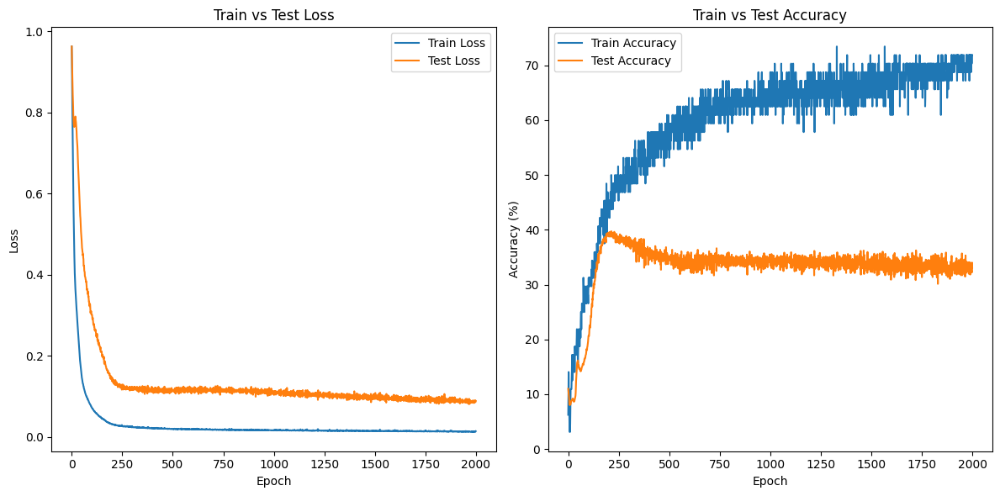

lr=0.001, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0142, Final Test Loss: 0.0889
Final Train Accuracy: 71.88%, Final Test Accuracy: 33.11%

Average Train Accuracy (last 100 epochs): 70.17%, Average Test Accuracy (last 100 epochs): 33.11%

net_outputs_test[0] [-1.1531318 -1.0993869 -1.0456412 ... -1.023798  -1.0488193 -1.0738399]


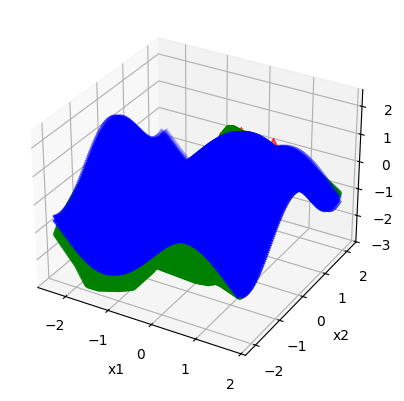

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=8, epochs=3000


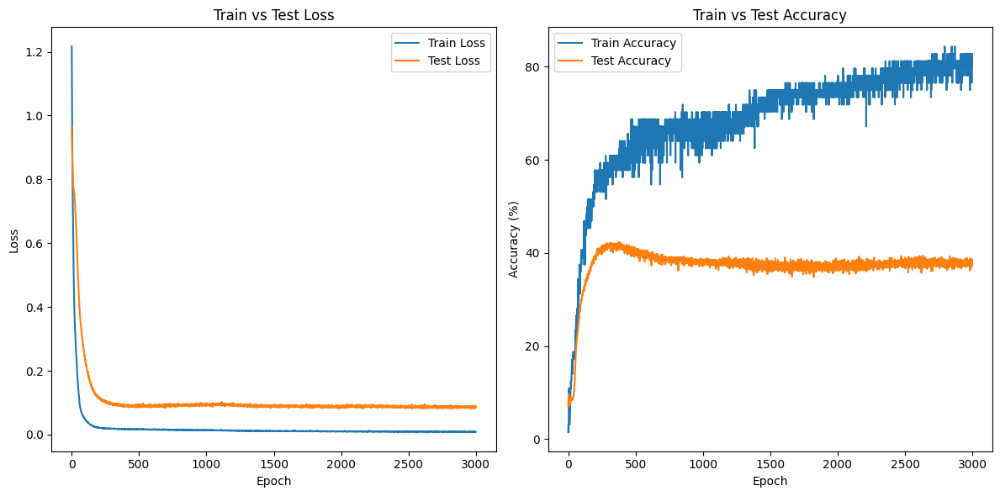

lr=0.001, hidden_dim=16, batch_size=8, epochs=3000
Final Train Loss: 0.0085, Final Test Loss: 0.0885
Final Train Accuracy: 81.25%, Final Test Accuracy: 37.45%

Average Train Accuracy (last 100 epochs): 80.52%, Average Test Accuracy (last 100 epochs): 37.78%

net_outputs_test[0] [-1.3688407  -1.3266358  -1.2844303  ... -0.3080666  -0.32528746
 -0.3425082 ]


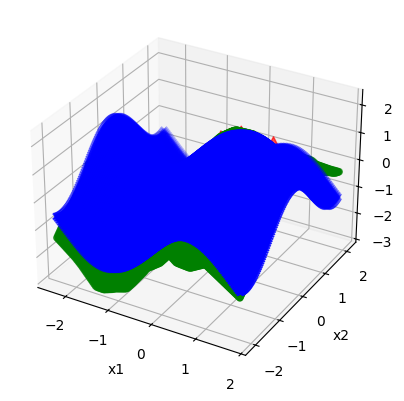

************************************************************************


In [34]:
###############################################Modified Code to 3D#########################################################
#############################3. different Hyperparameters new version with test loss  and add normalization and dropout#####################################################

# Import matplotlib for plotting purposes
import matplotlib
matplotlib.rcParams["text.usetex"] = False
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Sometimes, we need Numpy, but wherever possible, we prefer torch.
import numpy as np

# Import PyTorch
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader

# Float (32 bit) or Double (64 bit) precision? Choose!
torch.set_default_dtype(torch.float32)#64)
torch.set_num_threads(4) # Use _maximally_ 4 CPU cores

# This is a list to store the losses of the different hyperparameter configurations
train_losses_all = []
test_losses_all = []
models = []

# This is a list to store the hyperparameters of the training
# hyperparam_log = []

#device = torch.device("cpu")
# Choose a device for major calculations (if there is a special GPU card, you usually want that).

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")
device = torch.device(device)

# File path for saving the trained NN later.
# If only providing the file name (like here), the file will be generated in the same folder as the Python script
model_file = "mymodel.torch"

## The following script shows a data-driven training of a Neural Network.
## The data is generated in this script, too, by sampling from a function.
## The variables below are used to control this sampling
samples = 64
sample_min = -3
sample_max = 3
sample_span = sample_max - sample_min

## These parameters are usual hyperparameters of the NN and its training.
# batch_size = 8 # How many samples shall be presented to the NN, before running another optimizer step?
# hidden_dim = 16 # How many neurons shall there be in the hidden layer(s)?
input_dim = 2 # Input dimension of the NN (i.e. how many neurons are in the input layer?)
output_dim = 1 # Some for output

## Choose a criterion to evaluate the results. Here, we choose Mean Square error.
## The term "loss" means about the same as "remaining error" or "residual".
criterion = nn.MSELoss(reduction="mean")

## Here, we create the training data. In this example, we draw samples within the sampling interval and then pass it to
## e.g. the sin function (choose other functions to experiment with this script)
train_x = (sample_span * torch.rand(samples, 2) + sample_min * torch.ones(samples, 2))
train_y = torch.sin(train_x[:, 0]) + torch.cos(train_x[:, 1]) ##torch.pow(test_x, 2)


# add noise to the training data
noise_level = 0.2  # noise level
train_y += noise_level * torch.randn_like(train_y)

## This function logs the hyperparameters of the training
def log_hyperparameters(config, train_loss, test_loss, train_losses, train_accuracies, test_accuracies):
    hyperparam_log.append({
        "learning_rate": config["lr"],
        "hidden_dim": config["hidden_dim"],
        "batch_size": config["batch_size"],
        "epochs": config["epochs"],
        "final_train_loss": train_loss,
        "final_test_loss": test_loss,
        "final_train_accuracy": train_accuracies[-1],
        "final_test_accuracy": test_accuracies[-1],
        "train_losses": train_losses,
        "train_accuracies": train_accuracies,
        "test_accuracies": test_accuracies
    })


# print ("train_x", train_x)
# print ("train_y", train_y)

## Here, we create the test data. To show the effect of extrapolation and the detailed behavior of the NN,
## we choose points a bit outside the interval that we used for sampling training data. Also, we very dense points.
# test_x = torch.zeros(20*samples, 2)
# test_x[:, 0] = torch.linspace(sample_min - 0.5*sample_span, sample_max + 0.5*sample_span, test_x.size()[0])
# test_x[:, 1] = torch.linspace(sample_min - 0.5*sample_span, sample_max + 0.5*sample_span, test_x.size()[0])

# create test_x with meshgrid
grid_size = int(samples ** 0.5) * 2 
margin = 0.5  # only extend 1. from -5 to 5, extend to -5.5 to 5.5 
x1 = torch.linspace(sample_min - margin, sample_max + margin, 2*samples)
x2 = torch.linspace(sample_min - margin, sample_max + margin, 2*samples)
x1, x2 = torch.meshgrid(x1, x2) 
test_x = torch.zeros(2*samples*2*samples, 2)
test_x[:, 0] = x1.reshape(-1)
test_x[:, 1] = x2.reshape(-1)
test_y = torch.sin(test_x[:, 0]) + torch.cos(test_x[:, 1]) ##torch.pow(test_x, 2)

# standardize the data
scaler = StandardScaler()
train_x = torch.tensor(scaler.fit_transform(train_x), dtype=torch.float32)
test_x = torch.tensor(scaler.transform(test_x), dtype=torch.float32)

## We want a DataLoader to handle batching and shuffling of the training data for us.
## The DataLoader needs a TensorDataset, hence we create one from the Training data.
train_data = TensorDataset(train_x, train_y)
train_loader = DataLoader(train_data, shuffle=True, batch_size=batch_size, drop_last=False)


## This class creates the actual Neural Network.
class MLNet(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(MLNet, self).__init__()
        self.hidden_dim = hidden_dim

        ## In this case, I decided to pack the layers into a single container of type nn.Sequential
        ## This container is useful for Fully Connected NNs, where the output of each layer is just fed into the following layer.
        ## added dropout layer, which is a regularization technique to prevent overfitting
        self.fcnn1 = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            #nn.Tanh(),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            #nn.Linear(hidden_dim, hidden_dim),
            #nn.Dropout(p=0.1),  # Dropout layer with 30% of neurons being dropped，but it's not working well，the model underfitting, so change to 0.05
            #nn.ReLU(),
            nn.Linear(hidden_dim, output_dim),
        ) ## That network here has exactly 1 hidden layer (comment out some lines or write new ones to add more layers)
        ## nn.Linear is in the pictures represented by the arrows and has the weights (and biases) which are the
        ## parameters of the NN.
        ## nn.ReLU and Tanh are examples for activation functions - in the pictures, these are the bubbles / neurons.
        ## Usually, the pattern is interchanging between one linear layer, one activation function, one linear layer, one activation function and so on

    ## It is required to write a function that is executed when calling the NN model.
    ## Usually, it takes the input data and passes it through the layers.
    ## Here, it is sufficient to call the sequential container since this container does exactly this job.
    ## But this function "forward" could also be used to set up more complex NN architectures with more complex data flows
    def forward(self, x):
        out = self.fcnn1(x)
        return out

## This function performs a test run with the NN.
## It takes the NN model and the test data, passes the test inputs through the network and
## compares it with the target values = test outputs = targets
## and based on that calculates the loss value
def evaluate(model, test_x, test_y):
    ## For testing, we don't need the autograd feature/ protocol of all calculation steps
    ## So, save some time and disable grad tracking.
    with torch.no_grad():
        model.eval() ## Set the NN model into evaluation mode
        outputs = [] ## Create empty lists to store the results
        targets = []
        testlosses = []

        out = model(test_x.to(device)) ## Call the model, i.e. perform the actual inference

        ## Move the output quantities to the CPU, detach them from the tensor operation book-keeping and convert them to numpy arrays/ vectors.
        ## This is all necessary for plotting
        outputs.append(out.cpu().detach().numpy())
        targets.append(test_y.cpu().detach().numpy())
        testlosses.append(criterion(out, test_y.to(device)).item())

    ## Now return that in form of a triple of variables
    return outputs, targets, testlosses

## This calls the evaluate function and takes care of the plotting.
def eval_and_plot(model):
        ## matplotlib tries to be similar to the plot functions of matlab  (admittedly, the commands have to begin with "plt.", but the rest
        ## is quite similar.)

        # create a 3D plot
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        ## Call the network on the test data
        net_outputs_test, targets_test, testlosses = evaluate(model, test_x, test_y)   
        # Plot the targets first in blue (which means to plot the actual function over the whole test interval)
        #ax.plot(test_x[:, 0], test_x[:, 1], targets_test[0], color="-b", label="Target")
        ax.scatter(test_x[:, 0], test_x[:, 1], targets_test[0], c='b', marker='x', label='Target')
        ax.set_xlabel('x1')
        ax.set_ylabel('x2')
        ax.set_zlabel('y')

        ## Call the network on the training data
        net_outputs_train, targets_train, testlosses = evaluate(model, train_x, train_y)
        ## First, plot the targets in red, i.e. plot the training data set
        ax.scatter(train_x[:, 0], train_x[:, 1], targets_train[0], c='r', s=100, marker='^', label='Target')

        ## Now, plot the output of the NN on the whole test interval in green
        ## This allows us to see how the NN performs for interpolation as well as for extrapolation
        ax.scatter(test_x[:, 0], test_x[:, 1], net_outputs_test[0].reshape(-1), c='g', marker='o', label='Learned')
        print("net_outputs_test[0]", net_outputs_test[0].reshape(-1))

        ## All plotting is done, open the plot window
        plt.show()

def calculate_accuracy(predictions, targets, threshold = train_y.std().item() * 0.1):
    """
    Calculate accuracy for regression by checking if predictions are within a certain range of targets.
    Args:
        predictions: Predicted values (torch.Tensor).
        targets: Actual values (torch.Tensor).
        threshold: Acceptable error range for considering a prediction as correct.
    Returns:
        Accuracy as a percentage (float).
    """
    correct = torch.abs(predictions - targets) <= threshold
    return correct.float().mean().item() * 100  # Convert to percentage

def train_with_logging(train_loader, lr_run, hidden_dim_run, EPOCHS):
    model = MLNet(input_dim, hidden_dim_run, output_dim).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr_run, weight_decay=0)

    train_losses = []
    test_losses = []
    train_accuracies = []
    test_accuracies = []

    for epoch in range(EPOCHS):
        model.train()
        avg_loss = 0.
        for x, label in train_loader:
            model.zero_grad()
            out = model(x.to(device)).squeeze(-1)
            loss = criterion(out, label.to(device))
            loss.backward()
            optimizer.step()
            avg_loss += loss.item()
        
        # Store train loss for the epoch
        train_losses.append(avg_loss / len(train_loader))

        # Evaluate train and test accuracy
        with torch.no_grad():
            model.eval()
            train_out = model(train_x.to(device)).squeeze(-1)
            train_accuracy = calculate_accuracy(train_out, train_y.to(device))
            train_accuracies.append(train_accuracy)

            test_out = model(test_x.to(device)).squeeze(-1)
            test_loss = criterion(test_out, test_y.to(device)).item()
            test_losses.append(test_loss)

            test_accuracy = calculate_accuracy(test_out, test_y.to(device))
            test_accuracies.append(test_accuracy)

        avg_final_train_acc = np.mean(train_accuracies[-100:]) if len(train_accuracies) >= 100 else train_accuracies[-1]
        avg_final_test_acc = np.mean(test_accuracies[-100:]) if len(test_accuracies) >= 100 else test_accuracies[-1]


    return model, train_losses, test_losses, train_accuracies, test_accuracies, avg_final_train_acc, avg_final_test_acc



## As the functions written before are just function definitions,
## those functions still have to be called.
## This is done here.
## Train the model
# model = train(train_loader, lr, epochs)

## Test that saving the model worked: load it from file
# model = torch.load(model_file)
## and evaluate and plot once
# eval_and_plot(model)

###################### Hyperparameter Search Loop ######################
hyperparam_log = []  # reset hyperparam_log

hyperparam_configs = [
    # control variable: learning rate (lr) changes
    {"lr": 0.02,    "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.01,    "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.005,   "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.002,   "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.0005,  "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.0001,  "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},

    # control variable: hidden dimension (hidden_dim) changes
    {"lr": 0.001,   "hidden_dim": 8,  "batch_size": 8,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 32, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 64, "batch_size": 8,  "epochs": 2000},

    # control variable: batch size (batch_size) changes
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 4,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 16, "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 32, "epochs": 2000},

    # control variable: epochs changes
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 8,  "epochs": 1000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 8,  "epochs": 3000},

]

for config in hyperparam_configs:
    lr_run          = config["lr"]
    hidden_dim_run  = config["hidden_dim"]
    batch_size_run  = config["batch_size"]
    epochs_run      = config["epochs"]

    print(f"\n**Running training with lr={lr_run}, hidden_dim={hidden_dim_run}, batch_size={batch_size_run}, epochs={epochs_run}")

    # Train the model with logging
    model, train_losses, test_losses, train_accuracies, test_accuracies, avg_train_accracy, avg_test_accuracy = train_with_logging(train_loader, lr_run, hidden_dim_run, epochs_run)

    # Plot the losses and accuracies
    plt.figure(figsize=(12, 6))
    
    # Loss plot
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label="Train Loss")
    plt.plot(test_losses, label="Test Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Train vs Test Loss")
    plt.legend()

    # Accuracy plot
    plt.subplot(1, 2, 2)
    plt.plot(train_accuracies, label="Train Accuracy")
    plt.plot(test_accuracies, label="Test Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy (%)")
    plt.title("Train vs Test Accuracy")
    plt.legend()

    plt.tight_layout()
    plt.show()

    print(f"lr={lr_run}, hidden_dim={hidden_dim_run}, batch_size={batch_size_run}, epochs={epochs_run}")
    print(f"Final Train Loss: {train_losses[-1]:.4f}, Final Test Loss: {test_losses[-1]:.4f}")
    print(f"Final Train Accuracy: {train_accuracies[-1]:.2f}%, Final Test Accuracy: {test_accuracies[-1]:.2f}%\n")
    print(f"Average Train Accuracy (last 100 epochs): {avg_train_accracy:.2f}%, Average Test Accuracy (last 100 epochs): {avg_test_accuracy:.2f}%\n")

    eval_and_plot(model)  # plot the training results
    print("************************************************************************")

###################### Hyperparameter Search Loop ######################


Using cpu device

**Running training with lr=0.02, hidden_dim=16, batch_size=8, epochs=2000


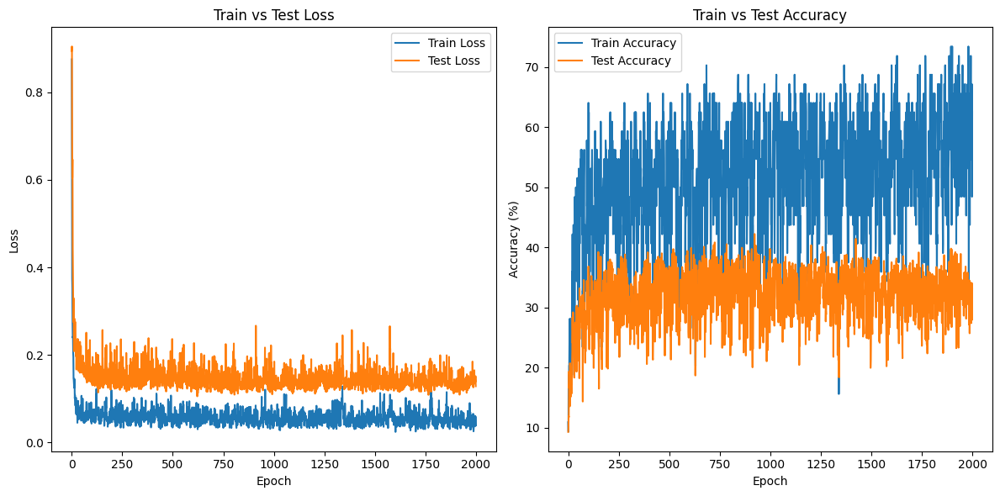

lr=0.02, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0392, Final Test Loss: 0.1287
Final Train Accuracy: 62.50%, Final Test Accuracy: 33.14%

Average Train Accuracy (last 100 epochs): 59.48%, Average Test Accuracy (last 100 epochs): 32.78%

net_outputs_test[0] [-1.5779767  -1.5319135  -1.4858508  ...  0.01817432  0.00734198
 -0.00349018]


d:\miniconda\Lib\site-packages\torch\nn\modules\loss.py:608: UserWarning: Using a target size (torch.Size([16384])) that is different to the input size (torch.Size([16384, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
d:\miniconda\Lib\site-packages\torch\nn\modules\loss.py:608: UserWarning: Using a target size (torch.Size([64])) that is different to the input size (torch.Size([64, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


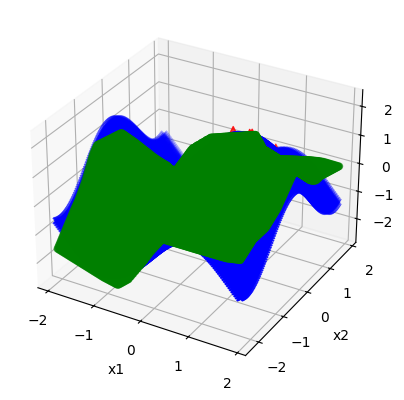

************************************************************************

**Running training with lr=0.01, hidden_dim=16, batch_size=8, epochs=2000


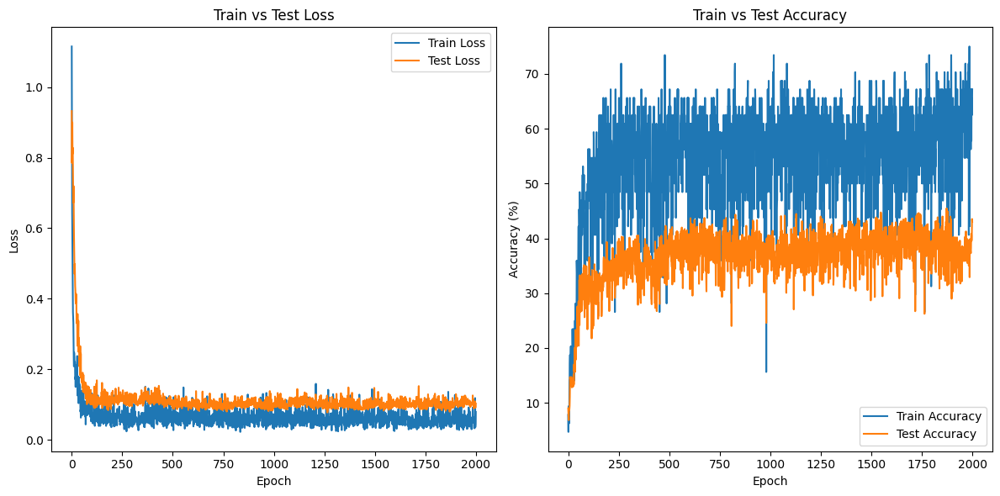

lr=0.01, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0789, Final Test Loss: 0.1028
Final Train Accuracy: 67.19%, Final Test Accuracy: 43.00%

Average Train Accuracy (last 100 epochs): 59.31%, Average Test Accuracy (last 100 epochs): 37.29%

net_outputs_test[0] [-1.5222046  -1.4904958  -1.4587866  ... -0.10365231 -0.10365231
 -0.10365231]


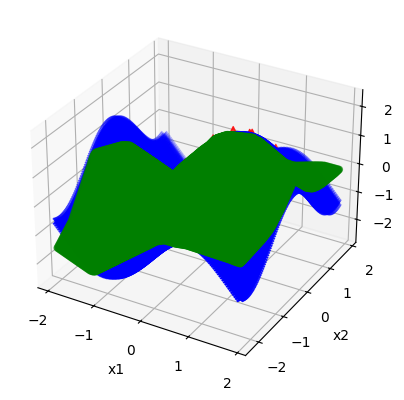

************************************************************************

**Running training with lr=0.005, hidden_dim=16, batch_size=8, epochs=2000


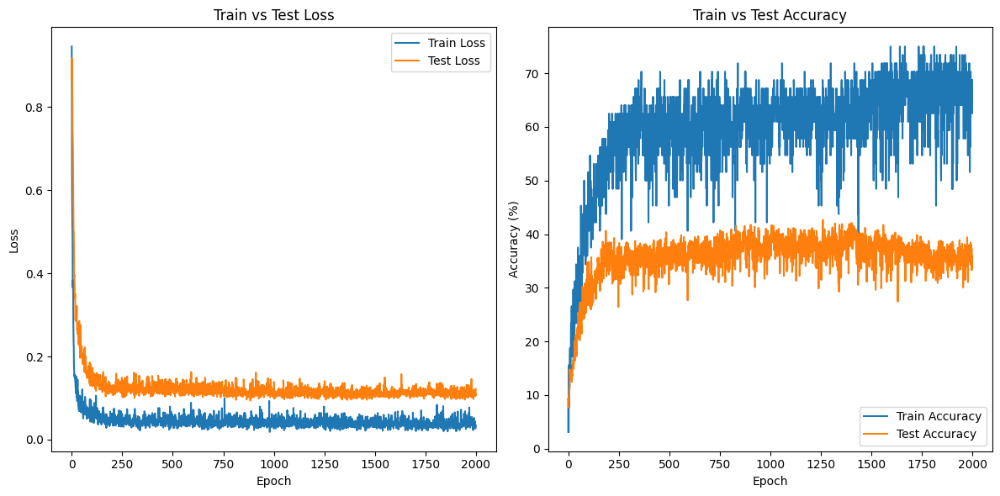

lr=0.005, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0345, Final Test Loss: 0.1218
Final Train Accuracy: 68.75%, Final Test Accuracy: 33.62%

Average Train Accuracy (last 100 epochs): 65.88%, Average Test Accuracy (last 100 epochs): 35.70%

net_outputs_test[0] [-1.4744042  -1.4477631  -1.4211217  ... -0.04898987 -0.04578884
 -0.04258786]


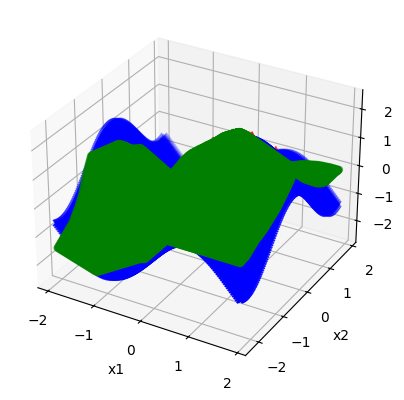

************************************************************************

**Running training with lr=0.002, hidden_dim=16, batch_size=8, epochs=2000


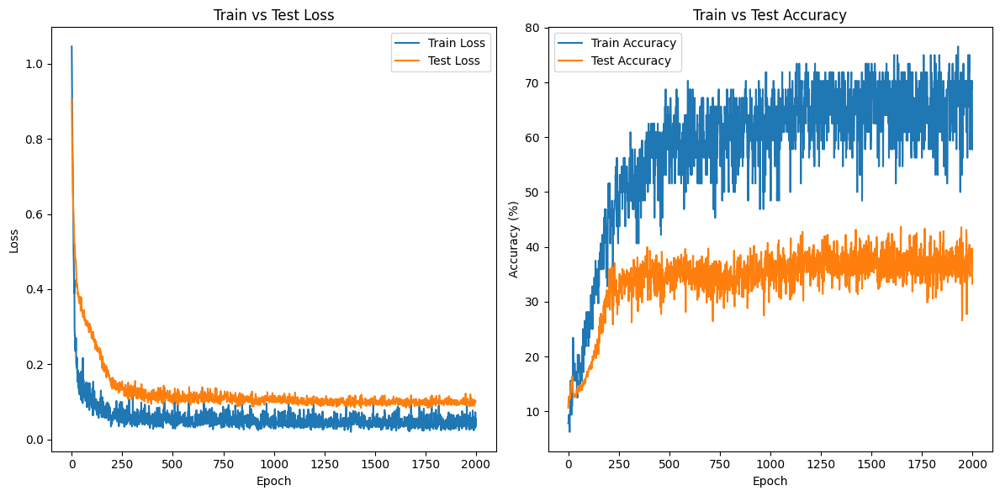

lr=0.002, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0553, Final Test Loss: 0.1017
Final Train Accuracy: 57.81%, Final Test Accuracy: 33.28%

Average Train Accuracy (last 100 epochs): 66.81%, Average Test Accuracy (last 100 epochs): 37.19%

net_outputs_test[0] [-1.5310559  -1.5016476  -1.4722393  ... -0.40650693 -0.40390608
 -0.4013053 ]


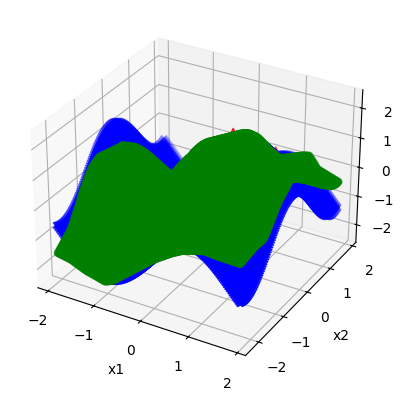

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=8, epochs=2000


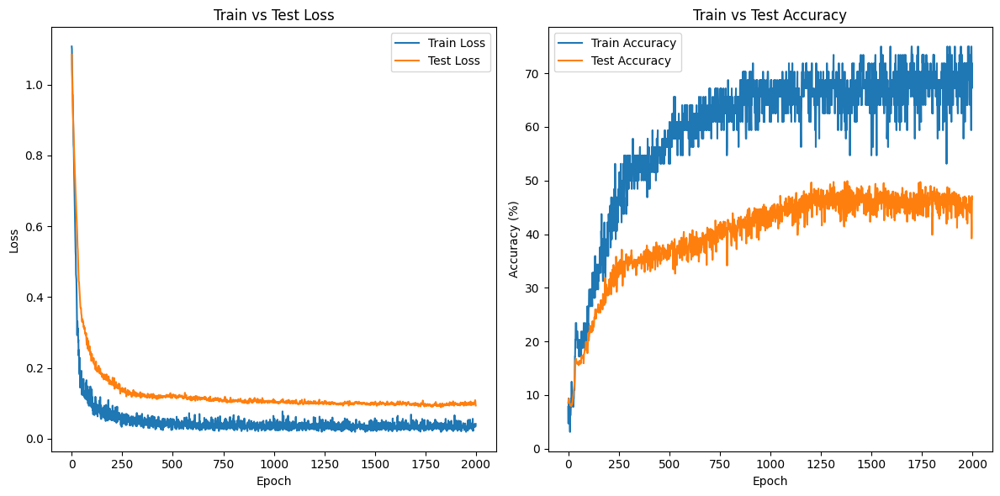

lr=0.001, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0419, Final Test Loss: 0.0940
Final Train Accuracy: 70.31%, Final Test Accuracy: 46.56%

Average Train Accuracy (last 100 epochs): 68.70%, Average Test Accuracy (last 100 epochs): 45.34%

net_outputs_test[0] [-1.6982386  -1.6570866  -1.6159348  ... -0.05832282 -0.0646231
 -0.07092331]


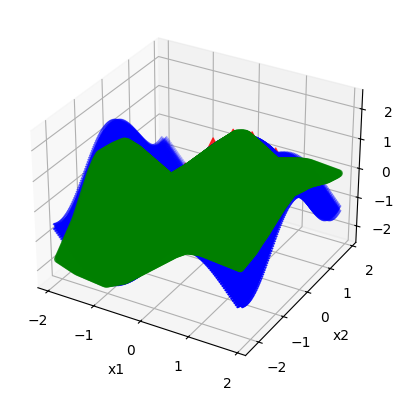

************************************************************************

**Running training with lr=0.0005, hidden_dim=16, batch_size=8, epochs=2000


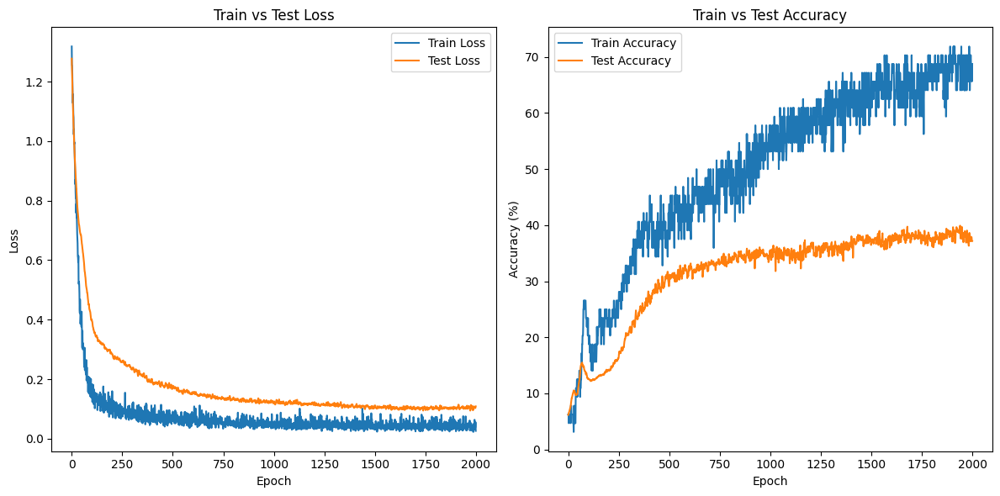

lr=0.0005, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0261, Final Test Loss: 0.1085
Final Train Accuracy: 68.75%, Final Test Accuracy: 37.17%

Average Train Accuracy (last 100 epochs): 68.16%, Average Test Accuracy (last 100 epochs): 38.24%

net_outputs_test[0] [-1.6613476  -1.6208978  -1.5804477  ... -0.07014012 -0.07307397
 -0.07600781]


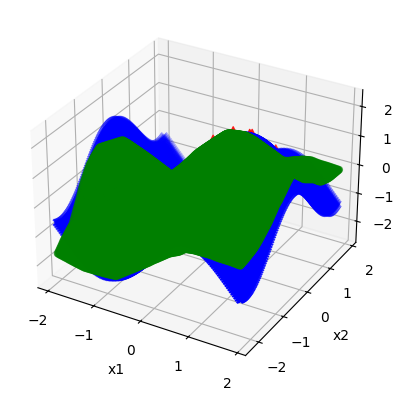

************************************************************************

**Running training with lr=0.0001, hidden_dim=16, batch_size=8, epochs=2000


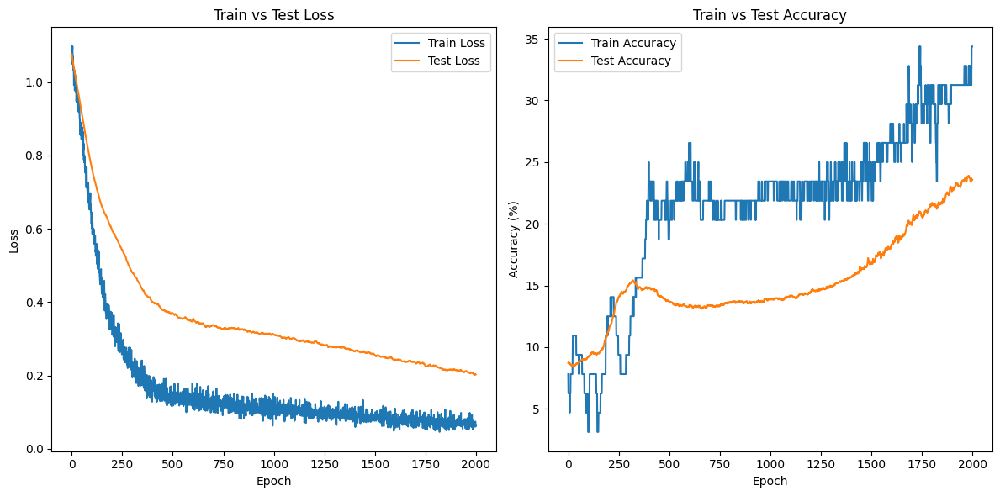

lr=0.0001, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0650, Final Test Loss: 0.2026
Final Train Accuracy: 34.38%, Final Test Accuracy: 23.56%

Average Train Accuracy (last 100 epochs): 31.61%, Average Test Accuracy (last 100 epochs): 23.35%

net_outputs_test[0] [-2.0713394  -2.0264175  -1.9814948  ... -0.25572953 -0.2784839
 -0.30123866]


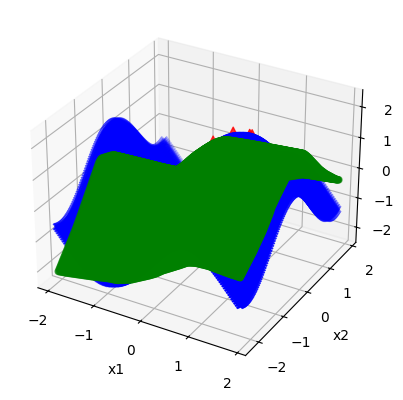

************************************************************************

**Running training with lr=0.001, hidden_dim=8, batch_size=8, epochs=2000


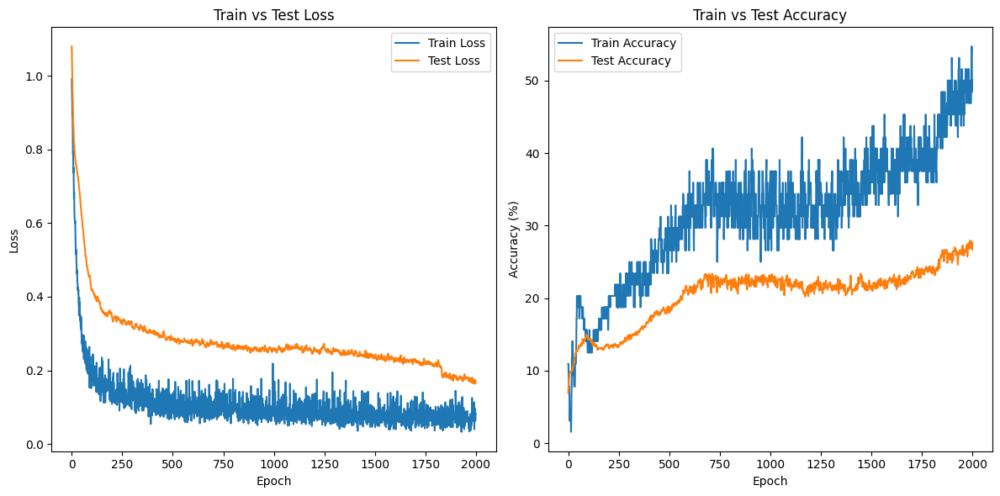

lr=0.001, hidden_dim=8, batch_size=8, epochs=2000
Final Train Loss: 0.0833, Final Test Loss: 0.1662
Final Train Accuracy: 50.00%, Final Test Accuracy: 26.70%

Average Train Accuracy (last 100 epochs): 48.14%, Average Test Accuracy (last 100 epochs): 26.57%

net_outputs_test[0] [-2.2072647  -2.1597714  -2.1122773  ... -0.25615558 -0.25399545
 -0.25183567]


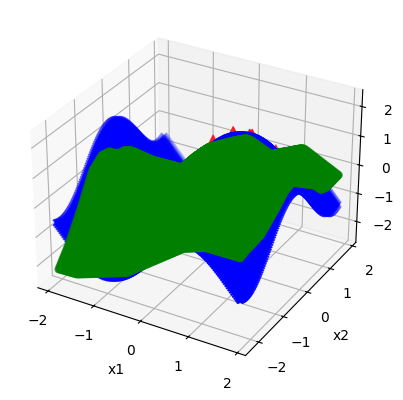

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=8, epochs=2000


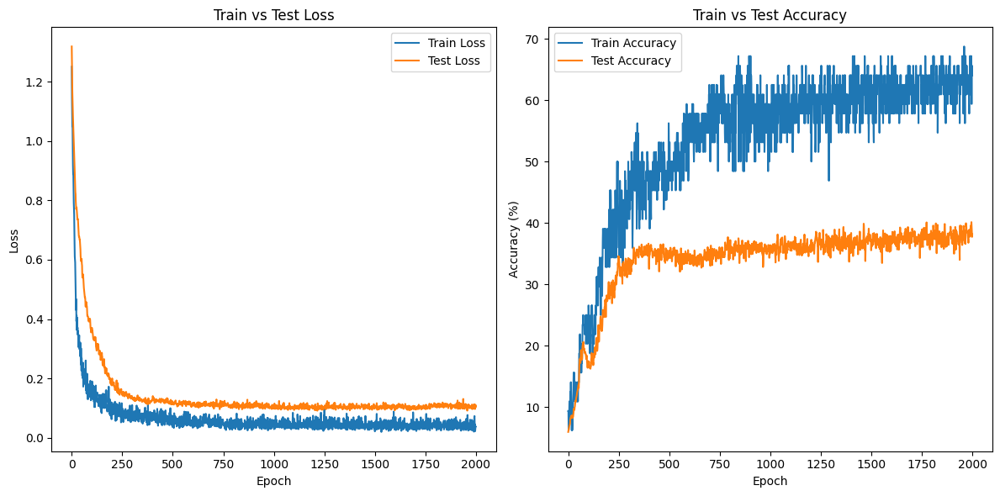

lr=0.001, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0378, Final Test Loss: 0.1049
Final Train Accuracy: 64.06%, Final Test Accuracy: 38.15%

Average Train Accuracy (last 100 epochs): 62.61%, Average Test Accuracy (last 100 epochs): 37.99%

net_outputs_test[0] [-1.4833436  -1.4533881  -1.4234324  ... -0.11226922 -0.12186787
 -0.1314664 ]


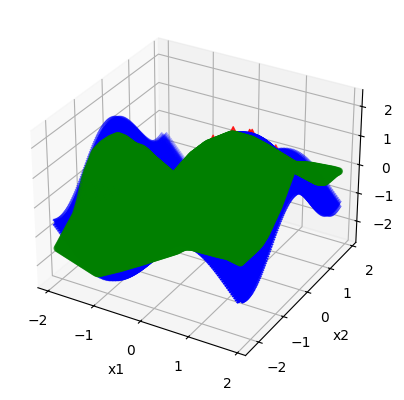

************************************************************************

**Running training with lr=0.001, hidden_dim=32, batch_size=8, epochs=2000


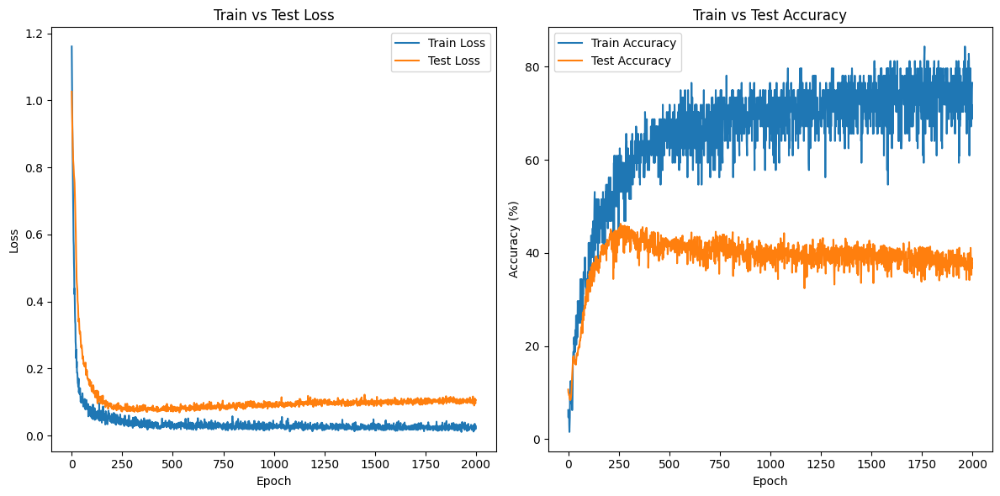

lr=0.001, hidden_dim=32, batch_size=8, epochs=2000
Final Train Loss: 0.0286, Final Test Loss: 0.1068
Final Train Accuracy: 76.56%, Final Test Accuracy: 37.78%

Average Train Accuracy (last 100 epochs): 74.38%, Average Test Accuracy (last 100 epochs): 38.21%

net_outputs_test[0] [-1.6303104  -1.5985702  -1.5668302  ... -0.20354858 -0.21815288
 -0.23354268]


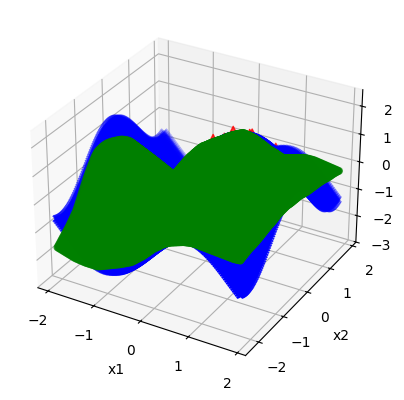

************************************************************************

**Running training with lr=0.001, hidden_dim=64, batch_size=8, epochs=2000


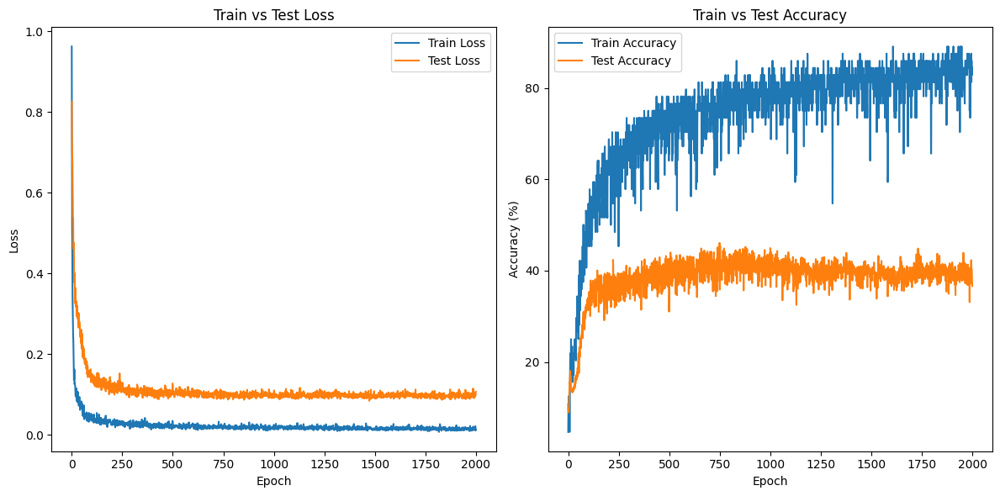

lr=0.001, hidden_dim=64, batch_size=8, epochs=2000
Final Train Loss: 0.0127, Final Test Loss: 0.1066
Final Train Accuracy: 84.38%, Final Test Accuracy: 36.61%

Average Train Accuracy (last 100 epochs): 83.58%, Average Test Accuracy (last 100 epochs): 39.40%

net_outputs_test[0] [-1.3366442  -1.3184432  -1.3031054  ...  0.03316928  0.0309769
  0.02730664]


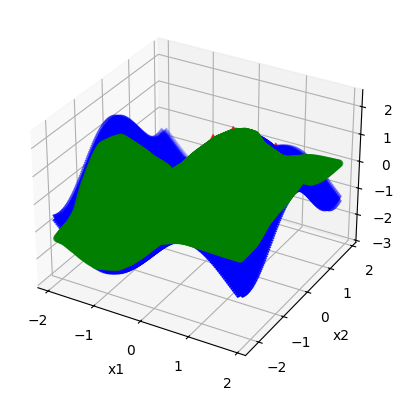

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=4, epochs=2000


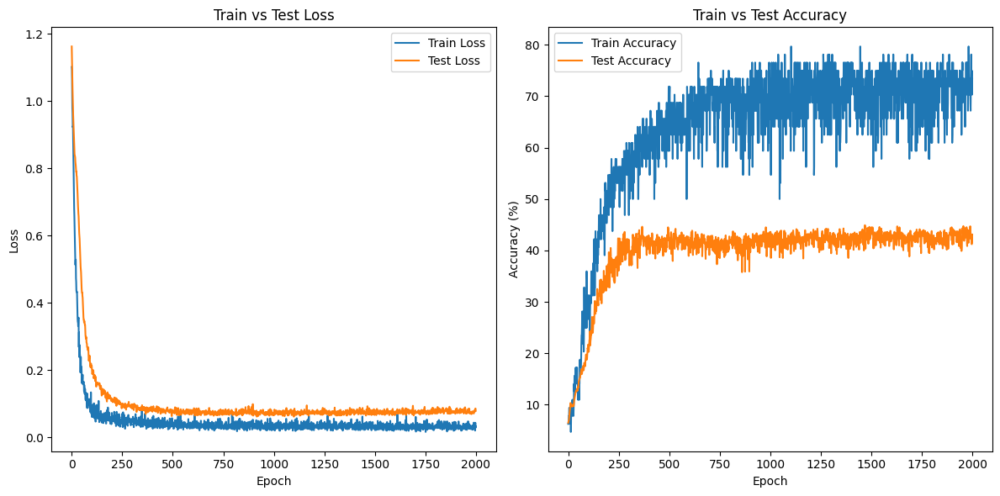

lr=0.001, hidden_dim=16, batch_size=4, epochs=2000
Final Train Loss: 0.0322, Final Test Loss: 0.0786
Final Train Accuracy: 73.44%, Final Test Accuracy: 43.10%

Average Train Accuracy (last 100 epochs): 71.62%, Average Test Accuracy (last 100 epochs): 42.79%

net_outputs_test[0] [-1.5237323  -1.4879178  -1.4521033  ... -0.70032537 -0.7085812
 -0.7175331 ]


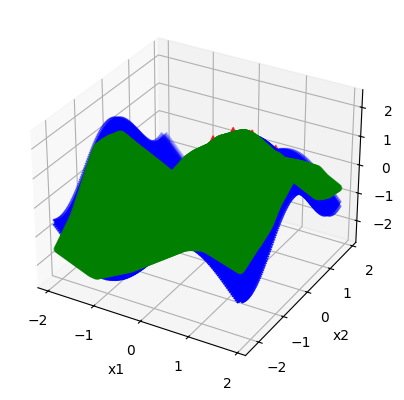

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=8, epochs=2000


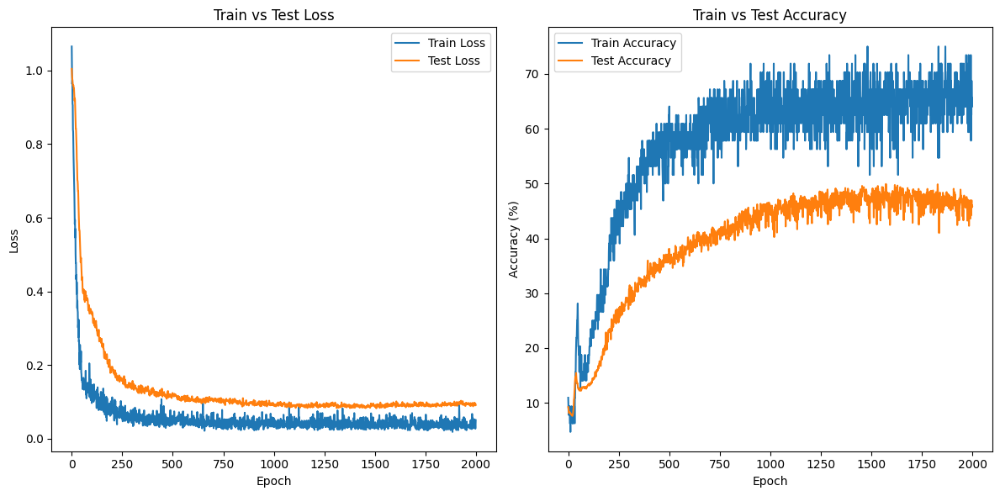

lr=0.001, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0503, Final Test Loss: 0.0911
Final Train Accuracy: 64.06%, Final Test Accuracy: 45.92%

Average Train Accuracy (last 100 epochs): 65.89%, Average Test Accuracy (last 100 epochs): 46.24%

net_outputs_test[0] [-1.6080027  -1.5731479  -1.5382929  ...  0.03608818  0.03608818
  0.03608818]


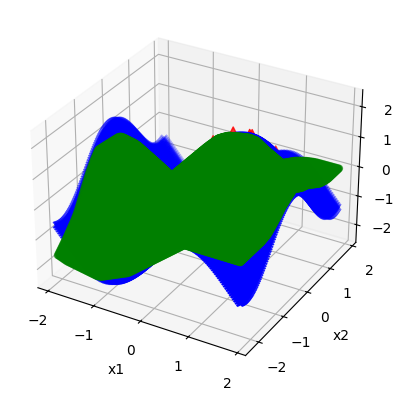

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=16, epochs=2000


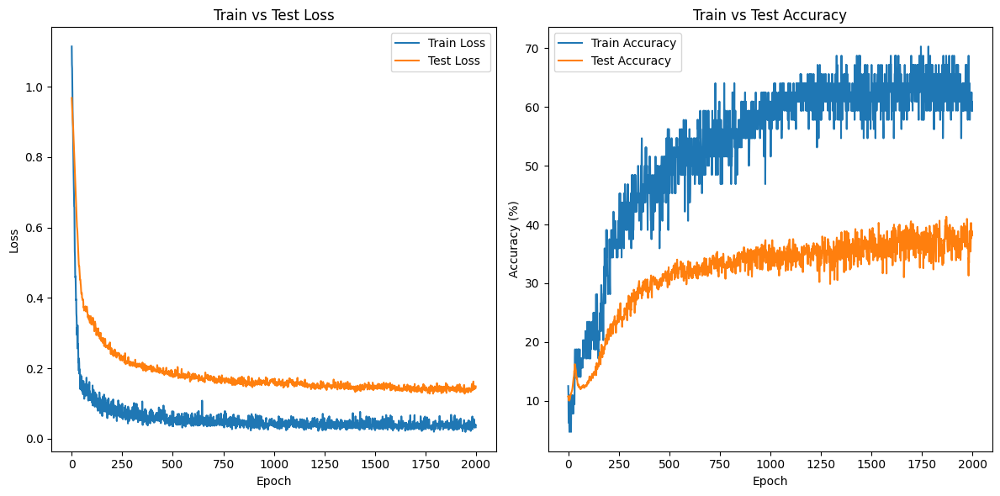

lr=0.001, hidden_dim=16, batch_size=16, epochs=2000
Final Train Loss: 0.0326, Final Test Loss: 0.1488
Final Train Accuracy: 59.38%, Final Test Accuracy: 38.15%

Average Train Accuracy (last 100 epochs): 62.56%, Average Test Accuracy (last 100 epochs): 37.23%

net_outputs_test[0] [-1.9648274  -1.9194789  -1.8741299  ...  0.20474447  0.19090262
  0.17706078]


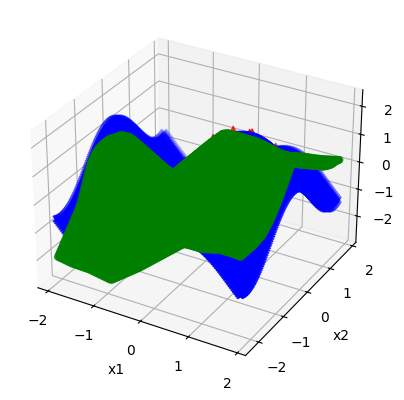

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=32, epochs=2000


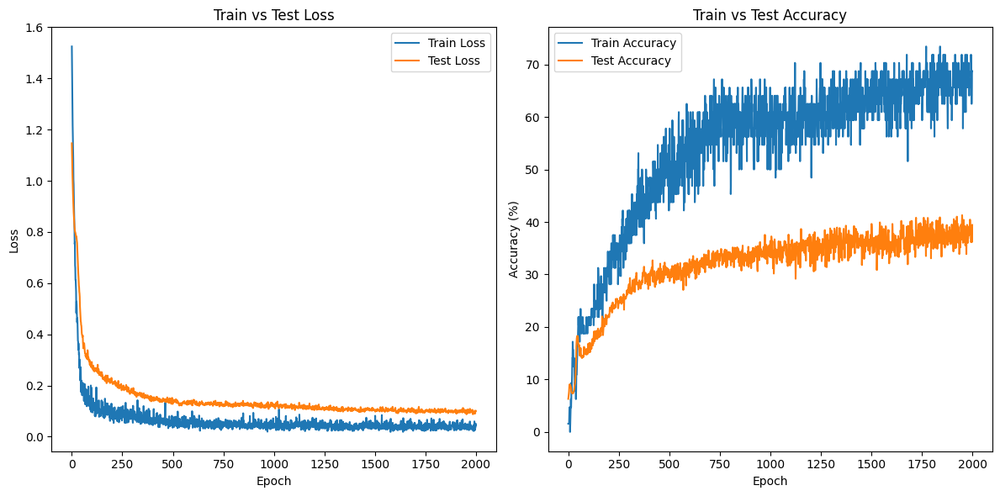

lr=0.001, hidden_dim=16, batch_size=32, epochs=2000
Final Train Loss: 0.0432, Final Test Loss: 0.1005
Final Train Accuracy: 68.75%, Final Test Accuracy: 39.43%

Average Train Accuracy (last 100 epochs): 67.12%, Average Test Accuracy (last 100 epochs): 37.87%

net_outputs_test[0] [-1.857413   -1.8146799  -1.7719467  ... -0.19016847 -0.21275863
 -0.23534897]


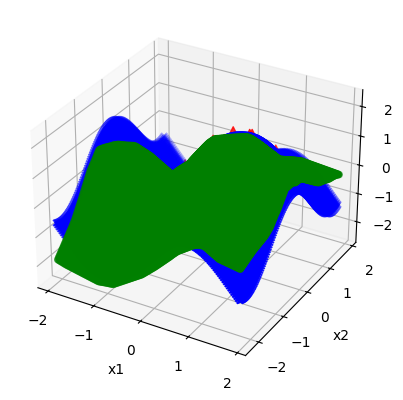

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=8, epochs=1000


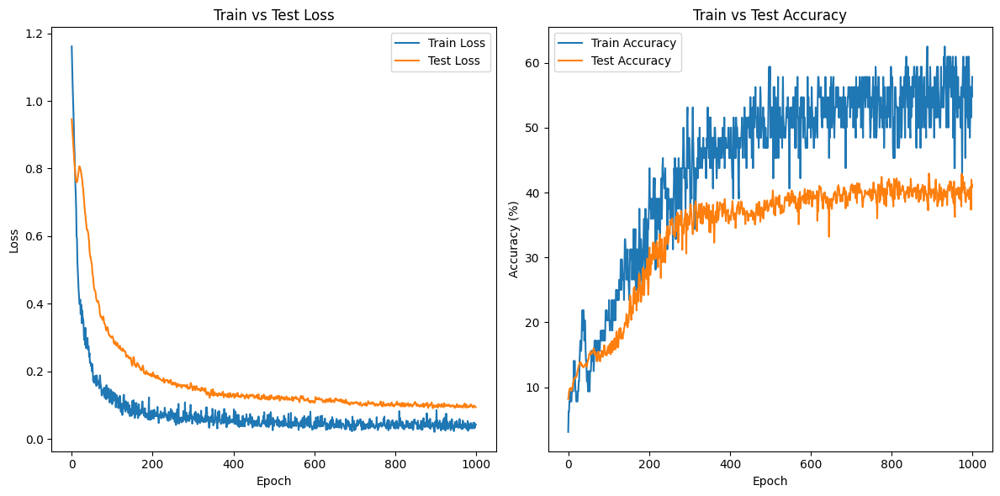

lr=0.001, hidden_dim=16, batch_size=8, epochs=1000
Final Train Loss: 0.0416, Final Test Loss: 0.0940
Final Train Accuracy: 57.81%, Final Test Accuracy: 41.16%

Average Train Accuracy (last 100 epochs): 55.02%, Average Test Accuracy (last 100 epochs): 39.99%

net_outputs_test[0] [-1.8721178  -1.829288   -1.7864578  ... -0.40993446 -0.41366225
 -0.41739017]


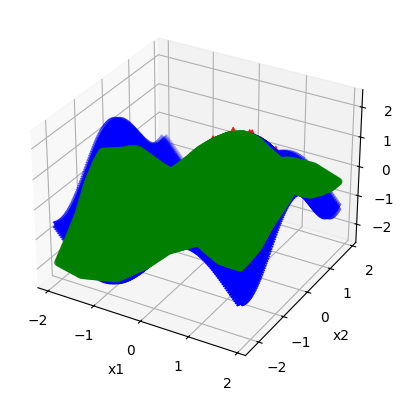

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=8, epochs=2000


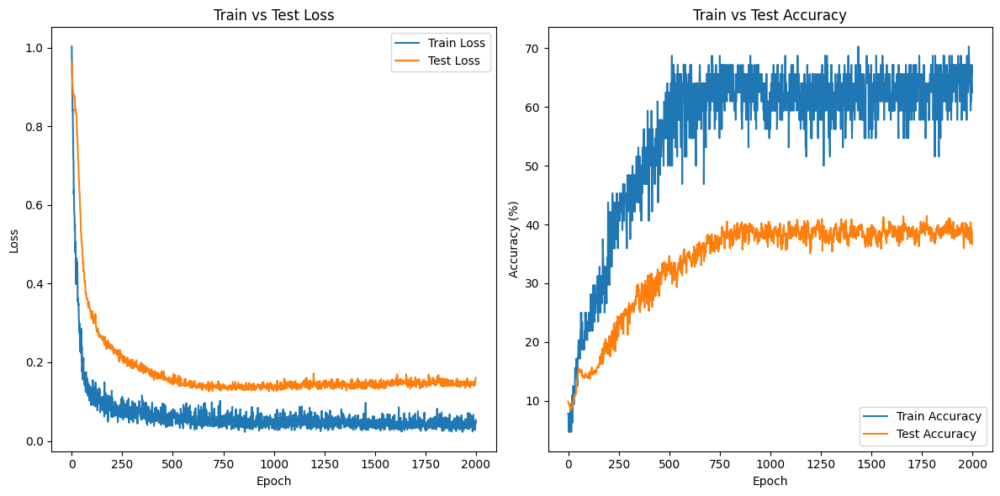

lr=0.001, hidden_dim=16, batch_size=8, epochs=2000
Final Train Loss: 0.0533, Final Test Loss: 0.1605
Final Train Accuracy: 62.50%, Final Test Accuracy: 36.64%

Average Train Accuracy (last 100 epochs): 64.30%, Average Test Accuracy (last 100 epochs): 38.72%

net_outputs_test[0] [-1.6181617  -1.5841769  -1.5501919  ...  0.22662756  0.22587878
  0.22512996]


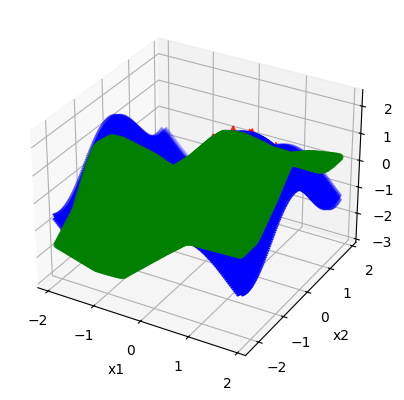

************************************************************************

**Running training with lr=0.001, hidden_dim=16, batch_size=8, epochs=3000


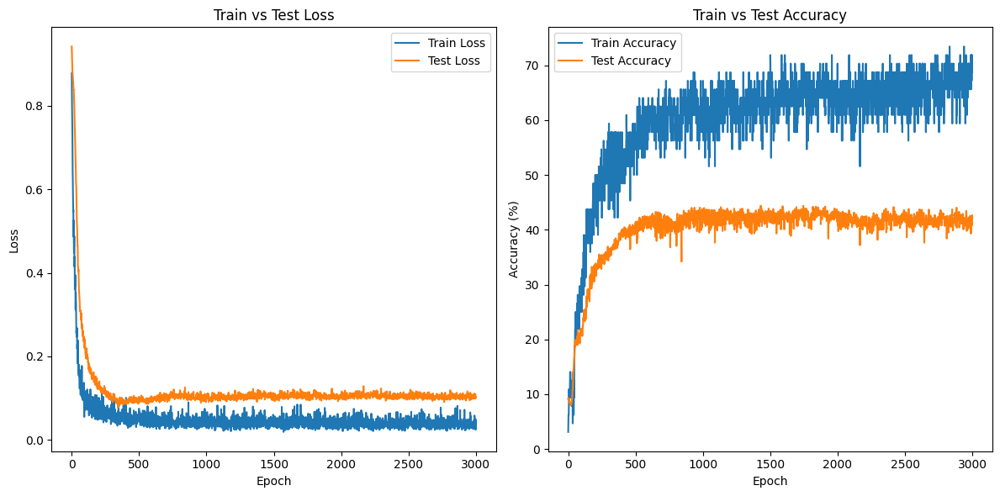

lr=0.001, hidden_dim=16, batch_size=8, epochs=3000
Final Train Loss: 0.0247, Final Test Loss: 0.1024
Final Train Accuracy: 68.75%, Final Test Accuracy: 42.27%

Average Train Accuracy (last 100 epochs): 67.55%, Average Test Accuracy (last 100 epochs): 41.62%

net_outputs_test[0] [-1.523474   -1.4868997  -1.4503253  ... -0.121474   -0.1310395
 -0.14060497]


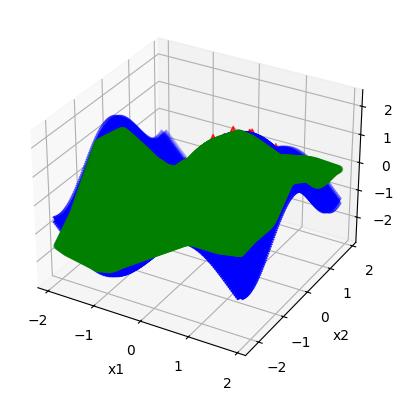

************************************************************************


ValueError: x and y must be the same size

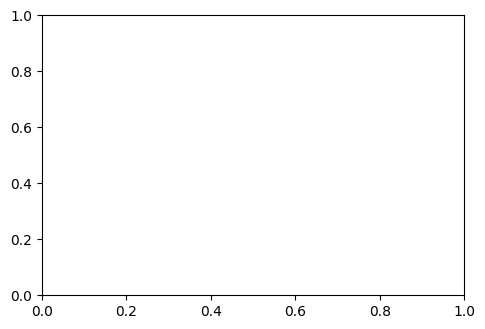

In [35]:
###############################################Modified Code to 3D#########################################################
#############################4. different Hyperparameters new version with test loss  and add normalization and dropout#####################################################

# Import matplotlib for plotting purposes
import matplotlib
matplotlib.rcParams["text.usetex"] = False
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Sometimes, we need Numpy, but wherever possible, we prefer torch.
import numpy as np

# Import PyTorch
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader

# Float (32 bit) or Double (64 bit) precision? Choose!
torch.set_default_dtype(torch.float32)#64)
torch.set_num_threads(4) # Use _maximally_ 4 CPU cores

# This is a list to store the losses of the different hyperparameter configurations
train_losses_all = []
test_losses_all = []
models = []

# This is a list to store the hyperparameters of the training
# hyperparam_log = []

#device = torch.device("cpu")
# Choose a device for major calculations (if there is a special GPU card, you usually want that).

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")
device = torch.device(device)

# File path for saving the trained NN later.
# If only providing the file name (like here), the file will be generated in the same folder as the Python script
model_file = "mymodel.torch"

## The following script shows a data-driven training of a Neural Network.
## The data is generated in this script, too, by sampling from a function.
## The variables below are used to control this sampling
samples = 64
sample_min = -3
sample_max = 3
sample_span = sample_max - sample_min

## These parameters are usual hyperparameters of the NN and its training.
# batch_size = 8 # How many samples shall be presented to the NN, before running another optimizer step?
# hidden_dim = 16 # How many neurons shall there be in the hidden layer(s)?
input_dim = 2 # Input dimension of the NN (i.e. how many neurons are in the input layer?)
output_dim = 1 # Some for output

## Choose a criterion to evaluate the results. Here, we choose Mean Square error.
## The term "loss" means about the same as "remaining error" or "residual".
criterion = nn.MSELoss(reduction="mean")

## Here, we create the training data. In this example, we draw samples within the sampling interval and then pass it to
## e.g. the sin function (choose other functions to experiment with this script)
train_x = (sample_span * torch.rand(samples, 2) + sample_min * torch.ones(samples, 2))
train_y = torch.sin(train_x[:, 0]) + torch.cos(train_x[:, 1]) ##torch.pow(test_x, 2)


# add noise to the training data
noise_level = 0.2  # noise level
train_y += noise_level * torch.randn_like(train_y)

## This function logs the hyperparameters of the training
def log_hyperparameters(config, train_loss, test_loss, train_losses, train_accuracies, test_accuracies):
    hyperparam_log.append({
        "learning_rate": config["lr"],
        "hidden_dim": config["hidden_dim"],
        "batch_size": config["batch_size"],
        "epochs": config["epochs"],
        "final_train_loss": train_loss,
        "final_test_loss": test_loss,
        "final_train_accuracy": train_accuracies[-1],
        "final_test_accuracy": test_accuracies[-1],
        "train_losses": train_losses,
        "train_accuracies": train_accuracies,
        "test_accuracies": test_accuracies
    })


# print ("train_x", train_x)
# print ("train_y", train_y)

## Here, we create the test data. To show the effect of extrapolation and the detailed behavior of the NN,
## we choose points a bit outside the interval that we used for sampling training data. Also, we very dense points.
# test_x = torch.zeros(20*samples, 2)
# test_x[:, 0] = torch.linspace(sample_min - 0.5*sample_span, sample_max + 0.5*sample_span, test_x.size()[0])
# test_x[:, 1] = torch.linspace(sample_min - 0.5*sample_span, sample_max + 0.5*sample_span, test_x.size()[0])

# create test_x with meshgrid
grid_size = int(samples ** 0.5) * 2 
margin = 0.5  # only extend 1. from -5 to 5, extend to -5.5 to 5.5 
x1 = torch.linspace(sample_min - margin, sample_max + margin, 2*samples)
x2 = torch.linspace(sample_min - margin, sample_max + margin, 2*samples)
x1, x2 = torch.meshgrid(x1, x2) 
test_x = torch.zeros(2*samples*2*samples, 2)
test_x[:, 0] = x1.reshape(-1)
test_x[:, 1] = x2.reshape(-1)
test_y = torch.sin(test_x[:, 0]) + torch.cos(test_x[:, 1]) ##torch.pow(test_x, 2)

# standardize the data
scaler = StandardScaler()
train_x = torch.tensor(scaler.fit_transform(train_x), dtype=torch.float32)
test_x = torch.tensor(scaler.transform(test_x), dtype=torch.float32)

## We want a DataLoader to handle batching and shuffling of the training data for us.
## The DataLoader needs a TensorDataset, hence we create one from the Training data.
train_data = TensorDataset(train_x, train_y)
train_loader = DataLoader(train_data, shuffle=True, batch_size=batch_size, drop_last=False)


## This class creates the actual Neural Network.
class MLNet(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(MLNet, self).__init__()
        self.hidden_dim = hidden_dim

        ## In this case, I decided to pack the layers into a single container of type nn.Sequential
        ## This container is useful for Fully Connected NNs, where the output of each layer is just fed into the following layer.
        ## added dropout layer, which is a regularization technique to prevent overfitting
        self.fcnn1 = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            #nn.Tanh(),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            #nn.Linear(hidden_dim, hidden_dim),
            nn.Dropout(p=0.1),  # Dropout layer with 30% of neurons being dropped，but it's not working well，the model underfitting, so change to 0.05
            #nn.ReLU(),
            nn.Linear(hidden_dim, output_dim),
        ) ## That network here has exactly 1 hidden layer (comment out some lines or write new ones to add more layers)
        ## nn.Linear is in the pictures represented by the arrows and has the weights (and biases) which are the
        ## parameters of the NN.
        ## nn.ReLU and Tanh are examples for activation functions - in the pictures, these are the bubbles / neurons.
        ## Usually, the pattern is interchanging between one linear layer, one activation function, one linear layer, one activation function and so on

    ## It is required to write a function that is executed when calling the NN model.
    ## Usually, it takes the input data and passes it through the layers.
    ## Here, it is sufficient to call the sequential container since this container does exactly this job.
    ## But this function "forward" could also be used to set up more complex NN architectures with more complex data flows
    def forward(self, x):
        out = self.fcnn1(x)
        return out

## This function performs a test run with the NN.
## It takes the NN model and the test data, passes the test inputs through the network and
## compares it with the target values = test outputs = targets
## and based on that calculates the loss value
def evaluate(model, test_x, test_y):
    ## For testing, we don't need the autograd feature/ protocol of all calculation steps
    ## So, save some time and disable grad tracking.
    with torch.no_grad():
        model.eval() ## Set the NN model into evaluation mode
        outputs = [] ## Create empty lists to store the results
        targets = []
        testlosses = []

        out = model(test_x.to(device)) ## Call the model, i.e. perform the actual inference

        ## Move the output quantities to the CPU, detach them from the tensor operation book-keeping and convert them to numpy arrays/ vectors.
        ## This is all necessary for plotting
        outputs.append(out.cpu().detach().numpy())
        targets.append(test_y.cpu().detach().numpy())
        testlosses.append(criterion(out, test_y.to(device)).item())

    ## Now return that in form of a triple of variables
    return outputs, targets, testlosses

## This calls the evaluate function and takes care of the plotting.
def eval_and_plot(model):
        ## matplotlib tries to be similar to the plot functions of matlab  (admittedly, the commands have to begin with "plt.", but the rest
        ## is quite similar.)

        # create a 3D plot
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        ## Call the network on the test data
        net_outputs_test, targets_test, testlosses = evaluate(model, test_x, test_y)   
        # Plot the targets first in blue (which means to plot the actual function over the whole test interval)
        #ax.plot(test_x[:, 0], test_x[:, 1], targets_test[0], color="-b", label="Target")
        ax.scatter(test_x[:, 0], test_x[:, 1], targets_test[0], c='b', marker='x', label='Target')
        ax.set_xlabel('x1')
        ax.set_ylabel('x2')
        ax.set_zlabel('y')

        ## Call the network on the training data
        net_outputs_train, targets_train, testlosses = evaluate(model, train_x, train_y)
        ## First, plot the targets in red, i.e. plot the training data set
        ax.scatter(train_x[:, 0], train_x[:, 1], targets_train[0], c='r', s=100, marker='^', label='Target')

        ## Now, plot the output of the NN on the whole test interval in green
        ## This allows us to see how the NN performs for interpolation as well as for extrapolation
        ax.scatter(test_x[:, 0], test_x[:, 1], net_outputs_test[0].reshape(-1), c='g', marker='o', label='Learned')
        print("net_outputs_test[0]", net_outputs_test[0].reshape(-1))

        ## All plotting is done, open the plot window
        plt.show()

def calculate_accuracy(predictions, targets, threshold = train_y.std().item() * 0.1):
    """
    Calculate accuracy for regression by checking if predictions are within a certain range of targets.
    Args:
        predictions: Predicted values (torch.Tensor).
        targets: Actual values (torch.Tensor).
        threshold: Acceptable error range for considering a prediction as correct.
    Returns:
        Accuracy as a percentage (float).
    """
    correct = torch.abs(predictions - targets) <= threshold
    return correct.float().mean().item() * 100  # Convert to percentage

def train_with_logging(train_loader, lr_run, hidden_dim_run, EPOCHS):
    model = MLNet(input_dim, hidden_dim_run, output_dim).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr_run, weight_decay=1e-5)

    train_losses = []
    test_losses = []
    train_accuracies = []
    test_accuracies = []

    for epoch in range(EPOCHS):
        model.train()
        avg_loss = 0.
        for x, label in train_loader:
            model.zero_grad()
            out = model(x.to(device)).squeeze(-1)
            loss = criterion(out, label.to(device))
            loss.backward()
            optimizer.step()
            avg_loss += loss.item()
        
        # Store train loss for the epoch
        train_losses.append(avg_loss / len(train_loader))

        # Evaluate train and test accuracy
        with torch.no_grad():
            model.eval()
            train_out = model(train_x.to(device)).squeeze(-1)
            train_accuracy = calculate_accuracy(train_out, train_y.to(device))
            train_accuracies.append(train_accuracy)

            test_out = model(test_x.to(device)).squeeze(-1)
            test_loss = criterion(test_out, test_y.to(device)).item()
            test_losses.append(test_loss)

            test_accuracy = calculate_accuracy(test_out, test_y.to(device))
            test_accuracies.append(test_accuracy)

        avg_final_train_acc = np.mean(train_accuracies[-100:]) if len(train_accuracies) >= 100 else train_accuracies[-1]
        avg_final_test_acc = np.mean(test_accuracies[-100:]) if len(test_accuracies) >= 100 else test_accuracies[-1]


    return model, train_losses, test_losses, train_accuracies, test_accuracies, avg_final_train_acc, avg_final_test_acc



## As the functions written before are just function definitions,
## those functions still have to be called.
## This is done here.
## Train the model
# model = train(train_loader, lr, epochs)

## Test that saving the model worked: load it from file
# model = torch.load(model_file)
## and evaluate and plot once
# eval_and_plot(model)

###################### Hyperparameter Search Loop ######################
hyperparam_log = []  # reset hyperparam_log

hyperparam_configs = [
    # control variable: learning rate (lr) changes
    {"lr": 0.02,    "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.01,    "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.005,   "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.002,   "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.0005,  "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.0001,  "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},

    # control variable: hidden dimension (hidden_dim) changes
    {"lr": 0.001,   "hidden_dim": 8,  "batch_size": 8,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 32, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 64, "batch_size": 8,  "epochs": 2000},

    # control variable: batch size (batch_size) changes
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 4,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 16, "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 32, "epochs": 2000},

    # control variable: epochs changes
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 8,  "epochs": 1000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 8,  "epochs": 2000},
    {"lr": 0.001,   "hidden_dim": 16, "batch_size": 8,  "epochs": 3000},

]

for config in hyperparam_configs:
    lr_run          = config["lr"]
    hidden_dim_run  = config["hidden_dim"]
    batch_size_run  = config["batch_size"]
    epochs_run      = config["epochs"]

    print(f"\n**Running training with lr={lr_run}, hidden_dim={hidden_dim_run}, batch_size={batch_size_run}, epochs={epochs_run}")

    # Train the model with logging
    model, train_losses, test_losses, train_accuracies, test_accuracies, avg_train_accracy, avg_test_accuracy = train_with_logging(train_loader, lr_run, hidden_dim_run, epochs_run)

    # Plot the losses and accuracies
    plt.figure(figsize=(12, 6))
    
    # Loss plot
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label="Train Loss")
    plt.plot(test_losses, label="Test Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Train vs Test Loss")
    plt.legend()

    # Accuracy plot
    plt.subplot(1, 2, 2)
    plt.plot(train_accuracies, label="Train Accuracy")
    plt.plot(test_accuracies, label="Test Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy (%)")
    plt.title("Train vs Test Accuracy")
    plt.legend()

    plt.tight_layout()
    plt.show()

    print(f"lr={lr_run}, hidden_dim={hidden_dim_run}, batch_size={batch_size_run}, epochs={epochs_run}")
    print(f"Final Train Loss: {train_losses[-1]:.4f}, Final Test Loss: {test_losses[-1]:.4f}")
    print(f"Final Train Accuracy: {train_accuracies[-1]:.2f}%, Final Test Accuracy: {test_accuracies[-1]:.2f}%\n")
    print(f"Average Train Accuracy (last 100 epochs): {avg_train_accracy:.2f}%, Average Test Accuracy (last 100 epochs): {avg_test_accuracy:.2f}%\n")

    eval_and_plot(model)  # plot the training results
    print("************************************************************************")

###################### Hyperparameter Search Loop ######################
# check if all hyperparameters are logged
if not lrs or not test_accuracies or not hidden_dims:
    print("Error: Some hyperparameter values or accuracies are empty.")
    print("lrs:", lrs)
    print("hidden_dims:", hidden_dims)
    print("test_accuracies:", test_accuracies)

# Plotting
plt.figure(figsize=(12, 8))

# Learning Rate vs Test Accuracy
plt.subplot(2, 2, 1)
plt.scatter(lrs, test_accuracies, c='orange', marker='o')
plt.xlabel("Learning Rate")
plt.ylabel("Test Accuracy (%)")
plt.title("Test Accuracy vs Learning Rate")
plt.xscale('log')

# Hidden Dimension vs Test Accuracy
plt.subplot(2, 2, 2)
plt.scatter(hidden_dims, test_accuracies, c='blue', marker='o')
plt.xlabel("Hidden Dimension")
plt.ylabel("Test Accuracy (%)")
plt.title("Test Accuracy vs Hidden Dimension")

# Batch Size vs Test Accuracy
plt.subplot(2, 2, 3)
plt.scatter(batch_sizes, test_accuracies, c='green', marker='o')
plt.xlabel("Batch Size")
plt.ylabel("Test Accuracy (%)")
plt.title("Test Accuracy vs Batch Size")

# Epochs vs Test Accuracy
plt.subplot(2, 2, 4)
plt.scatter(epochs_list, test_accuracies, c='purple', marker='o')
plt.xlabel("Epochs")
plt.ylabel("Test Accuracy (%)")
plt.title("Test Accuracy vs Epochs")

plt.tight_layout()
plt.show()


###################### Compare final results ######################
print("\nComparison of final results:")
for entry in hyperparam_log:
    print(f"Config: lr={entry['learning_rate']}, hidden_dim={entry['hidden_dim']}, "
          f"batch_size={entry['batch_size']}, epochs={entry['epochs']} "
          f"=> Train Loss={entry['final_train_loss']:.4f}, "
          f"Test Loss={entry['final_test_loss']:.4f}, "
          f"Train Accuracy={entry['final_train_accuracy']:.2f}%, "
          f"Test Accuracy={entry['final_test_accuracy']:.2f}%")



## This function is used to plot the hyperparameter logs
#plot_hyperparameter_logs()